In [2]:
# Imports...

import getpass
import h5py
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.markers as markers
from matplotlib.colors import LogNorm
import os
import json
import numpy as np
import pandas as pd
import pickle
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm

In [3]:
# Get permission to access EOS (Insert your NICE password)

os.system("echo %s | kinit" % getpass.getpass())

········


0

In [5]:
PDs  = {1: 'BTagCSV',
        2: 'BTagMu',
        3: 'Charmonium',
        4: 'DisplacedJet',
        5: 'DoubleEG',
        6: 'DoubleMuon',
        7: 'DoubleMuonLowMass',
        8: 'FSQJets',
        9: 'HighMultiplicityEOF',
        10: 'HTMHT',
        11: 'JetHT',
        12: 'MET',
        13: 'MinimumBias',
        14: 'MuonEG',
        15: 'MuOnia',
        16: 'NoBPTX',
        17: 'SingleElectron',
        18: 'SingleMuon',
        19: 'SinglePhoton',
        20: 'Tau',
        21: 'ZeroBias'}

# Select PD
nPD = 11

In [6]:
data_directory = "/eos/cms/store/user/fsiroky/consistentlumih5/"
label_file = "/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/JetHT.json"

In [7]:
def get_file_list(directory, pds, npd, typeof, extension):
    files = []
    parts = ["C", "D", "E", "F", "G", "H"]
    for p in parts:
        files.append("%s%s_%s_%s%s" % (directory, pds[npd], p, typeof, extension))
    return files

files = get_file_list(data_directory, PDs, nPD, "background", ".h5")
files = files + get_file_list(data_directory, PDs, nPD, "signal", ".h5")

In [8]:
# Load good and bad jets

def get_data(files):
    readout = np.empty([0,2813])
    
    for file in files:
        jet = file.split("/")[-1][:-3]
        print("Reading: %s" % jet)
        try:
            h5file = h5py.File(file, "r")
            readout = np.concatenate((readout, h5file[jet][:]), axis=0)
        except OSError as error:
            print("This Primary Dataset doesn't have %s. %s" % (jet, error))
            continue

    return readout

data = pd.DataFrame(get_data(files))

Reading: JetHT_C_background
Reading: JetHT_D_background
Reading: JetHT_E_background
Reading: JetHT_F_background
Reading: JetHT_G_background
Reading: JetHT_H_background
Reading: JetHT_C_signal
Reading: JetHT_D_signal
Reading: JetHT_E_signal
Reading: JetHT_F_signal
Reading: JetHT_G_signal
Reading: JetHT_H_signal


In [9]:
data["run"] = data[2807].astype(int)
data["lumi"] = data[2808].astype(int)
data["inst_lumi"] = data[2809].astype(float)

# Drop unnecessary meta data
data.drop([2808, 2809, 2810, 2811, 2812], axis=1, inplace=True)

# Append inst. luminosity at the end as well
data[2807] = data["inst_lumi"]

# Sort by runID and then by lumiID
data = data.sort_values(["run", "lumi"], ascending=[True,True])

# Reset index
data = data.reset_index(drop=True)  

runIDs  = data["run"].astype(int)
lumiIDs = data["lumi"].astype(int)
luminosity = data["inst_lumi"].astype(float)

In [10]:
# Apply labels
output_json = json.load(open(label_file))

def json_checker(json_file, orig_runid, orig_lumid):
    try:
        for i in json_file[str(int(orig_runid))]:
            if orig_lumid >= i[0] and orig_lumid <= i[1]:
                return 0
    except KeyError:
        pass
    return 1

def add_flags(sample):
    return json_checker(output_json, sample["run"], sample["lumi"])

data["label"] = data.apply(add_flags, axis=1)

In [11]:
# Normalize the data
normalized_data = data.copy()
scaler = StandardScaler()
normalized_data.iloc[:, 0:2808] = scaler.fit_transform(normalized_data.iloc[:, 0:2808].values)

In [12]:
legend = [{"name": 'pf_jets', "start": 0, "end": 776},
          {"name": 'cal_jet_mets', "start": 777, "end": 944},
          {"name": 'pho', "start": 945, "end": 1280},
          {"name": 'muons', "start": 1281, "end": 1784},
          {"name": 'pf_jets2', "start": 1785, "end": 1889},
          {"name": 'pf_mets', "start": 1890, "end": 1917},
          {"name": 'nvtx', "start": 1918, "end": 1924},
          {"name": 'cal_jet_mets2', "start": 1925},
          {"name": 'sc', "start": 2037, "end": 2127},
          {"name": 'cc', "start": 2128, "end": 2169},
          {"name": 'pho2', "start": 2170, "end": 2365},
          {"name": 'muons2', "start": 2366, "end": 2491},
          {"name": 'ebs', "start": 2492, "end": 2701},
          {"name": 'hbhef', "start": 2702, "end": 2764},
          {"name": 'presh', "start": 2765, "end": 2806}]

In [13]:
# Feature description
feature_names = ['qPFJetPt', 'qPFJetEta', 'qPFJetPhi', 'qPFJet0Pt', 'qPFJet1Pt', 'qPFJet2Pt', 'qPFJet3Pt', 'qPFJet4Pt', 'qPFJet5Pt', 'qPFJet0Eta', 'qPFJet1Eta', 'qPFJet2Eta', 'qPFJet3Eta', 'qPFJet4Eta', 'qPFJet5Eta', 'qPFJet0Phi', 'qPFJet1Phi', 'qPFJet2Phi', 'qPFJet3Phi', 'qPFJet4Phi', 'qPFJet5Phi', 'qPFJet4CHS0Pt', 'qPFJet4CHS1Pt', 'qPFJet4CHS2Pt', 'qPFJet4CHS3Pt', 'qPFJet4CHS4Pt', 'qPFJet4CHS5Pt', 'qPFJet4CHS0Eta', 'qPFJet4CHS1Eta', 'qPFJet4CHS2Eta', 'qPFJet4CHS3Eta', 'qPFJet4CHS4Eta', 'qPFJet4CHS5Eta', 'qPFJet4CHS0Phi', 'qPFJet4CHS1Phi', 'qPFJet4CHS2Phi', 'qPFJet4CHS3Phi', 'qPFJet4CHS4Phi', 'qPFJet4CHS5Phi', 'qPFJet8CHS0Pt', 'qPFJet8CHS1Pt', 'qPFJet8CHS2Pt', 'qPFJet8CHS3Pt', 'qPFJet8CHS4Pt', 'qPFJet8CHS5Pt', 'qPFJet8CHS0Eta', 'qPFJet8CHS1Eta', 'qPFJet8CHS2Eta', 'qPFJet8CHS3Eta', 'qPFJet8CHS4Eta', 'qPFJet8CHS5Eta', 'qPFJet8CHS0Phi', 'qPFJet8CHS1Phi', 'qPFJet8CHS2Phi', 'qPFJet8CHS3Phi', 'qPFJet8CHS4Phi', 'qPFJet8CHS5Phi', 'qPFJetEI0Pt', 'qPFJetEI1Pt', 'qPFJetEI2Pt', 'qPFJetEI3Pt', 'qPFJetEI4Pt', 'qPFJetEI5Pt', 'qPFJetEI0Eta', 'qPFJetEI1Eta', 'qPFJetEI2Eta', 'qPFJetEI3Eta', 'qPFJetEI4Eta', 'qPFJetEI5Eta', 'qPFJetEI0Phi', 'qPFJetEI1Phi', 'qPFJetEI2Phi', 'qPFJetEI3Phi', 'qPFJetEI4Phi', 'qPFJetEI5Phi', 'qPFJet8CHSSD0Pt', 'qPFJet8CHSSD1Pt', 'qPFJet8CHSSD2Pt', 'qPFJet8CHSSD3Pt', 'qPFJet8CHSSD4Pt', 'qPFJet8CHSSD5Pt', 'qPFJet8CHSSD0Eta', 'qPFJet8CHSSD1Eta', 'qPFJet8CHSSD2Eta', 'qPFJet8CHSSD3Eta', 'qPFJet8CHSSD4Eta', 'qPFJet8CHSSD5Eta', 'qPFJet8CHSSD0Phi', 'qPFJet8CHSSD1Phi', 'qPFJet8CHSSD2Phi', 'qPFJet8CHSSD3Phi', 'qPFJet8CHSSD4Phi', 'qPFJet8CHSSD5Phi', 'qPFJetTopCHS0Pt', 'qPFJetTopCHS1Pt', 'qPFJetTopCHS2Pt', 'qPFJetTopCHS3Pt', 'qPFJetTopCHS4Pt', 'qPFJetTopCHS5Pt', 'qPFJetTopCHS0Eta', 'qPFJetTopCHS1Eta', 'qPFJetTopCHS2Eta', 'qPFJetTopCHS3Eta', 'qPFJetTopCHS4Eta', 'qPFJetTopCHS5Eta', 'qPFJetTopCHS0Phi', 'qPFJetTopCHS1Phi', 'qPFJetTopCHS2Phi', 'qPFJetTopCHS3Phi', 'qPFJetTopCHS4Phi', 'qPFJetTopCHS5Phi', 'qCalJet0Pt', 'qCalJet1Pt', 'qCalJet2Pt', 'qCalJet3Pt', 'qCalJet4Pt', 'qCalJet5Pt', 'qCalJet0Eta', 'qCalJet1Eta', 'qCalJet2Eta', 'qCalJet3Eta', 'qCalJet4Eta', 'qCalJet5Eta', 'qCalJet0Phi', 'qCalJet1Phi', 'qCalJet2Phi', 'qCalJet3Phi', 'qCalJet4Phi', 'qCalJet5Phi', 'qCalJet0En', 'qCalJet1En', 'qCalJet2En', 'qCalJet3En', 'qCalJet4En', 'qCalJet5En', 'qPho0Pt', 'qPho1Pt', 'qPho2Pt', 'qPho3Pt', 'qPho4Pt', 'qPho5Pt', 'qPho0Eta', 'qPho1Eta', 'qPho2Eta', 'qPho3Eta', 'qPho4Eta', 'qPho5Eta', 'qPho0Phi', 'qPho1Phi', 'qPho2Phi', 'qPho3Phi', 'qPho4Phi', 'qPho5Phi', 'qPho0En', 'qPho1En', 'qPho2En', 'qPho3En', 'qPho4En', 'qPho5En', 'qgedPho0Pt', 'qgedPho1Pt', 'qgedPho2Pt', 'qgedPho3Pt', 'qgedPho4Pt', 'qgedPho5Pt', 'qgedPho0Eta', 'qgedPho1Eta', 'qgedPho2Eta', 'qgedPho3Eta', 'qgedPho4Eta', 'qgedPho5Eta', 'qgedPho0Phi', 'qgedPho1Phi', 'qgedPho2Phi', 'qgedPho3Phi', 'qgedPho4Phi', 'qgedPho5Phi', 'qgedPho0En', 'qgedPho1En', 'qgedPho2En', 'qgedPho3En', 'qgedPho4En', 'qgedPho5En', 'qMu0Pt', 'qMu1Pt', 'qMu2Pt', 'qMu3Pt', 'qMu4Pt', 'qMu5Pt', 'qMu0Eta', 'qMu1Eta', 'qMu2Eta', 'qMu3Eta', 'qMu4Eta', 'qMu5Eta', 'qMu0Phi', 'qMu1Phi', 'qMu2Phi', 'qMu3Phi', 'qMu4Phi', 'qMu5Phi', 'qMu0En', 'qMu1En', 'qMu2En', 'qMu3En', 'qMu4En', 'qMu5En', 'qMuCosm0Pt', 'qMuCosm1Pt', 'qMuCosm2Pt', 'qMuCosm3Pt', 'qMuCosm4Pt', 'qMuCosm5Pt', 'qMuCosm0Eta', 'qMuCosm1Eta', 'qMuCosm2Eta', 'qMuCosm3Eta', 'qMuCosm4Eta', 'qMuCosm5Eta', 'qMuCosm0Phi', 'qMuCosm1Phi', 'qMuCosm2Phi', 'qMuCosm3Phi', 'qMuCosm4Phi', 'qMuCosm5Phi', 'qMuCosm0En', 'qMuCosm1En', 'qMuCosm2En', 'qMuCosm3En', 'qMuCosm4En', 'qMuCosm5En', 'qMuCosmLeg0Pt', 'qMuCosmLeg1Pt', 'qMuCosmLeg2Pt', 'qMuCosmLeg3Pt', 'qMuCosmLeg4Pt', 'qMuCosmLeg5Pt', 'qMuCosmLeg0Eta', 'qMuCosmLeg1Eta', 'qMuCosmLeg2Eta', 'qMuCosmLeg3Eta', 'qMuCosmLeg4Eta', 'qMuCosmLeg5Eta', 'qMuCosmLeg0Phi', 'qMuCosmLeg1Phi', 'qMuCosmLeg2Phi', 'qMuCosmLeg3Phi', 'qMuCosmLeg4Phi', 'qMuCosmLeg5Phi', 'qMuCosmLeg0En', 'qMuCosmLeg1En', 'qMuCosmLeg2En', 'qMuCosmLeg3En', 'qMuCosmLeg4En', 'qMuCosmLeg5En', 'qPFJet4CHSPt', 'qPFJet4CHSEta', 'qPFJet4CHSPhi', 'qPFJet8CHSPt', 'qPFJet8CHSEta', 'qPFJet8CHSPhi', 'qPFJetEIPt', 'qPFJetEIEta', 'qPFJetEIPhi', 'qPFJet8CHSSDPt', 'qPFJet8CHSSDEta', 'qPFJet8CHSSDPhi', 'qPFJetTopCHSPt', 'qPFJetTopCHSEta', 'qPFJetTopCHSPhi', 'qPFChMetPt', 'qPFChMetPhi', 'qPFMetPt', 'qPFMetPhi', 'qNVtx', 'qCalJetPt', 'qCalJetEta', 'qCalJetPhi', 'qCalJetEn', 'qCalMETPt', 'qCalMETPhi', 'qCalMETEn', 'qCalMETBEPt', 'qCalMETBEPhi', 'qCalMETBEEn', 'qCalMETBEFOPt', 'qCalMETBEFOPhi', 'qCalMETBEFOEn', 'qCalMETMPt', 'qCalMETMPhi', 'qCalMETMEn', 'qSCEn', 'qSCEta', 'qSCPhi', 'qSCEtaWidth', 'qSCPhiWidth', 'qSCEnhfEM', 'qSCEtahfEM', 'qSCPhihfEM', 'qSCEn5x5', 'qSCEta5x5', 'qSCPhi5x5', 'qSCEtaWidth5x5', 'qSCPhiWidth5x5', 'qCCEn', 'qCCEta', 'qCCPhi', 'qCCEn5x5', 'qCCEta5x5', 'qCCPhi5x5', 'qPhoPt', 'qPhoEta', 'qPhoPhi', 'qPhoEn_', 'qPhoe1x5_', 'qPhoe2x5_', 'qPhoe3x3_', 'qPhoe5x5_', 'qPhomaxenxtal_', 'qPhosigmaeta_', 'qPhosigmaIeta_', 'qPhor1x5_', 'qPhor2x5_', 'qPhor9_', 'qgedPhoPt', 'qgedPhoEta', 'qgedPhoPhi', 'qgedPhoEn_', 'qgedPhoe1x5_', 'qgedPhoe2x5_', 'qgedPhoe3x3_', 'qgedPhoe5x5_', 'qgedPhomaxenxtal_', 'qgedPhosigmaeta_', 'qgedPhosigmaIeta_', 'qgedPhor1x5_', 'qgedPhor2x5_', 'qgedPhor9_', 'qMuPt', 'qMuEta', 'qMuPhi', 'qMuEn_', 'qMuCh_', 'qMuChi2_', 'qMuCosmPt', 'qMuCosmEta', 'qMuCosmPhi', 'qMuCosmEn_', 'qMuCosmCh_', 'qMuCosmChi2_', 'qMuCosmLegPt', 'qMuCosmLegEta', 'qMuCosmLegPhi', 'qMuCosmLegEn_', 'qMuCosmLegCh_', 'qMuCosmLegChi2_', 'qSigmaIEta', 'qSigmaIPhi', 'qr9', 'qHadOEm', 'qdrSumPt', 'qdrSumEt', 'qeSCOP', 'qecEn', 'qUNSigmaIEta', 'qUNSigmaIPhi', 'qUNr9', 'qUNHadOEm', 'qUNdrSumPt', 'qUNdrSumEt', 'qUNeSCOP', 'qUNecEn', 'qEBenergy', 'qEBtime', 'qEBchi2', 'qEBiEta', 'qEBiPhi', 'qEEenergy', 'qEEtime', 'qEEchi2', 'qEEix', 'qEEiy', 'qESenergy', 'qEStime', 'qESix', 'qESiy', 'qHBHEenergy', 'qHBHEtime', 'qHBHEauxe', 'qHBHEieta', 'qHBHEiphi', 'qHFenergy', 'qHFtime', 'qHFieta', 'qHFiphi', 'qPreShEn', 'qPreShEta', 'qPreShPhi', 'qPreShYEn', 'qPreShYEta', 'qPreShYPhi', 'inst_luminosity']

In [14]:
# Take the last 90% to compare with AE output
split = round(0.1*len(data))
data = data.iloc[split:]
normalized_data = normalized_data.iloc[split:]

## Original data (last 90% of it, the same as AE test set)

In [13]:
data.shape

(147316, 2812)

In [14]:
data.describe()

,0,1,2,3,4,5,6,7,8,9,...,2802,2803,2804,2805,2806,2807,run,lumi,inst_lumi,label
count,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,...,147316.000000,147316.000000,147316.0,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000
mean,16.667922,39.260520,5.000034,6.689127,8.942856,12.791651,1308.971378,-0.016430,2.724758,-5.078014,...,-3.141295,-1.211820,0.0,1.211933,3.141310,0.172573,279619.107938,712.563503,0.172573,0.012368
std,1.220283,3.544112,0.000109,0.387626,0.824798,1.798535,1001.809352,0.025297,0.093037,0.055294,...,0.000743,0.100969,0.0,0.059929,0.000726,0.052603,2522.689120,611.739798,0.052603,0.110522
min,11.433883,11.645899,5.000000,5.960115,7.439107,10.749500,296.778442,-1.034913,1.852814,-9.193869,...,-3.141593,-1.851747,0.0,0.382779,3.049975,0.001000,276282.000000,1.000000,0.001000,0.000000
25%,16.255982,37.463640,5.000008,6.371743,8.266780,11.645051,1032.599731,-0.023054,2.668875,-5.086105,...,-3.141527,-1.239442,0.0,1.197412,3.141254,0.135000,277076.000000,226.000000,0.135000,0.000000
50%,16.489694,38.846563,5.000019,6.626444,8.802109,12.450546,1169.255188,-0.009353,2.734117,-5.076467,...,-3.141429,-1.225447,0.0,1.215612,3.141434,0.169000,279654.000000,536.500000,0.169000,0.000000
75%,16.823512,40.948659,5.000039,6.947635,9.487178,13.554919,1372.068695,-0.004729,2.789105,-5.067401,...,-3.141245,-1.208806,0.0,1.231662,3.141527,0.208000,281976.000000,1046.000000,0.208000,0.000000
max,47.489899,169.724380,5.010633,8.098554,12.098029,48.596684,34764.457031,0.129763,2.978654,-4.570033,...,-3.094292,-0.340612,0.0,1.880385,3.141593,0.341000,284044.000000,3484.000000,0.341000,1.000000


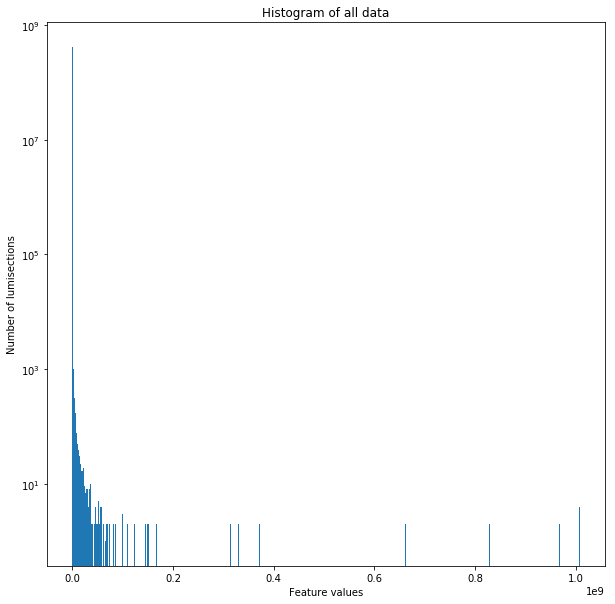

In [15]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist(data.iloc[:, :2808].values.reshape(-1), bins=1000)
plt.ylabel("Number of lumisections")
plt.xlabel("Feature values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of all data")
plt.show()

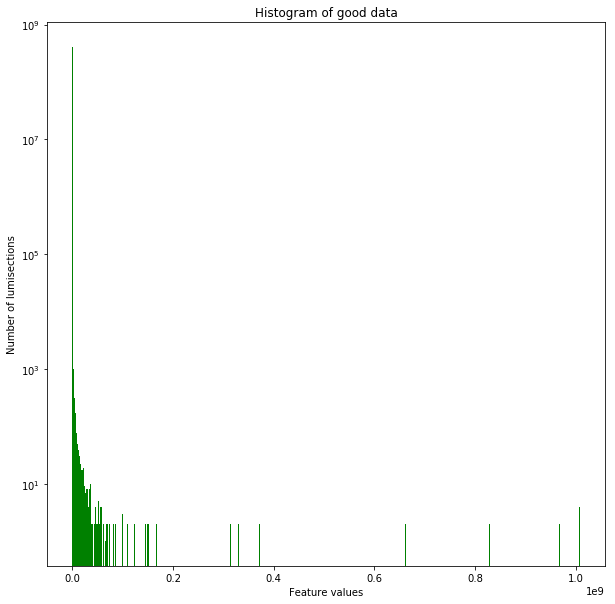

In [16]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist(data[data['label'] == 0].iloc[:, :2808].values.reshape(-1), bins=1000, color='g')
plt.ylabel("Number of lumisections")
plt.xlabel("Feature values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of good data")
plt.show()

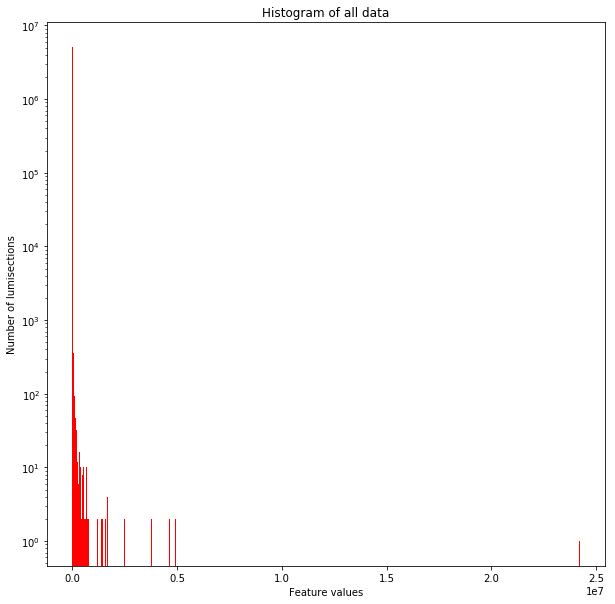

In [17]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist(data[data['label'] == 1].iloc[:, :2808].values.reshape(-1), bins=1000, color='r')
plt.ylabel("Number of lumisections")
plt.xlabel("Feature values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of all data")
plt.show()

## Data normalized using StandardScaler (zero mean, unit variance)

In [18]:
normalized_data.describe()

,0,1,2,3,4,5,6,7,8,9,...,2802,2803,2804,2805,2806,2807,run,lumi,inst_lumi,label
count,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,...,147316.000000,147316.000000,147316.0,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000,147316.000000
mean,-0.004295,-0.028093,0.002324,0.046443,0.046227,0.036869,-0.001282,-0.034603,0.016301,0.000451,...,0.002033,0.037206,0.0,-0.039631,-0.000772,0.040718,279619.107938,712.563503,0.172573,0.012368
std,1.015608,1.008142,1.042756,1.014847,1.015834,1.034619,1.020910,1.033916,0.995454,1.007834,...,1.036374,1.039849,0.0,1.027852,1.029343,1.014078,2522.689120,611.739798,0.052603,0.110522
min,-4.360441,-7.883221,-0.319100,-1.862188,-1.805813,-1.137892,-1.032774,-41.660613,-9.313076,-75.018311,...,-0.412680,-6.553247,0.0,-14.260653,-129.462165,-3.266871,276282.000000,1.000000,0.001000,0.000000
25%,-0.347141,-0.539225,-0.241784,-0.784502,-0.786439,-0.622721,-0.282924,-0.305336,-0.581614,-0.147010,...,-0.320545,-0.247267,0.0,-0.288681,-0.079218,-0.683616,277076.000000,226.000000,0.135000,0.000000
50%,-0.152630,-0.145845,-0.137179,-0.117668,-0.127120,-0.159354,-0.143663,0.254659,0.116442,0.028651,...,-0.184171,-0.103131,0.0,0.023475,0.174916,-0.028164,279654.000000,536.500000,0.169000,0.000000
75%,0.125198,0.452107,0.053837,0.723246,0.716622,0.475944,0.063018,0.443630,0.704793,0.193899,...,0.071945,0.068242,0.0,0.298743,0.307728,0.723679,281976.000000,1046.000000,0.208000,0.000000
max,25.647983,37.083054,101.101622,3.736478,3.932185,20.633958,34.092084,5.940377,2.732867,9.259310,...,65.576141,9.009557,0.0,11.425151,0.400325,3.287656,284044.000000,3484.000000,0.341000,1.000000


In [19]:
normalized_data.shape

(147316, 2812)

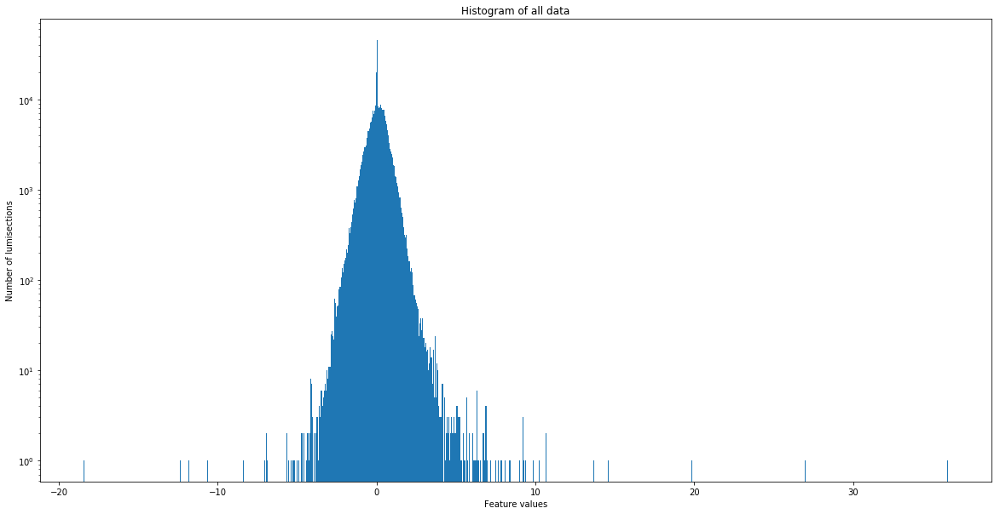

In [20]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.hist(normalized_data.iloc[:100, :2808].values.reshape(-1), bins=1000)
plt.ylabel("Number of lumisections")
plt.xlabel("Feature values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of all data")
plt.show()

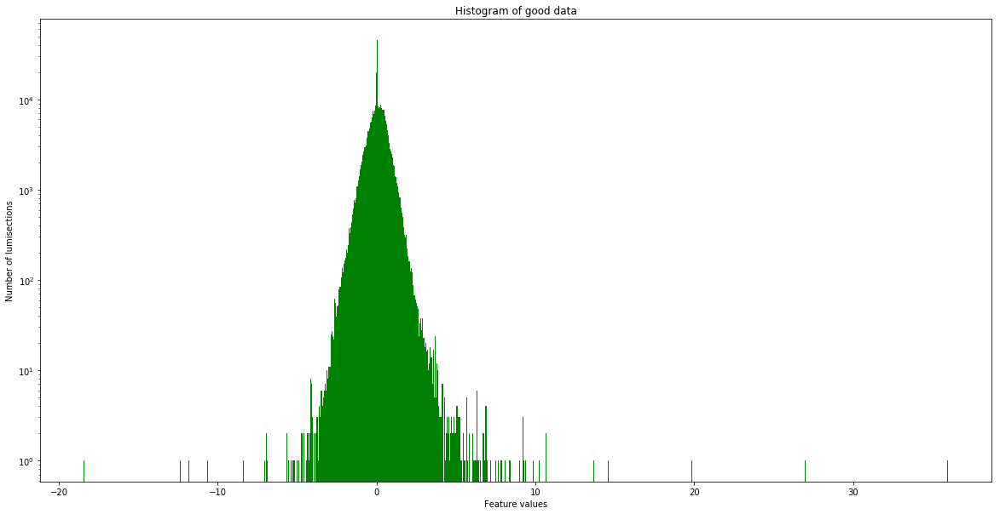

In [21]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.hist(normalized_data[normalized_data.label == 0].iloc[:100, :2808].values.reshape(-1), 
         bins=1000, color='g')
plt.ylabel("Number of lumisections")
plt.xlabel("Feature values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of good data")
plt.show()

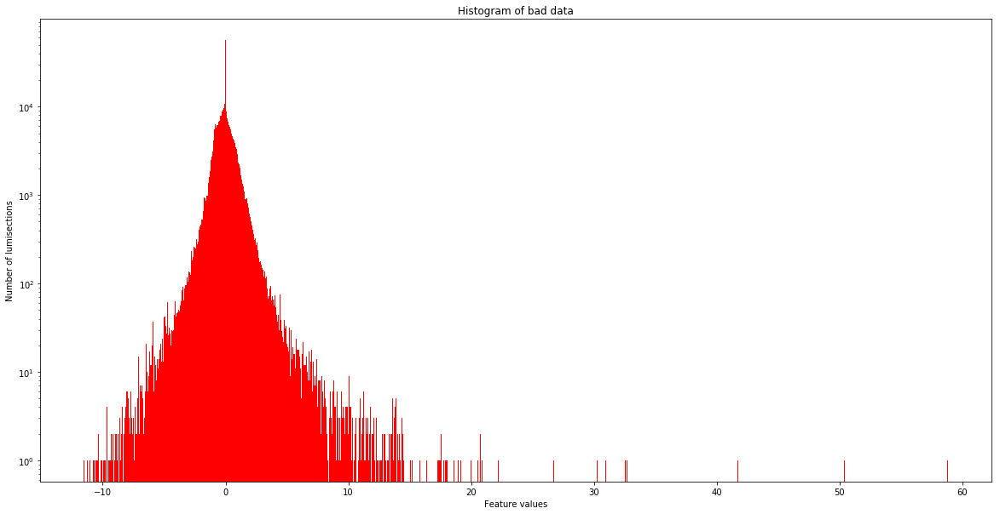

In [22]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.hist(normalized_data[normalized_data.label == 1].iloc[:100, :2808].values.reshape(-1), 
         bins=1000, color='r')
plt.ylabel("Number of lumisections")
plt.xlabel("Feature values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of bad data")
plt.show()

In [17]:
files_dir = "/eos/user/t/tkrzyzek/autoencoder/standard/"
ae_pred = pickle.load(open(files_dir + "ae_pred.p", "rb"))
y = pickle.load(open(files_dir + "y.p", "rb"))

In [18]:
ae_pred.shape

(147316, 2808)

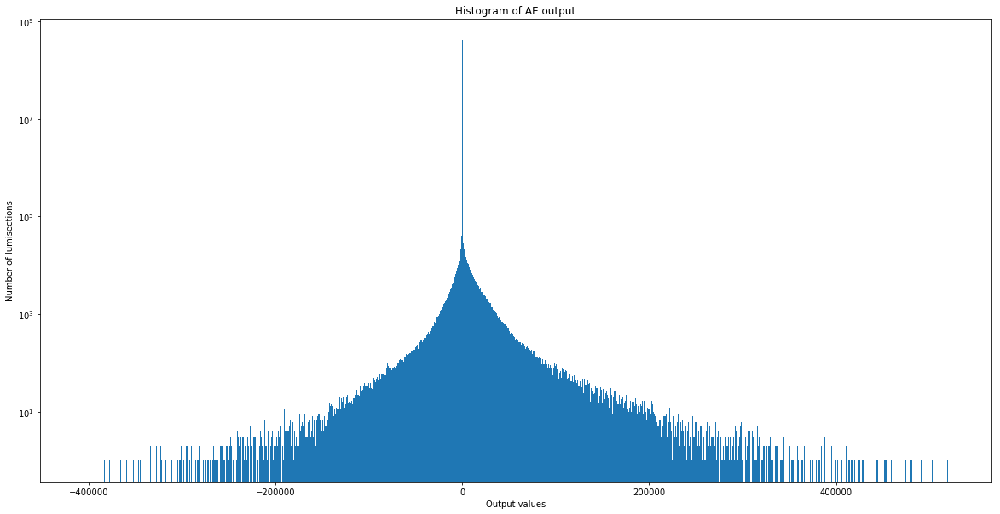

In [25]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.hist(ae_pred[:, :2808].reshape(-1), bins=1000)
plt.ylabel("Number of lumisections")
plt.xlabel("Output values")
# plt.xscale('log')
plt.yscale('log')
plt.title("Histogram of AE output")
plt.show()

## Feature values vs output values, two-dimensional histogram

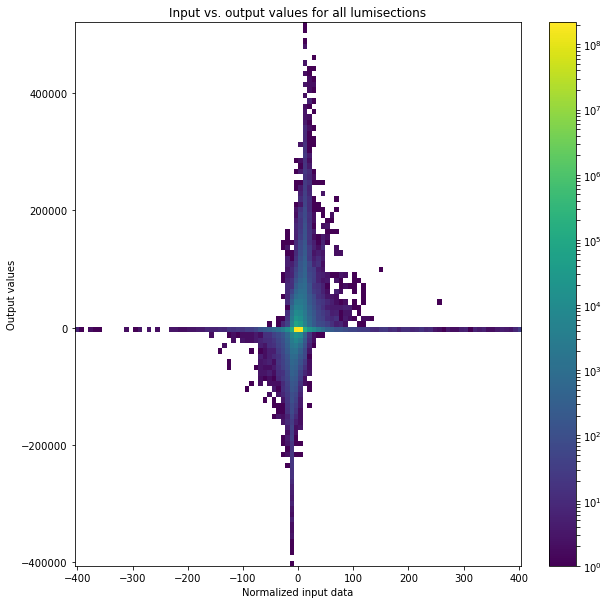

In [26]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist2d(normalized_data.iloc[:, :2808].values.reshape(-1), 
           ae_pred.reshape(-1),
          bins=100, norm=LogNorm())
plt.colorbar()
plt.xlabel("Normalized input data")
plt.ylabel("Output values")
plt.title("Input vs. output values for all lumisections")
plt.show()

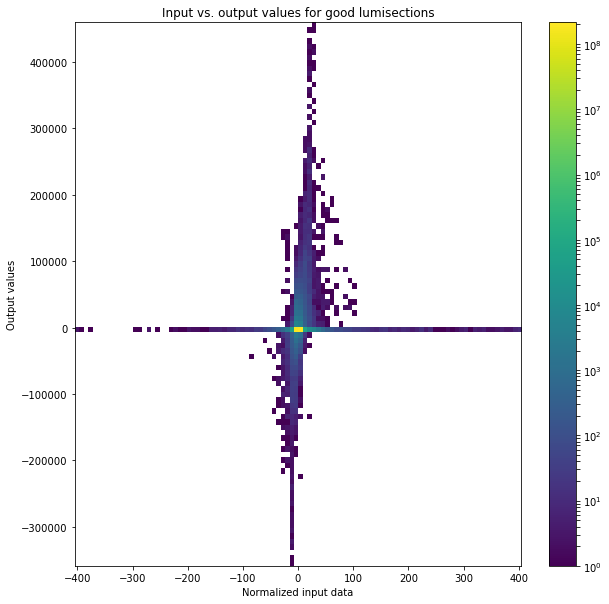

In [27]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist2d(normalized_data[normalized_data['label'] == 0].iloc[:, :2808].values.reshape(-1), 
           ae_pred[y == 0].reshape(-1),
          bins=100, norm=LogNorm())
plt.colorbar()
plt.xlabel("Normalized input data")
plt.ylabel("Output values")
plt.title("Input vs. output values for good lumisections")
plt.show()

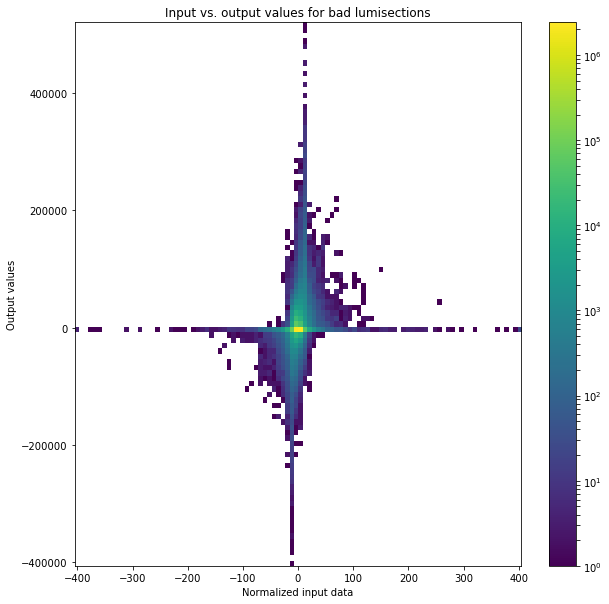

In [28]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.hist2d(normalized_data[normalized_data['label'] == 1].iloc[:, :2808].values.reshape(-1), 
           ae_pred[y == 1].reshape(-1),
          bins=100, norm=LogNorm())
plt.colorbar()
plt.xlabel("Normalized input data")
plt.ylabel("Output values")
plt.title("Input vs. output values for bad lumisections")
plt.show()

## Histograms for arbitrary variable's features

In [20]:
start_legend = 1414
# start_legend = 931
# start_legend = 1575
# start_legend = 1428

var_legend = [{'start': start_legend, 'end': start_legend, 'name': 'mean'},
              {'start': start_legend+1, 'end': start_legend+1, 'name': 'RMS'},
              {'start': start_legend+2, 'end': start_legend+2, 'name': 'Q1'},
              {'start': start_legend+3, 'end': start_legend+3, 'name': 'Q2'},
              {'start': start_legend+4, 'end': start_legend+4, 'name': 'Q3'},
              {'start': start_legend+5, 'end': start_legend+5, 'name': 'Q4'},
              {'start': start_legend+6, 'end': start_legend+6, 'name': 'Q5'}]

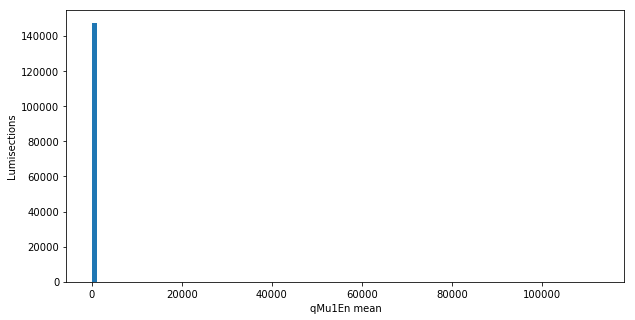

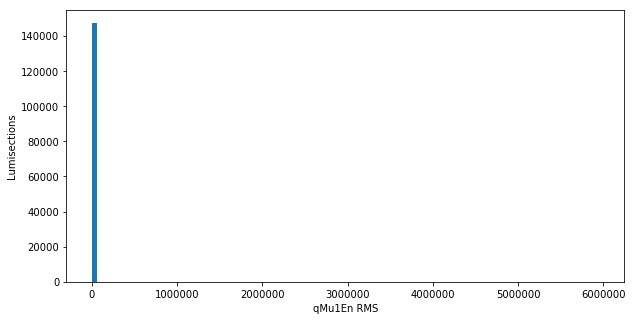

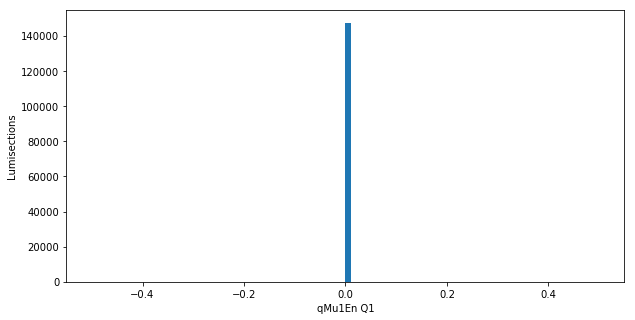

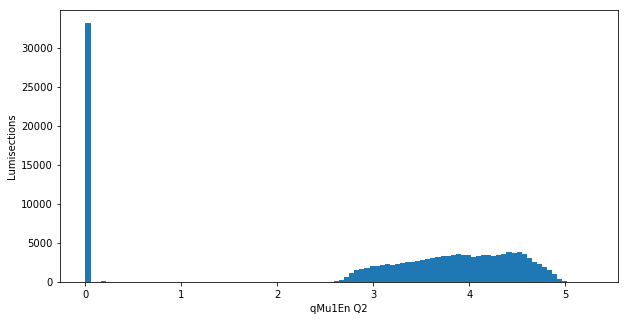

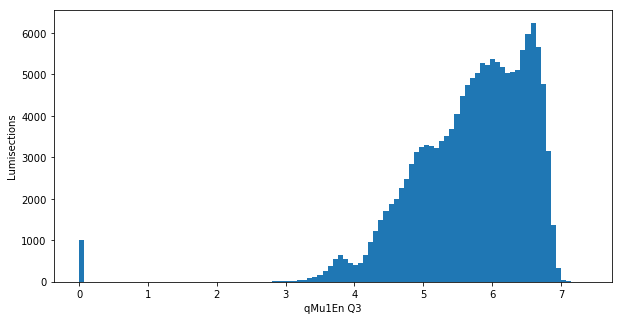

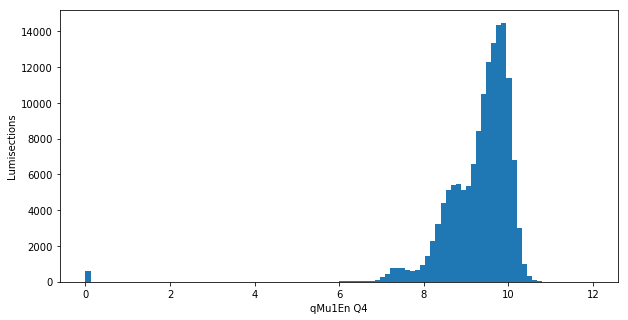

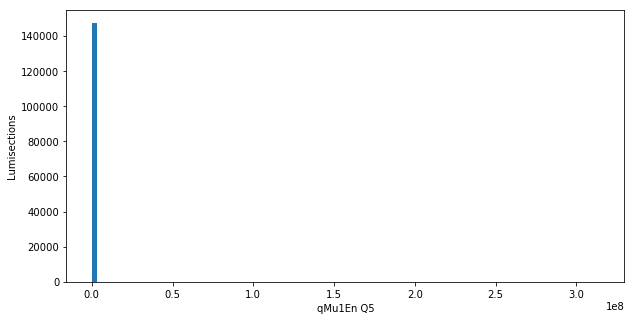

In [30]:
plt.rcParams['figure.figsize'] = [10, 5]
for e in var_legend:
    idx = e['start']
    i, r = divmod(idx, 7)
    plt.hist(data[idx], bins=100)
    plt.ylabel("Lumisections")
    plt.xlabel(feature_names[i] + " " + e['name'])
#     plt.xscale('log')
#     plt.yscale('log')
    plt.show()


  0%|          | 0/2807 [00:00<?, ?it/s]
Exception in thread Thread-6:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.6/threading.py", line 916, in _bootstrap_inner
    self.run()
  File "/opt/anaconda3/lib/python3.6/site-packages/tqdm/_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "/opt/anaconda3/lib/python3.6/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/0_qPFJetPt_mean


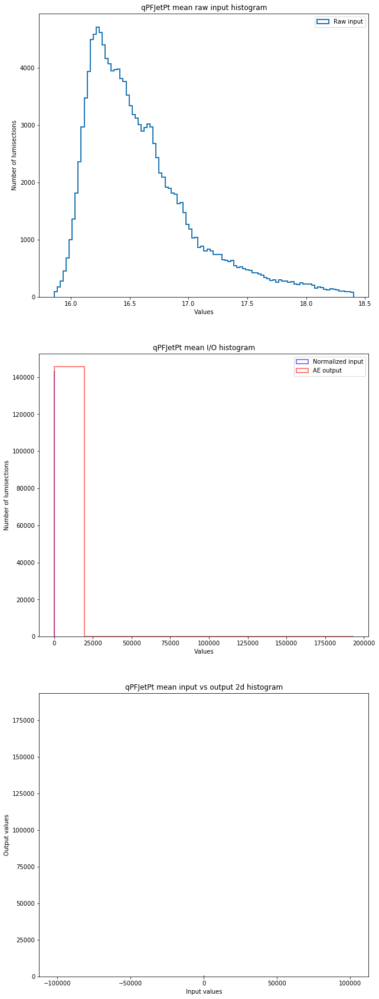

  0%|          | 1/2807 [00:09<7:38:35,  9.81s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/1_qPFJetPt_RMS


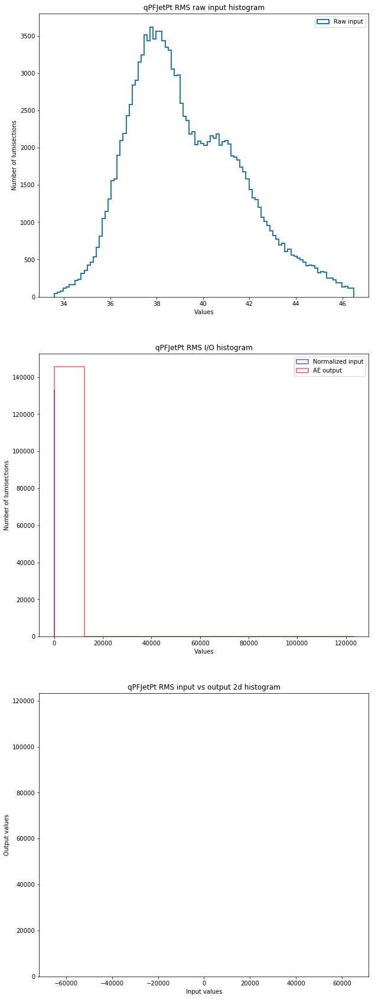

  0%|          | 2/2807 [00:19<7:36:52,  9.77s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/2_qPFJetPt_Q1


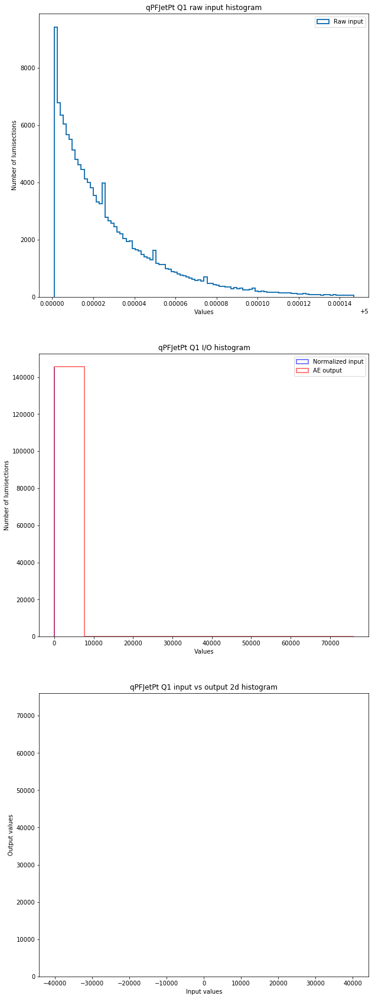

  0%|          | 3/2807 [00:29<7:32:29,  9.68s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/3_qPFJetPt_Q2


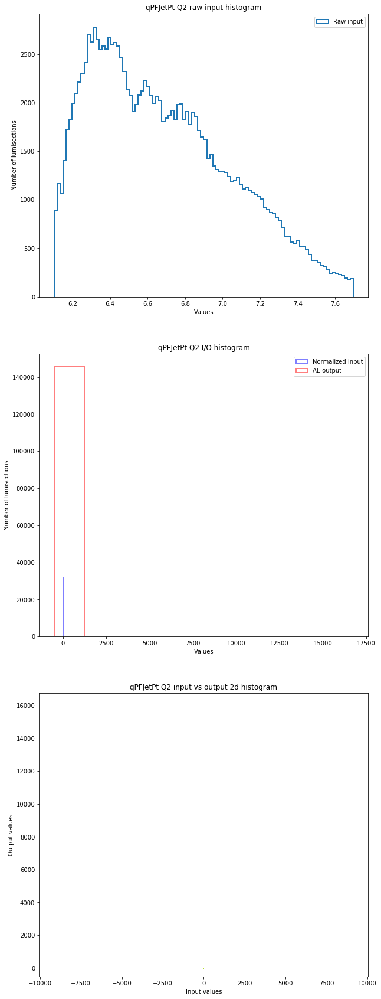

  0%|          | 4/2807 [00:39<7:40:28,  9.86s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/4_qPFJetPt_Q3


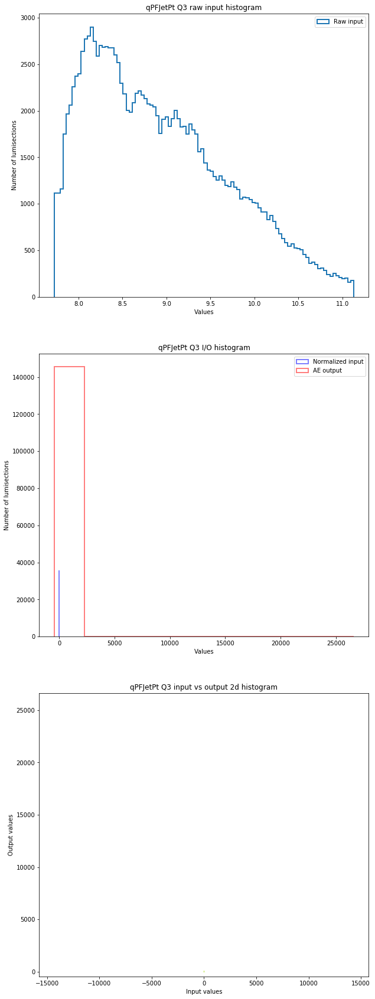

  0%|          | 5/2807 [00:49<7:40:37,  9.86s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/5_qPFJetPt_Q4


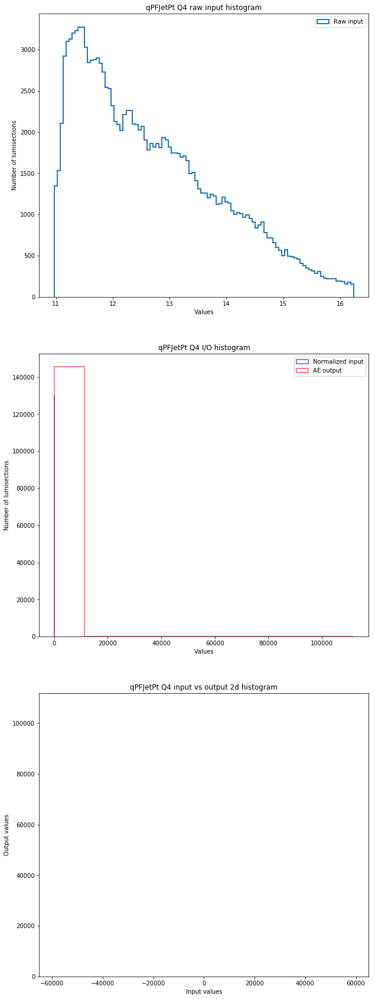

  0%|          | 6/2807 [00:57<7:31:14,  9.67s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/6_qPFJetPt_Q5


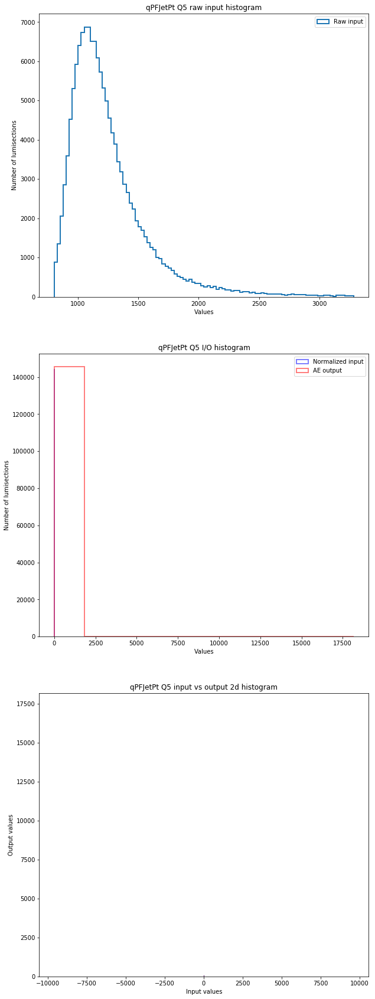

  0%|          | 7/2807 [01:08<7:35:33,  9.76s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/7_qPFJetEta_mean


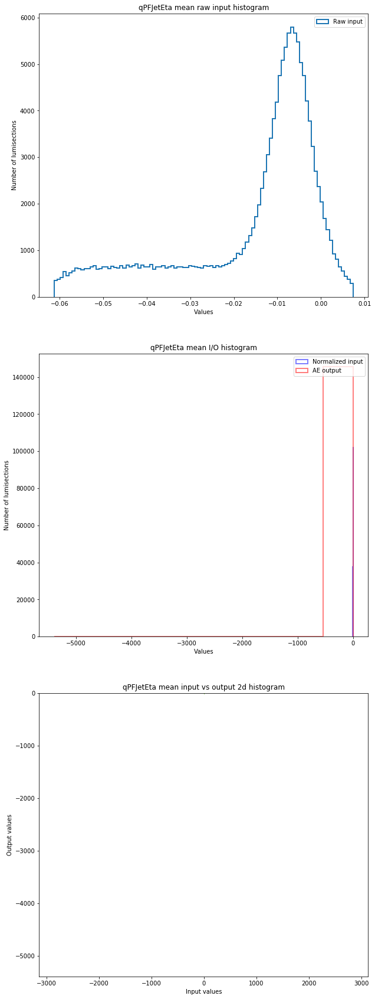

  0%|          | 8/2807 [01:19<7:43:48,  9.94s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/8_qPFJetEta_RMS


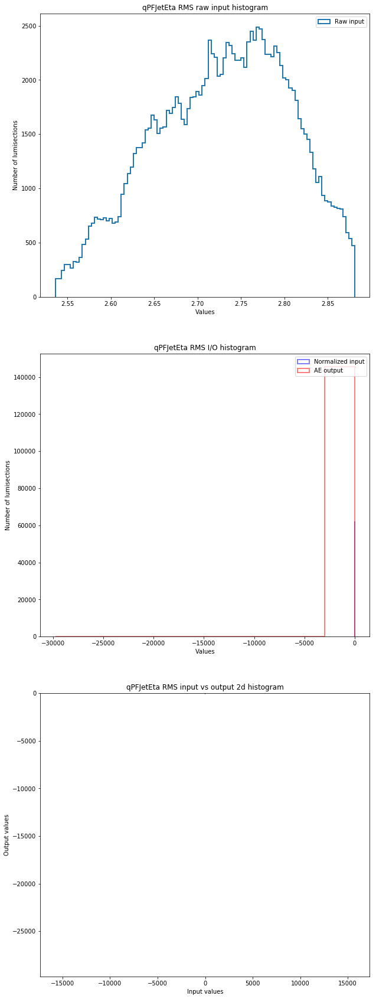

  0%|          | 9/2807 [01:27<7:35:07,  9.76s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/9_qPFJetEta_Q1


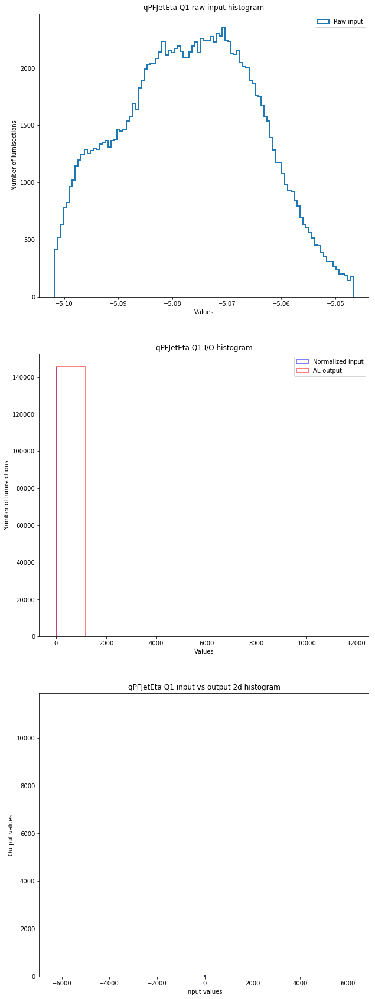

  0%|          | 10/2807 [01:37<7:35:05,  9.76s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/10_qPFJetEta_Q2


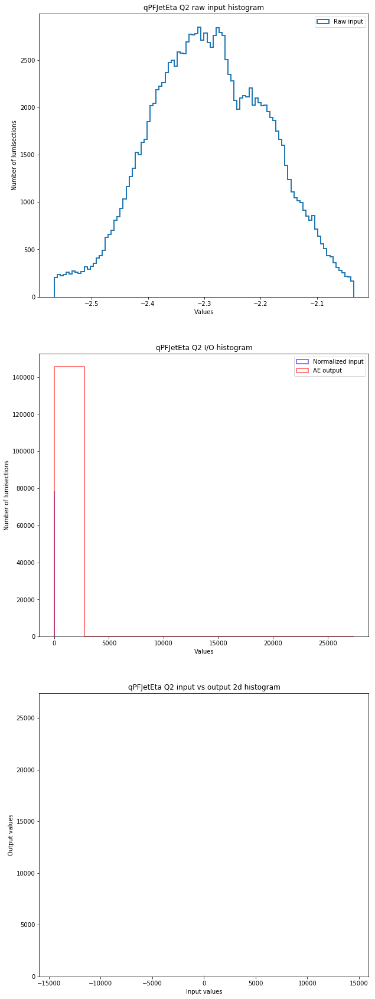

  0%|          | 11/2807 [01:47<7:36:39,  9.80s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/11_qPFJetEta_Q3


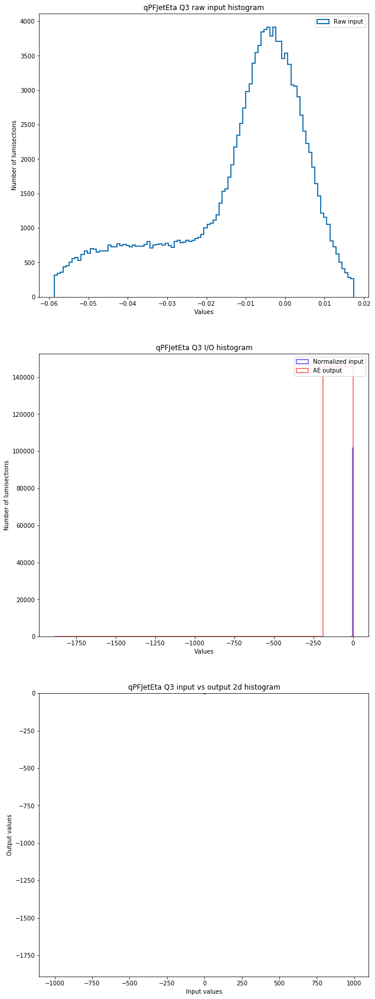

  0%|          | 12/2807 [01:57<7:35:09,  9.77s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/12_qPFJetEta_Q4


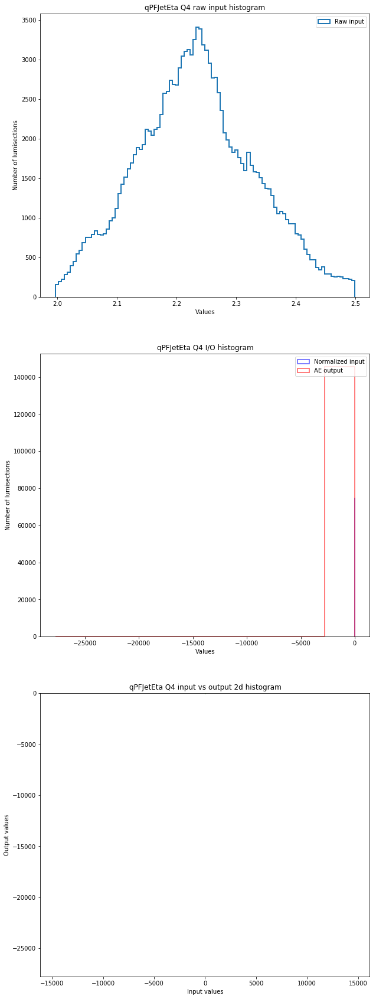

  0%|          | 13/2807 [02:06<7:33:34,  9.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/13_qPFJetEta_Q5


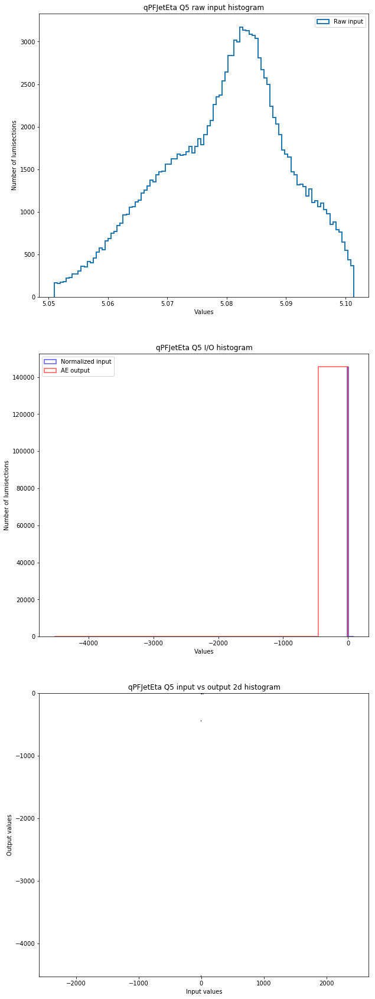

  0%|          | 14/2807 [02:16<7:33:56,  9.75s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/14_qPFJetPhi_mean


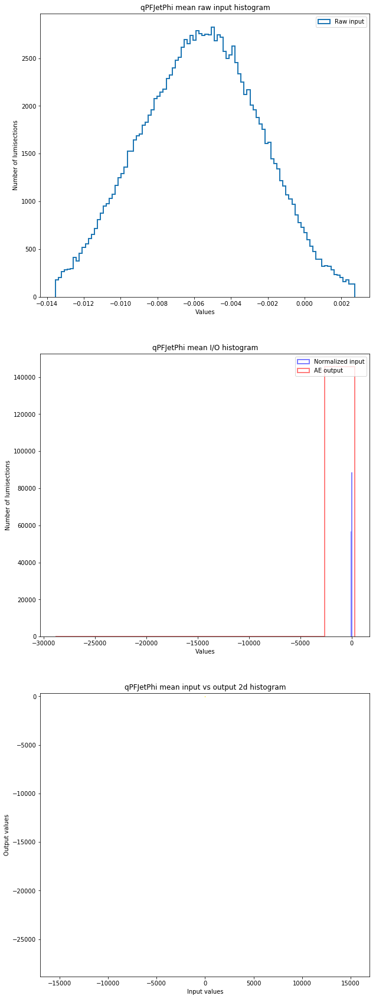

  1%|          | 15/2807 [02:26<7:33:14,  9.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/15_qPFJetPhi_RMS


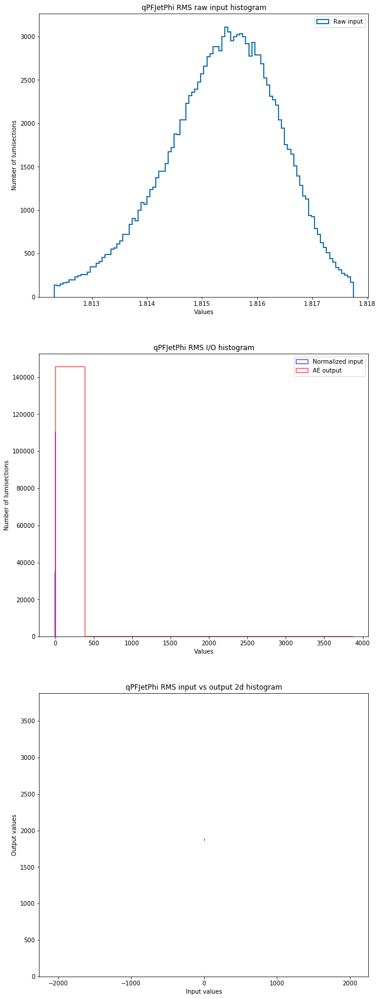

  1%|          | 16/2807 [02:35<7:32:12,  9.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/16_qPFJetPhi_Q1


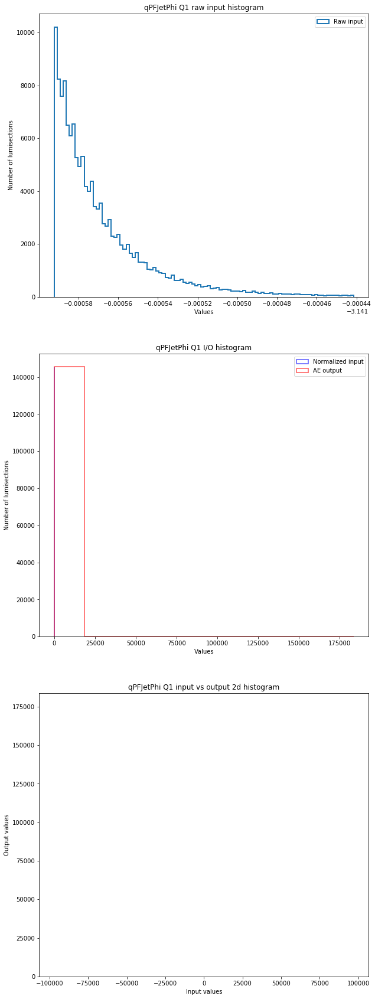

  1%|          | 17/2807 [02:45<7:33:15,  9.75s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/17_qPFJetPhi_Q2


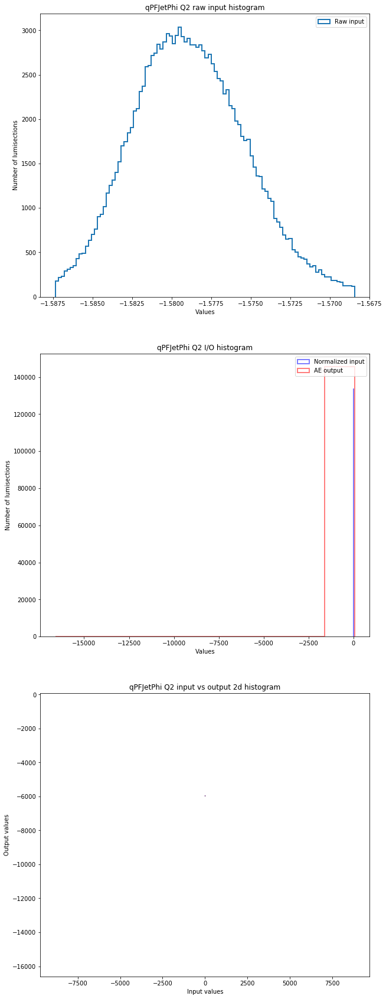

  1%|          | 18/2807 [02:56<7:34:44,  9.78s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/18_qPFJetPhi_Q3


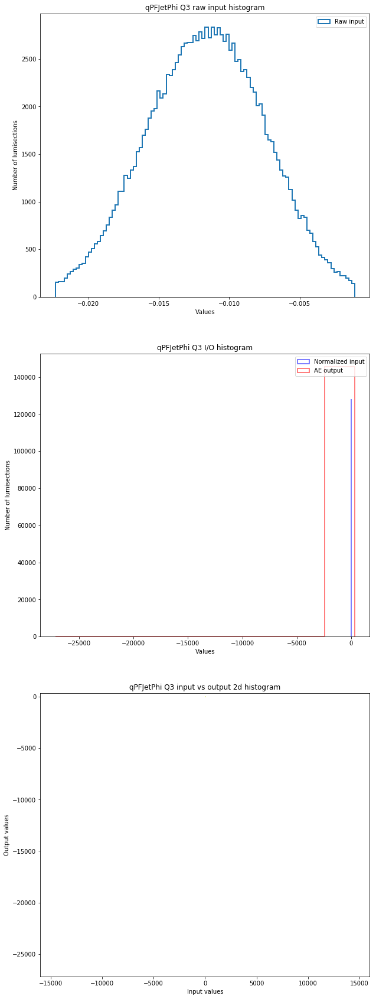

  1%|          | 19/2807 [03:04<7:31:06,  9.71s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/19_qPFJetPhi_Q4


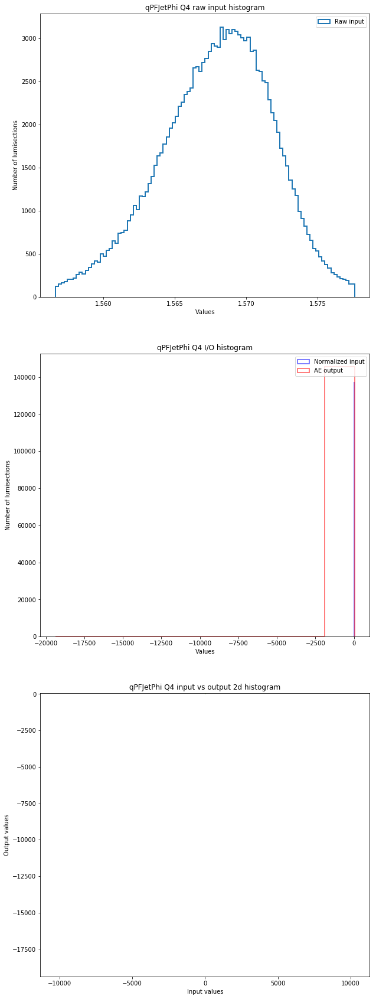

  1%|          | 20/2807 [03:13<7:28:46,  9.66s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/20_qPFJetPhi_Q5


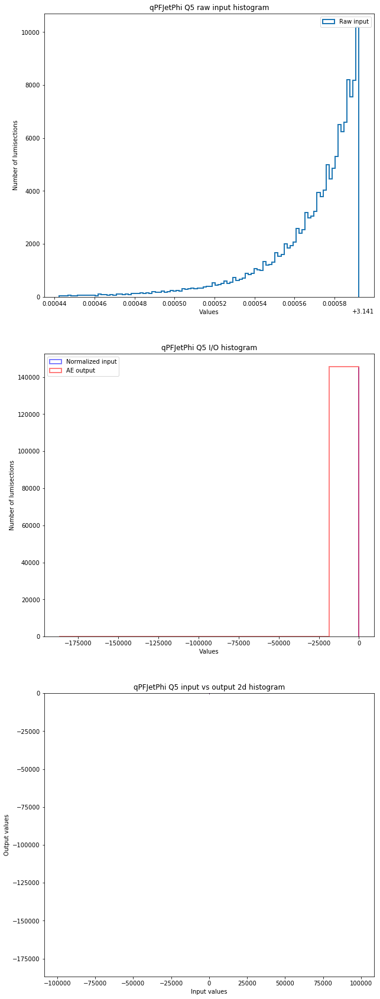

  1%|          | 21/2807 [03:21<7:25:03,  9.58s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/21_qPFJet0Pt_mean


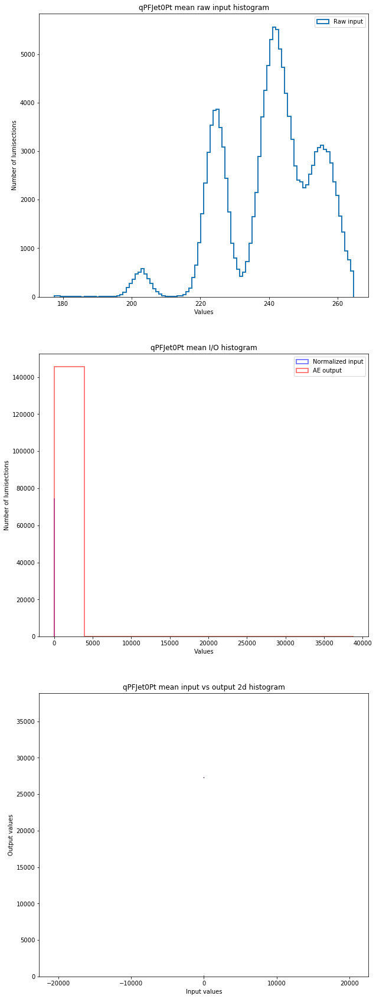

  1%|          | 22/2807 [03:29<7:21:39,  9.52s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/22_qPFJet0Pt_RMS


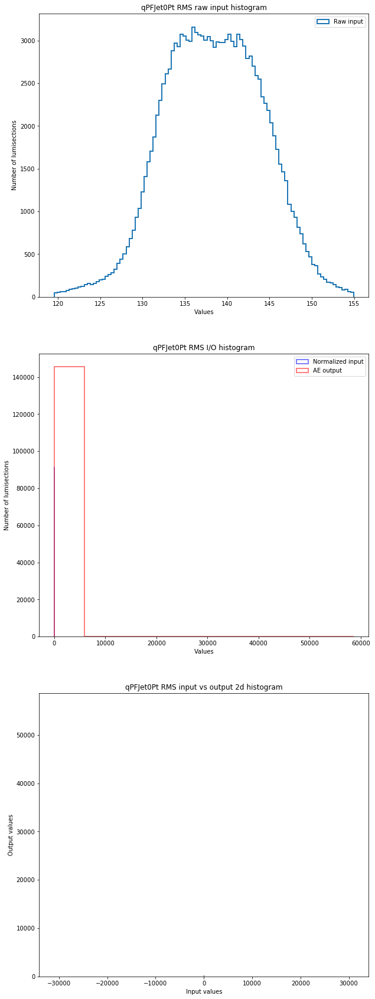

  1%|          | 23/2807 [03:38<7:20:03,  9.48s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/23_qPFJet0Pt_Q1


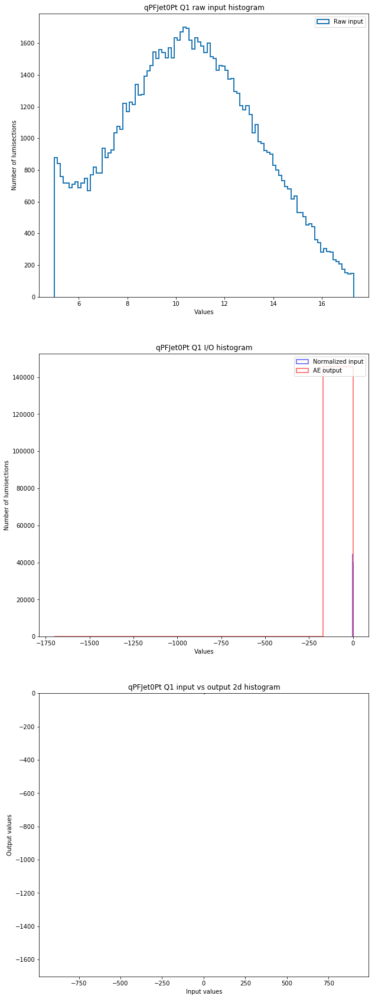

  1%|          | 24/2807 [03:46<7:16:57,  9.42s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/24_qPFJet0Pt_Q2


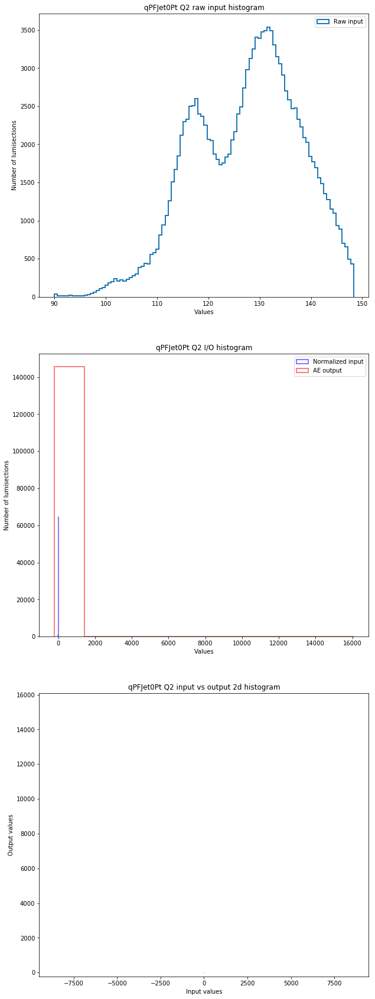

  1%|          | 25/2807 [03:55<7:16:45,  9.42s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/25_qPFJet0Pt_Q3


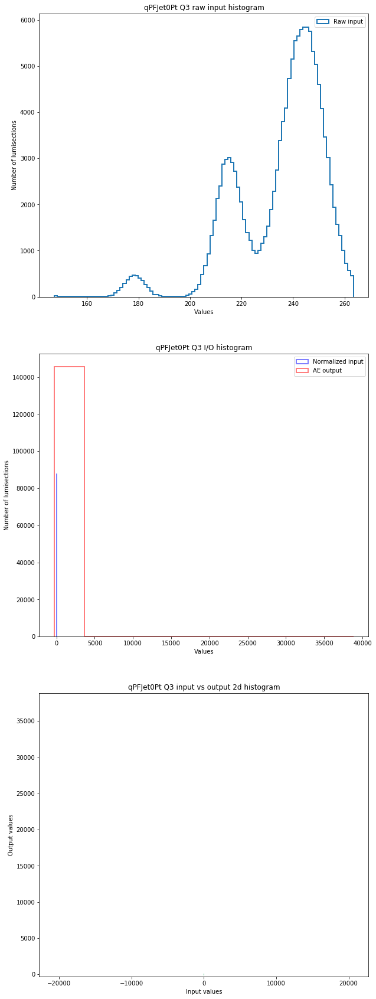

  1%|          | 26/2807 [04:04<7:16:26,  9.42s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/26_qPFJet0Pt_Q4


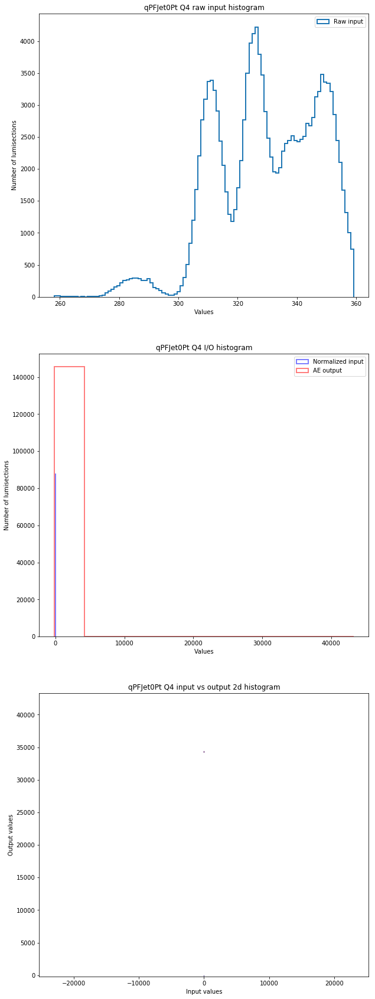

  1%|          | 27/2807 [04:12<7:13:52,  9.36s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/27_qPFJet0Pt_Q5


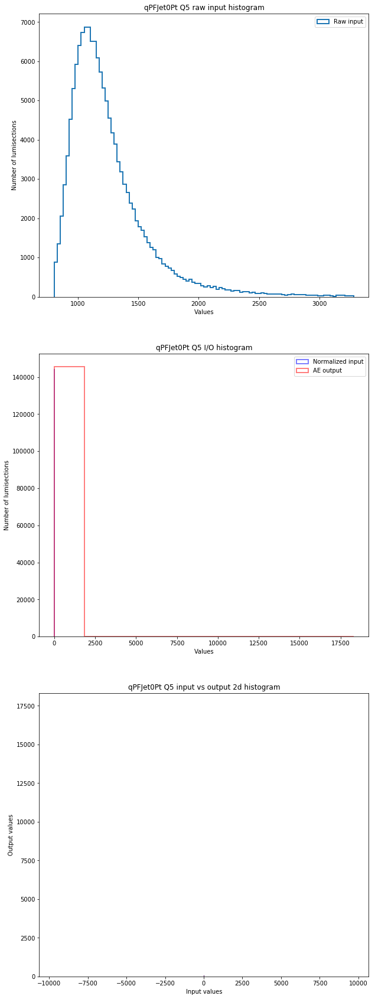

  1%|          | 28/2807 [04:21<7:12:00,  9.33s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/28_qPFJet1Pt_mean


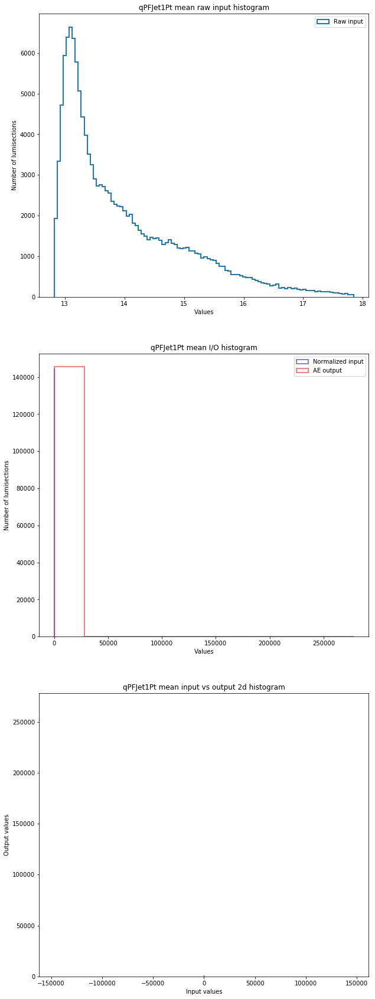

  1%|          | 29/2807 [04:28<7:08:41,  9.26s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/29_qPFJet1Pt_RMS


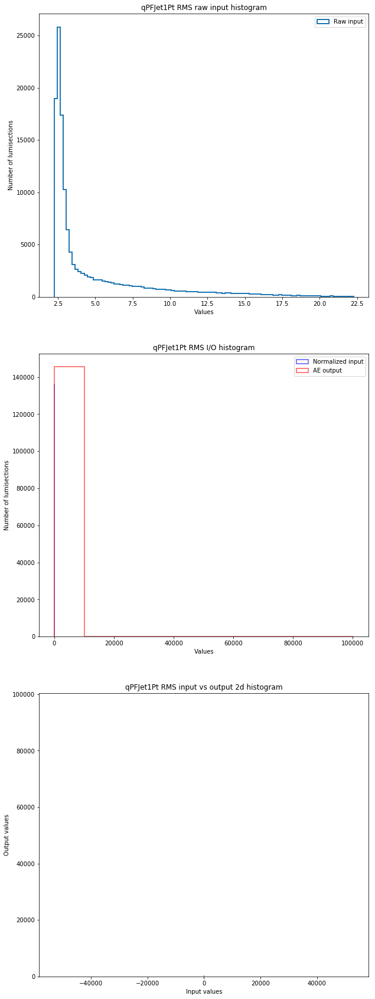

  1%|          | 30/2807 [04:36<7:06:16,  9.21s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/30_qPFJet1Pt_Q1


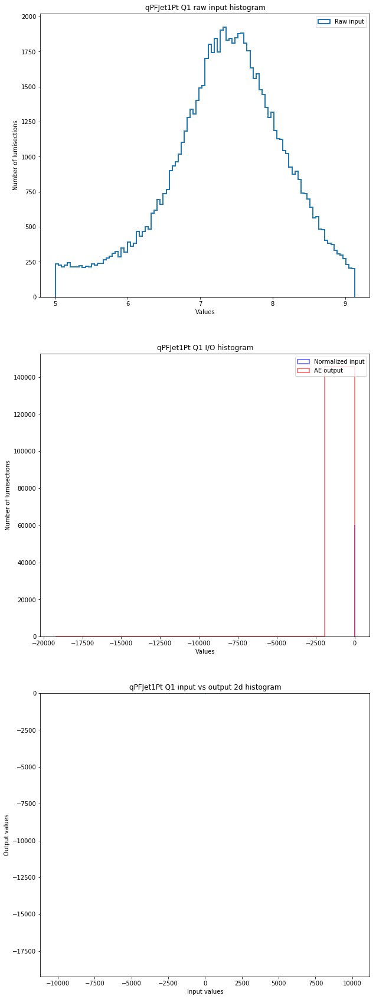

  1%|          | 31/2807 [04:45<7:05:56,  9.21s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/31_qPFJet1Pt_Q2


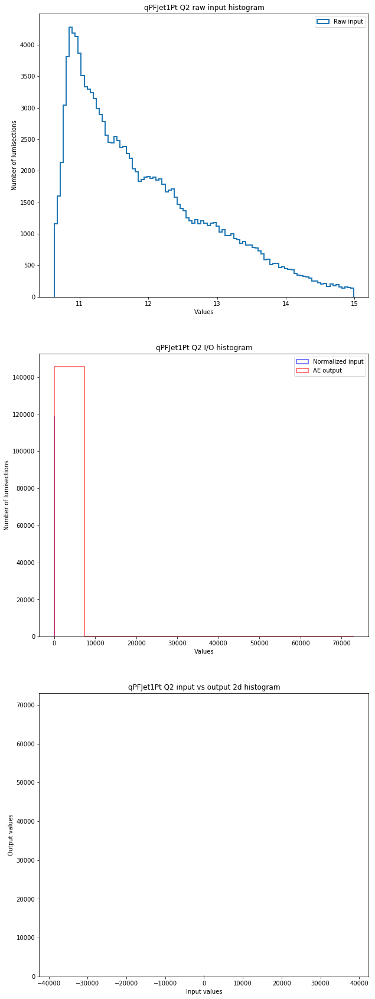

  1%|          | 32/2807 [04:52<7:03:20,  9.15s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/32_qPFJet1Pt_Q3


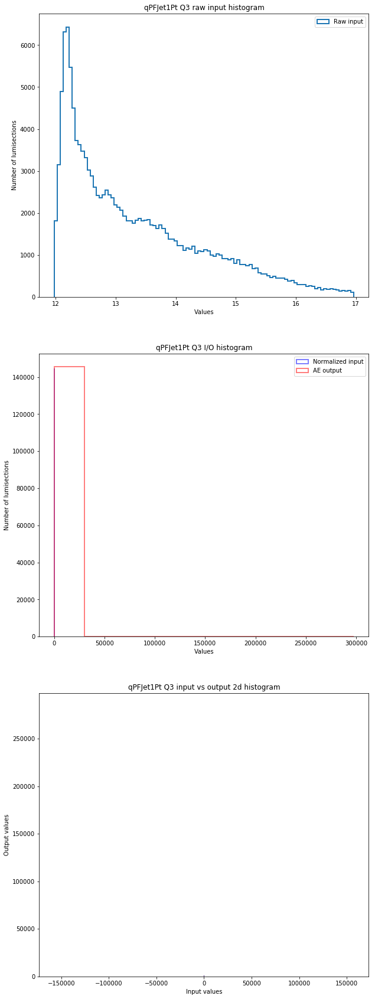

  1%|          | 33/2807 [05:00<7:00:51,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/33_qPFJet1Pt_Q4


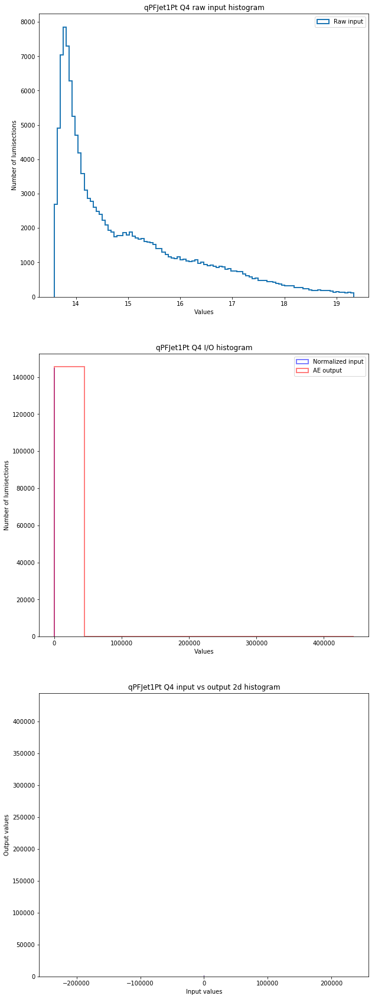

  1%|          | 34/2807 [05:08<6:59:01,  9.07s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/34_qPFJet1Pt_Q5


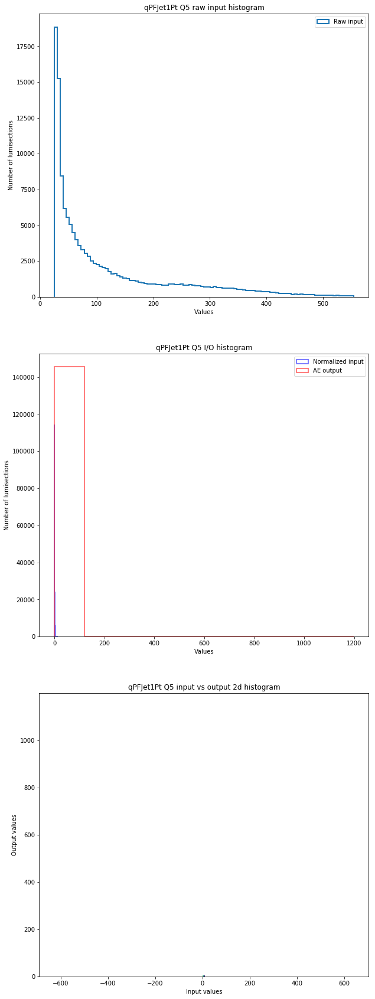

  1%|          | 35/2807 [05:17<6:58:29,  9.06s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/35_qPFJet2Pt_mean


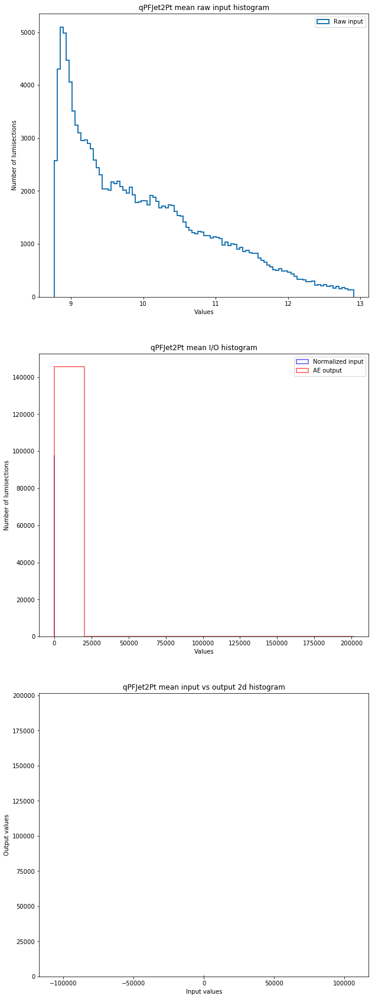

  1%|▏         | 36/2807 [05:24<6:56:40,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/36_qPFJet2Pt_RMS


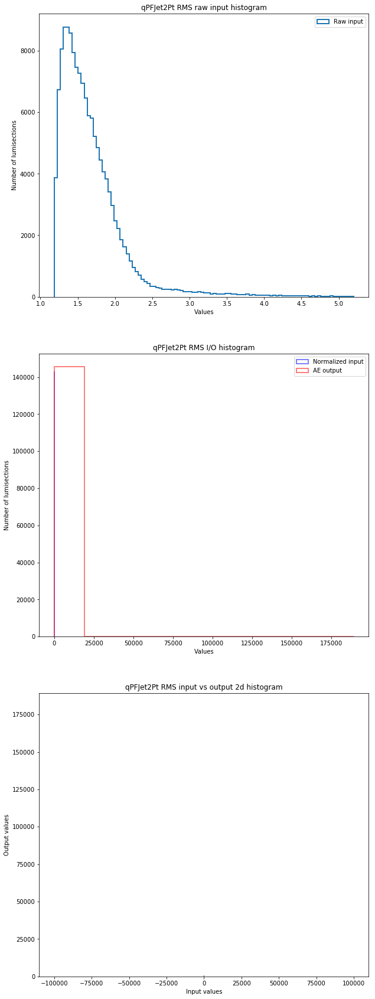

  1%|▏         | 37/2807 [05:33<6:55:38,  9.00s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/37_qPFJet2Pt_Q1


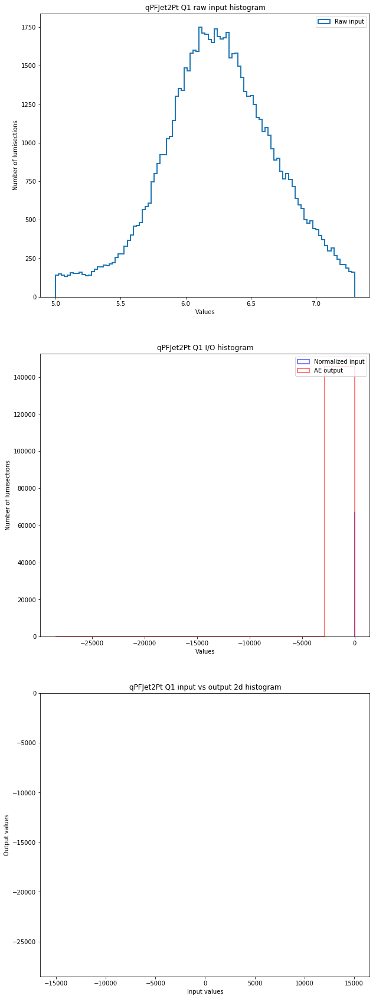

  1%|▏         | 38/2807 [05:41<6:55:17,  9.00s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/38_qPFJet2Pt_Q2


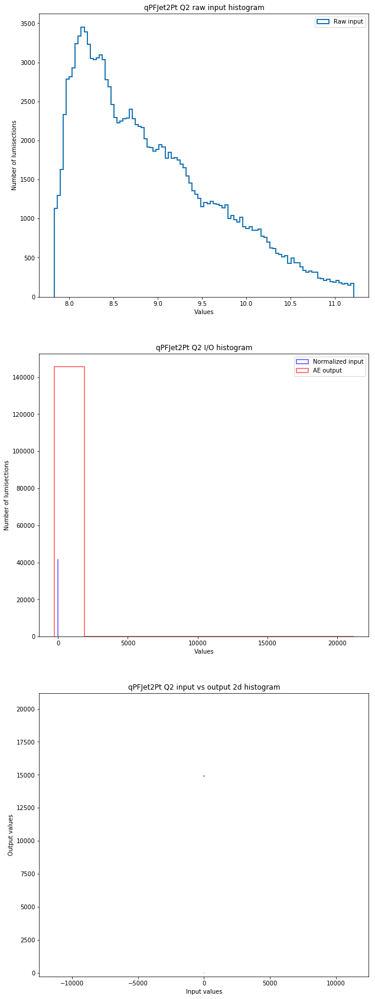

  1%|▏         | 39/2807 [05:49<6:53:59,  8.97s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/39_qPFJet2Pt_Q3


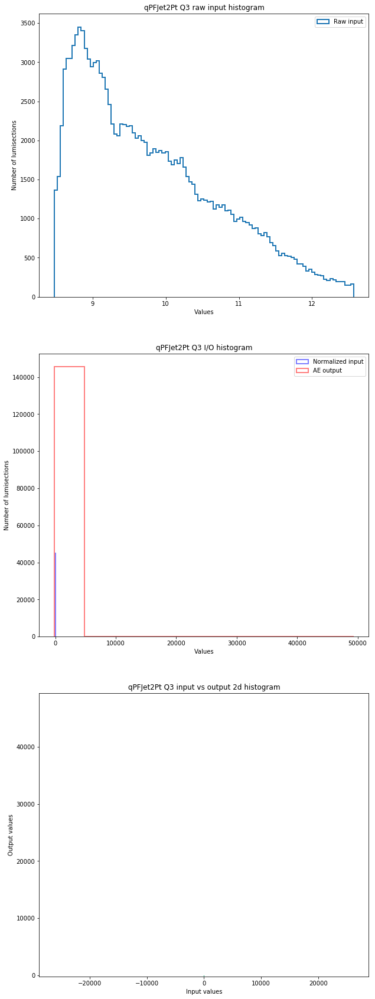

  1%|▏         | 40/2807 [05:59<6:54:00,  8.98s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/40_qPFJet2Pt_Q4


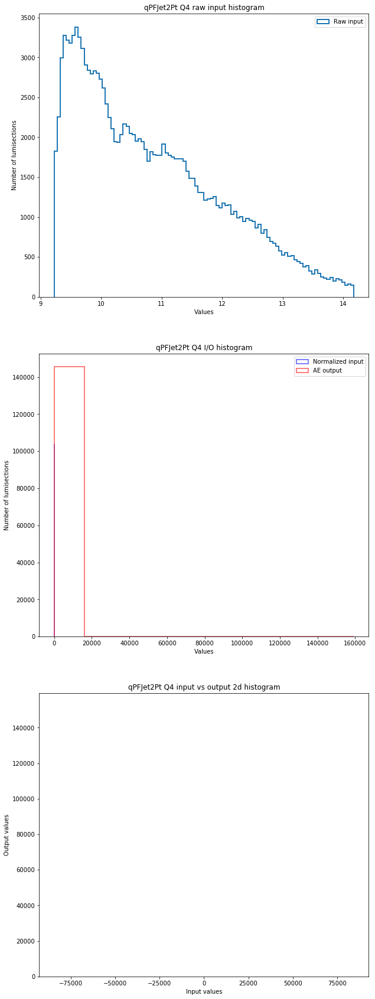

  1%|▏         | 41/2807 [06:06<6:52:36,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/41_qPFJet2Pt_Q5


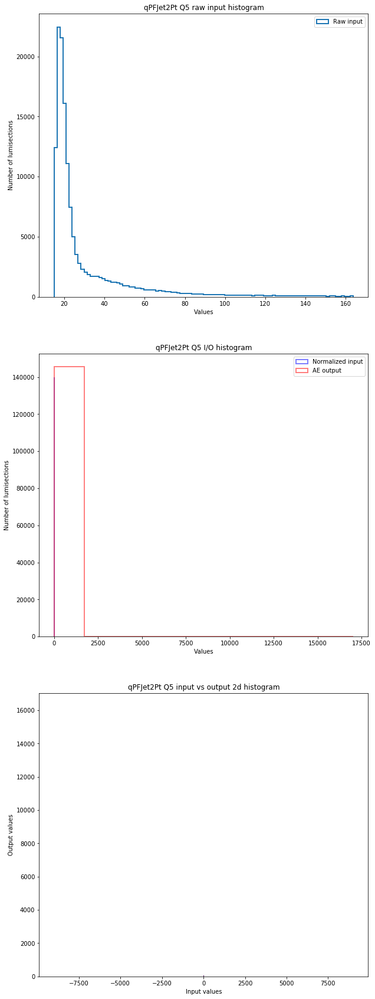

  1%|▏         | 42/2807 [06:14<6:51:11,  8.92s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/42_qPFJet3Pt_mean


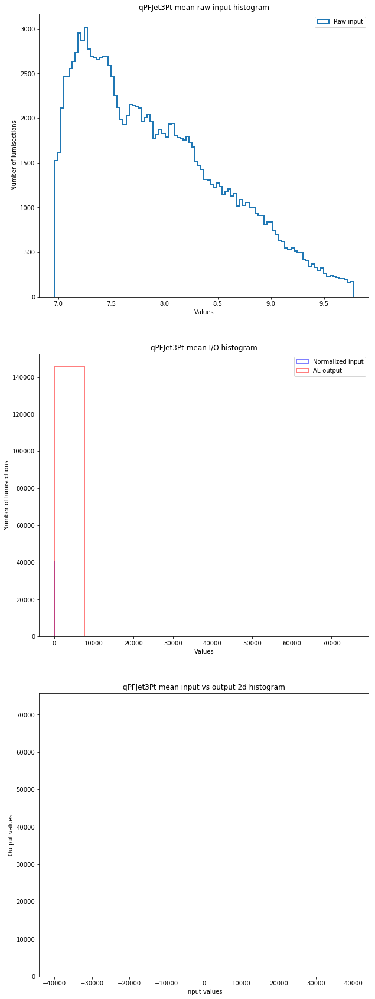

  2%|▏         | 43/2807 [06:22<6:50:18,  8.91s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/43_qPFJet3Pt_RMS


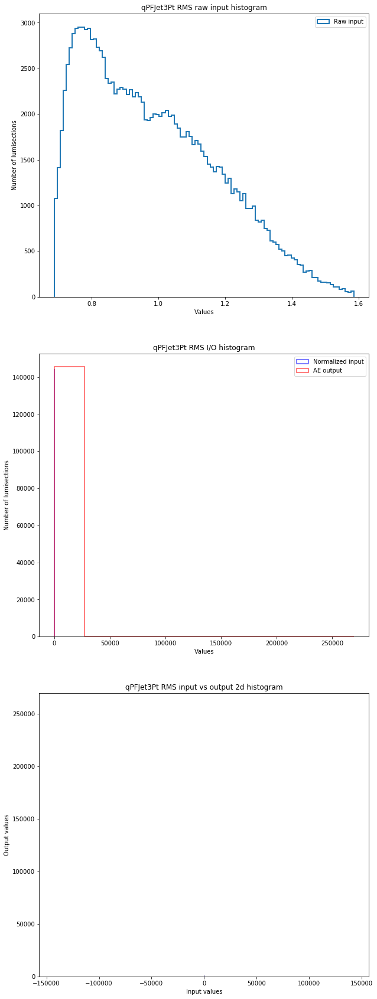

  2%|▏         | 44/2807 [06:31<6:49:17,  8.89s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/44_qPFJet3Pt_Q1


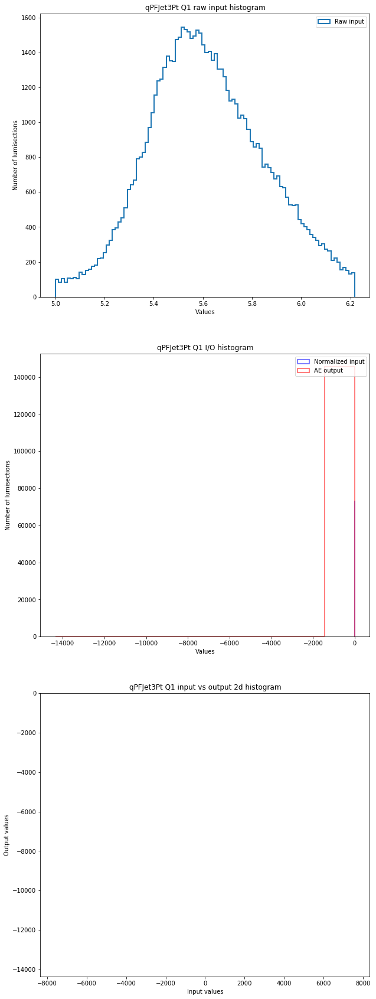

  2%|▏         | 45/2807 [06:38<6:47:55,  8.86s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/45_qPFJet3Pt_Q2


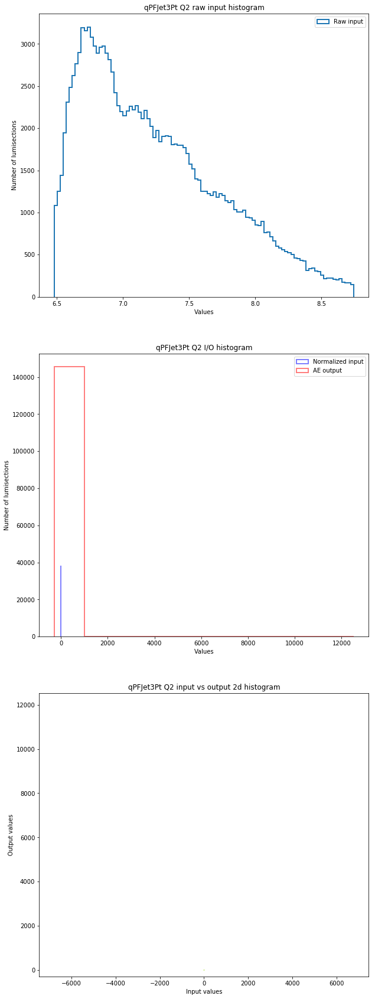

  2%|▏         | 46/2807 [06:46<6:46:53,  8.84s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/46_qPFJet3Pt_Q3


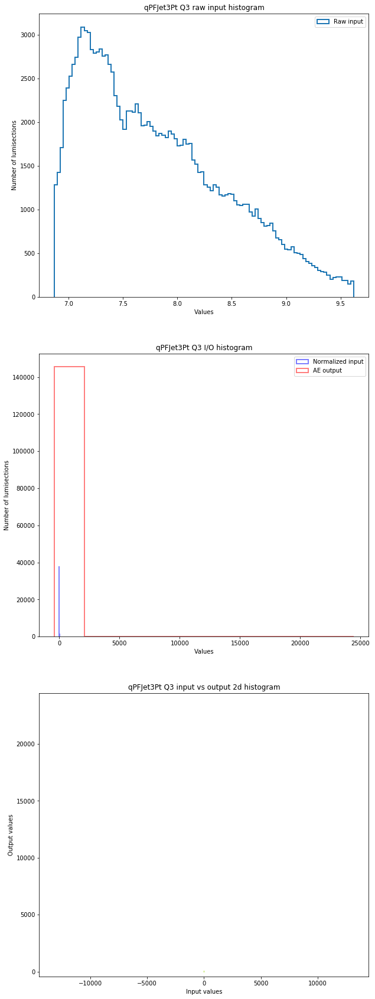

  2%|▏         | 47/2807 [06:55<6:46:15,  8.83s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/47_qPFJet3Pt_Q4


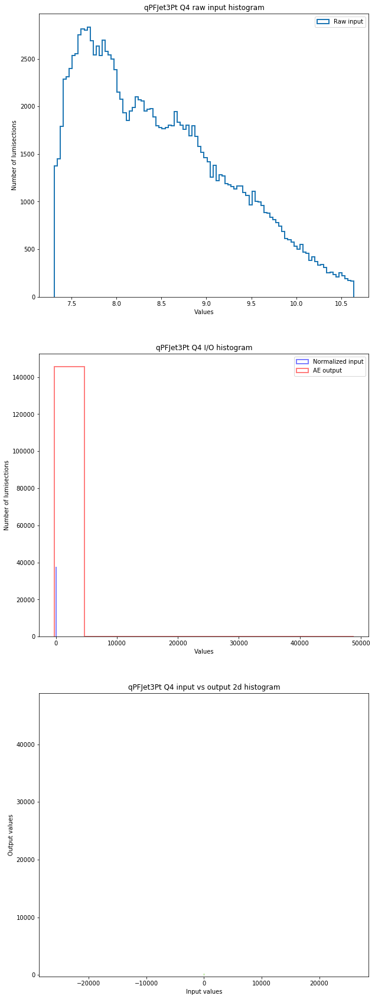

  2%|▏         | 48/2807 [07:02<6:44:59,  8.81s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/48_qPFJet3Pt_Q5


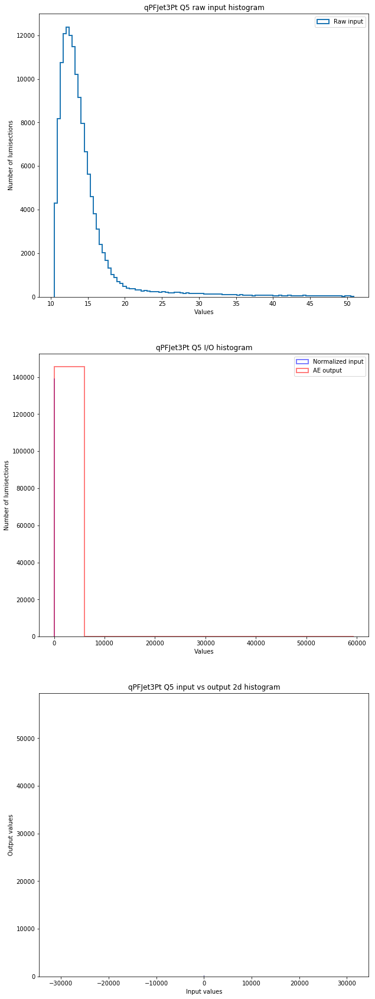

  2%|▏         | 49/2807 [07:10<6:43:34,  8.78s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/49_qPFJet4Pt_mean


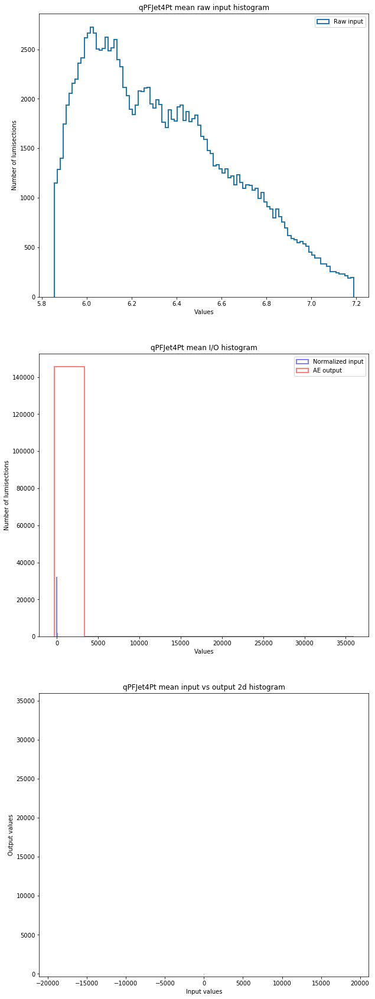

  2%|▏         | 50/2807 [07:18<6:43:01,  8.77s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/50_qPFJet4Pt_RMS


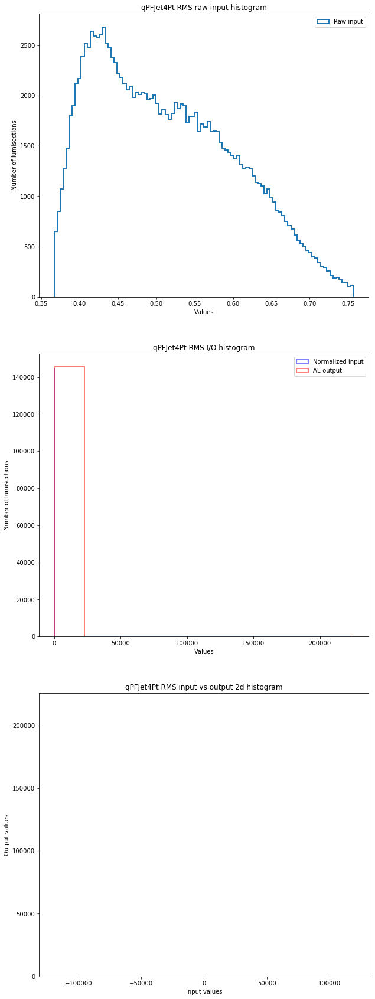

  2%|▏         | 51/2807 [07:25<6:41:36,  8.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/51_qPFJet4Pt_Q1


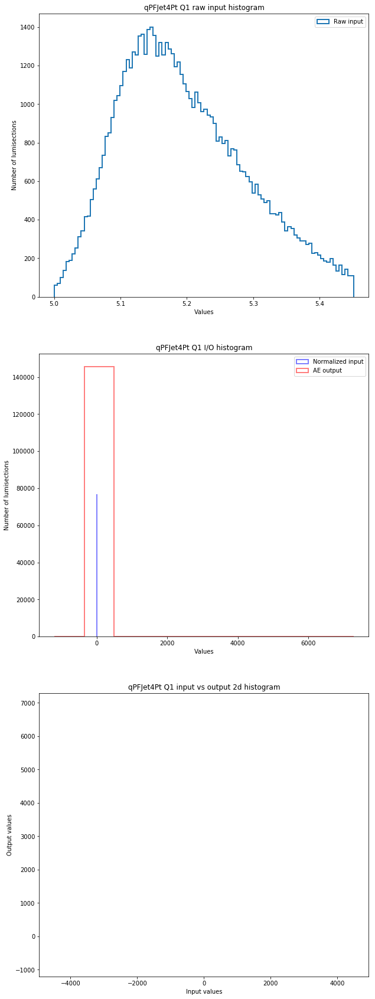

  2%|▏         | 52/2807 [07:33<6:40:28,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/52_qPFJet4Pt_Q2


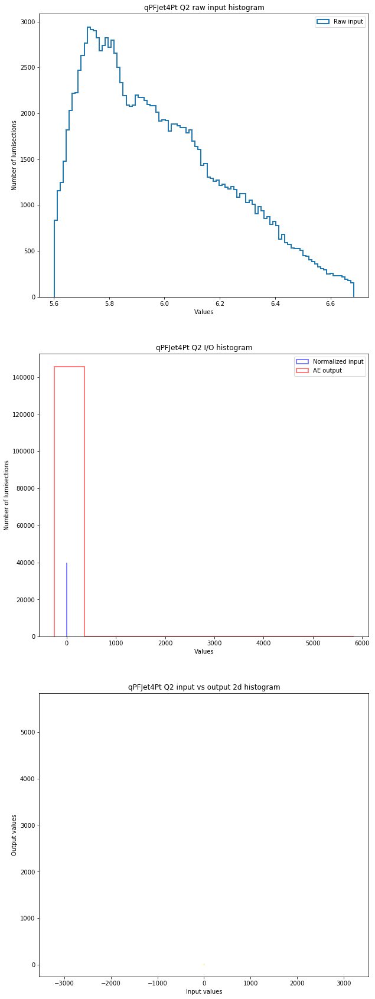

  2%|▏         | 53/2807 [07:41<6:39:57,  8.71s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/53_qPFJet4Pt_Q3


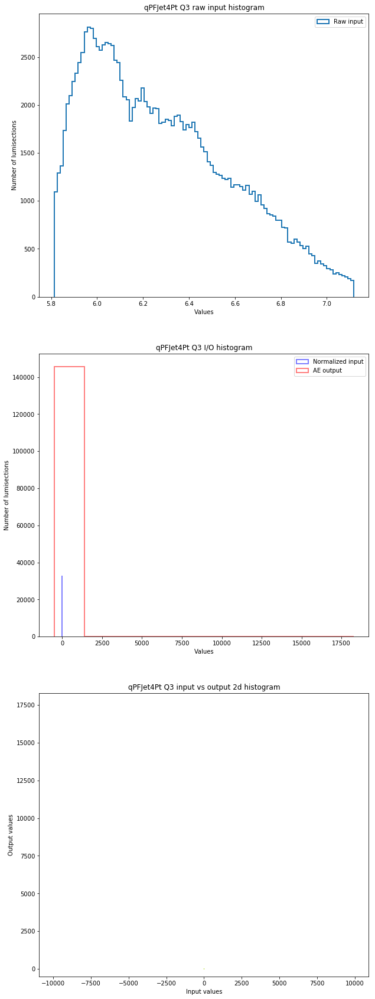

  2%|▏         | 54/2807 [07:49<6:38:41,  8.69s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/54_qPFJet4Pt_Q4


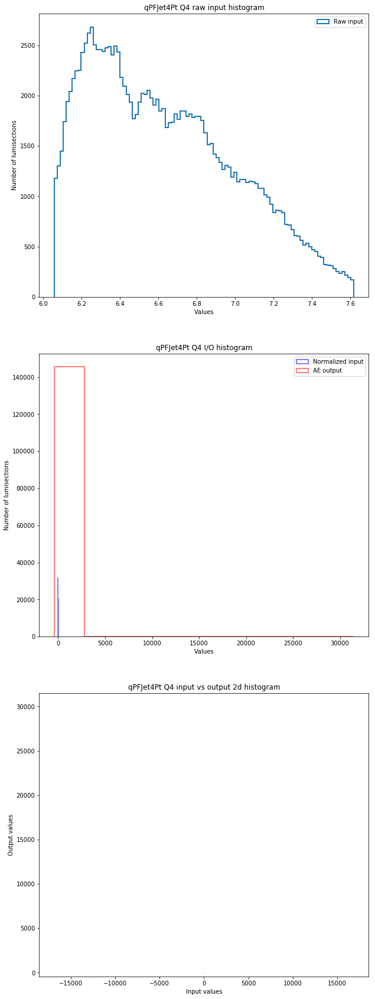

  2%|▏         | 55/2807 [07:56<6:37:31,  8.67s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/55_qPFJet4Pt_Q5


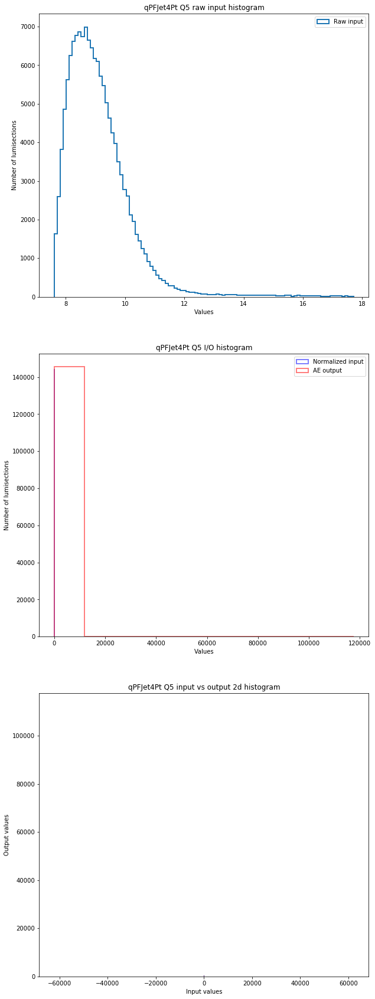

  2%|▏         | 56/2807 [08:04<6:36:46,  8.65s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/56_qPFJet5Pt_mean


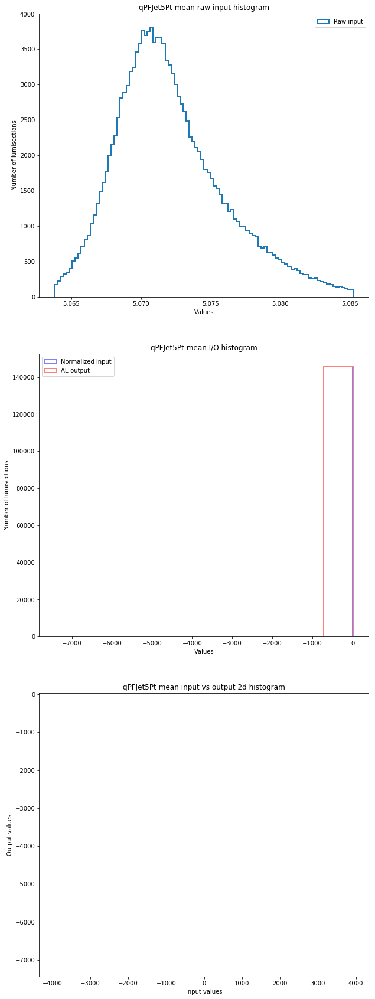

  2%|▏         | 57/2807 [08:12<6:35:37,  8.63s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/57_qPFJet5Pt_RMS


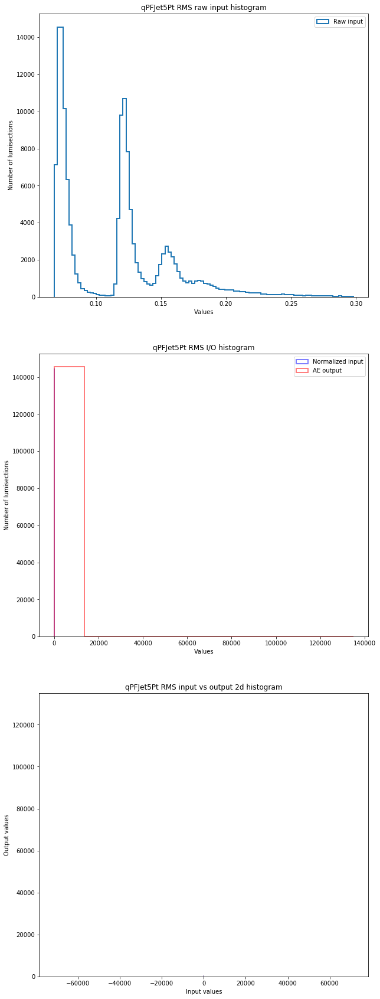

  2%|▏         | 58/2807 [08:19<6:34:44,  8.62s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/58_qPFJet5Pt_Q1


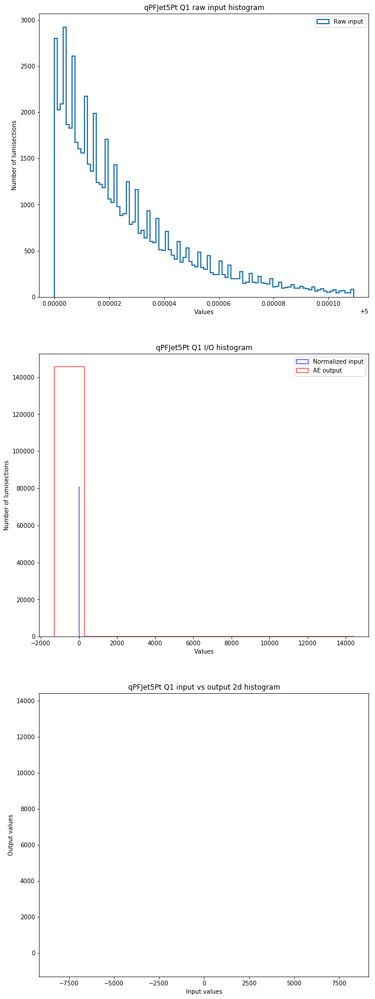

  2%|▏         | 59/2807 [08:28<6:34:57,  8.62s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/59_qPFJet5Pt_Q2


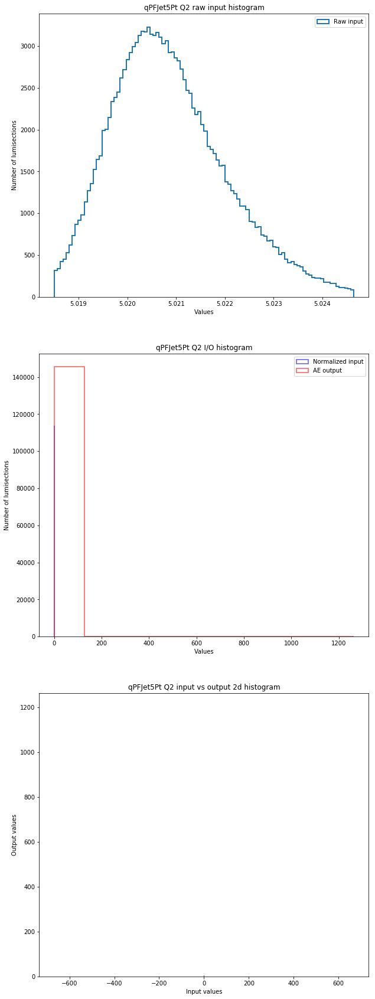

  2%|▏         | 60/2807 [08:36<6:33:52,  8.60s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/60_qPFJet5Pt_Q3


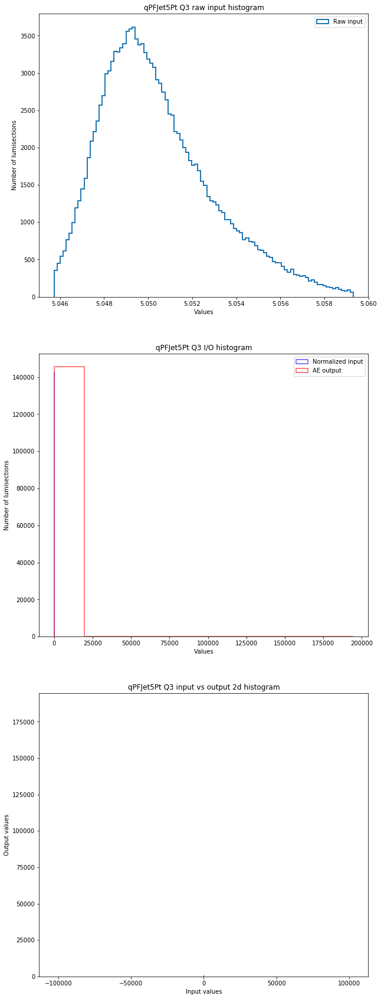

  2%|▏         | 61/2807 [08:45<6:34:04,  8.61s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/61_qPFJet5Pt_Q4


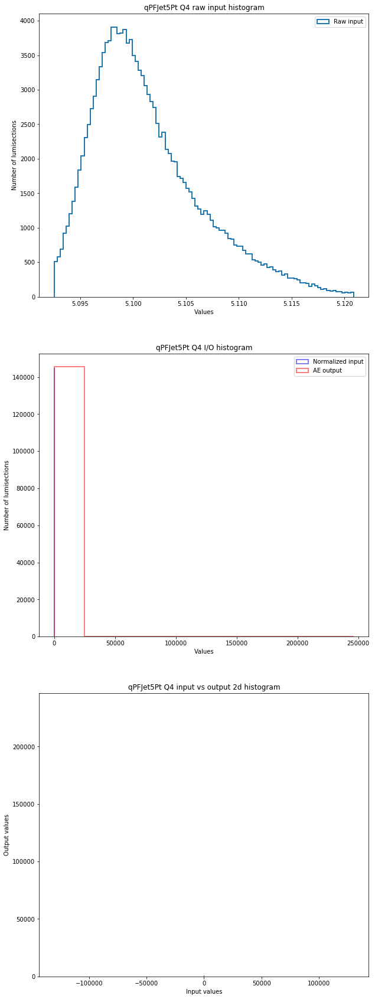

  2%|▏         | 62/2807 [08:53<6:33:19,  8.60s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/62_qPFJet5Pt_Q5


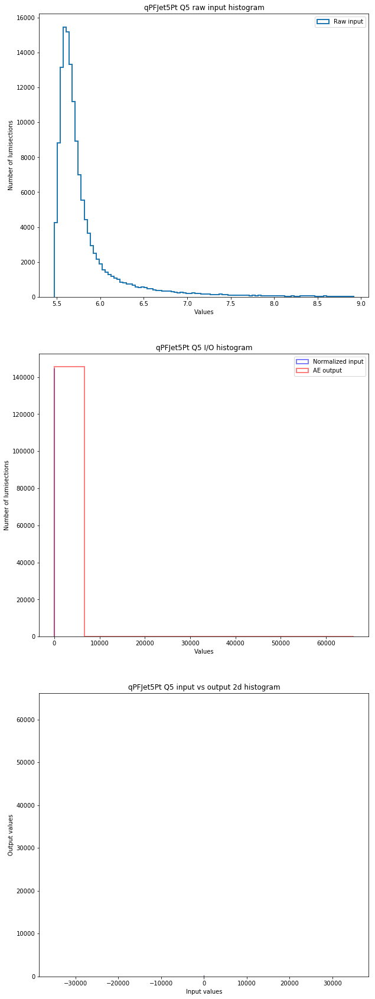

  2%|▏         | 63/2807 [09:02<6:33:47,  8.61s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/63_qPFJet0Eta_mean


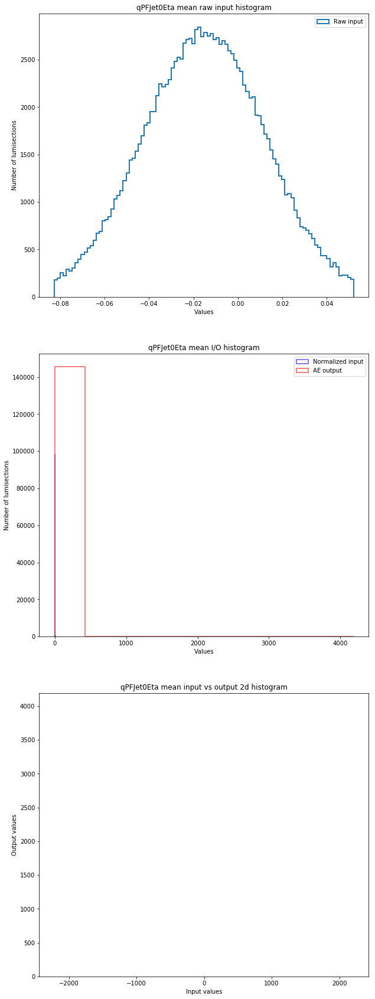

  2%|▏         | 64/2807 [09:10<6:33:07,  8.60s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/64_qPFJet0Eta_RMS


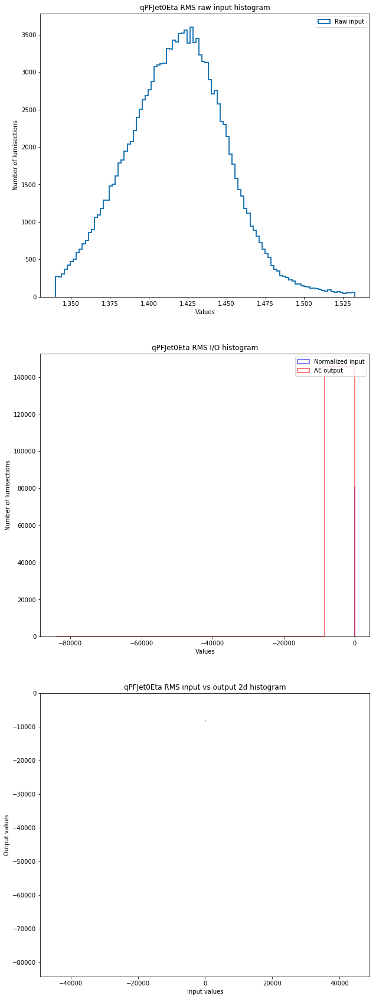

  2%|▏         | 65/2807 [09:19<6:33:13,  8.60s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/65_qPFJet0Eta_Q1


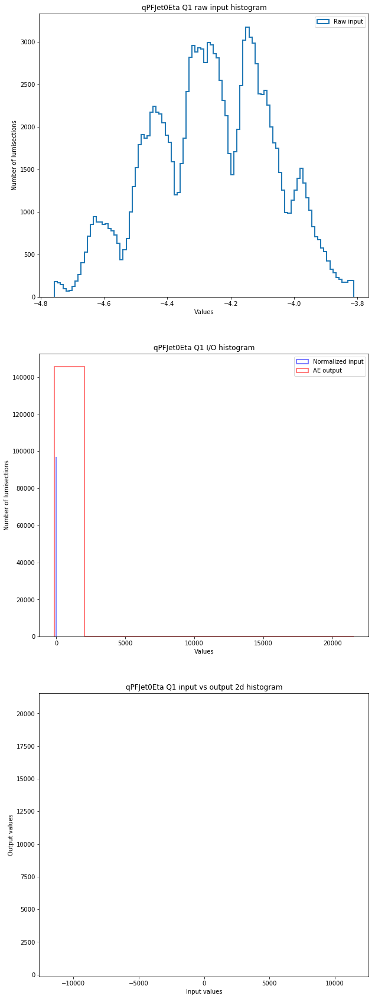

  2%|▏         | 66/2807 [09:27<6:32:52,  8.60s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/66_qPFJet0Eta_Q2


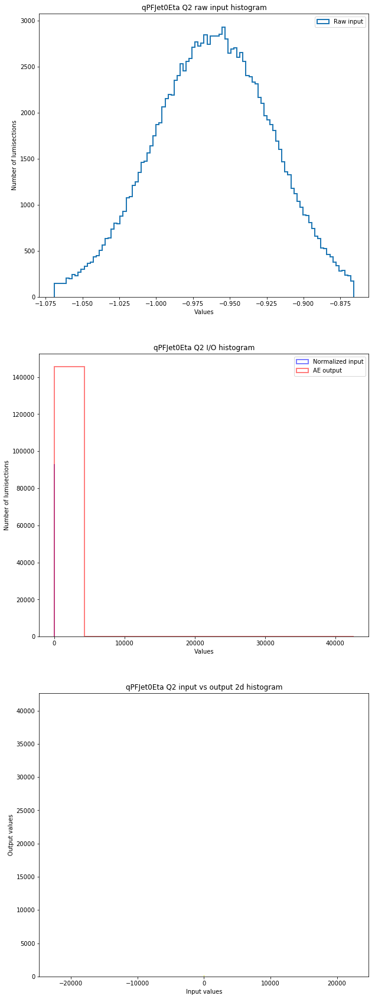

  2%|▏         | 67/2807 [09:36<6:32:44,  8.60s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/67_qPFJet0Eta_Q3


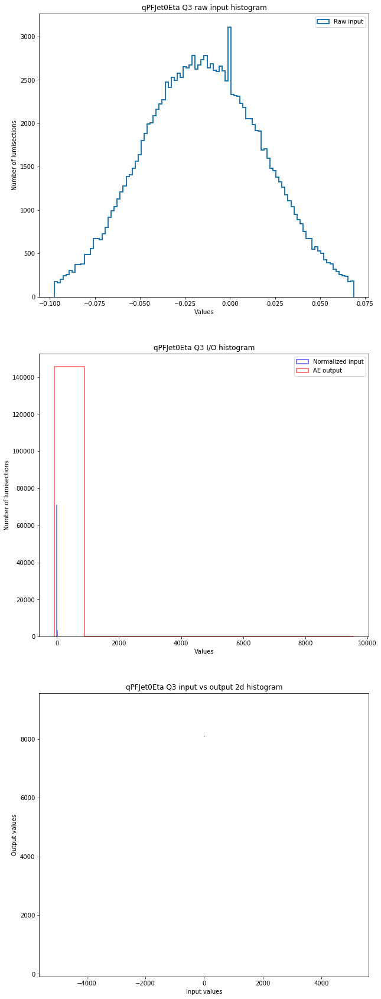

  2%|▏         | 68/2807 [09:45<6:32:51,  8.61s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/68_qPFJet0Eta_Q4


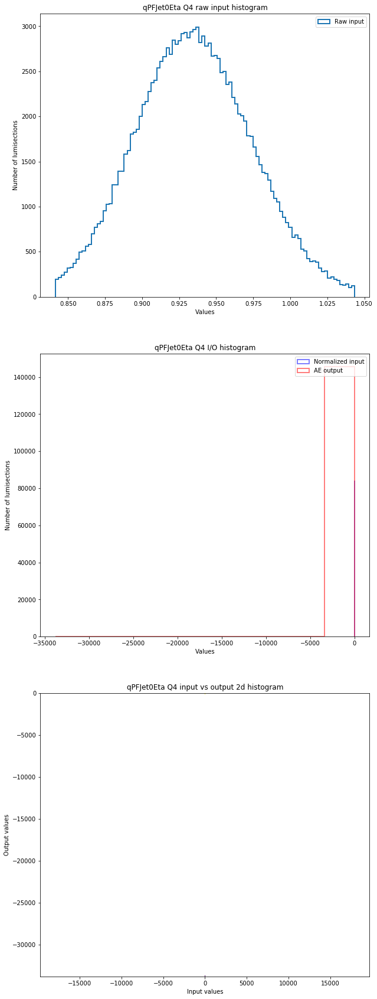

  2%|▏         | 69/2807 [09:55<6:33:37,  8.63s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/69_qPFJet0Eta_Q5


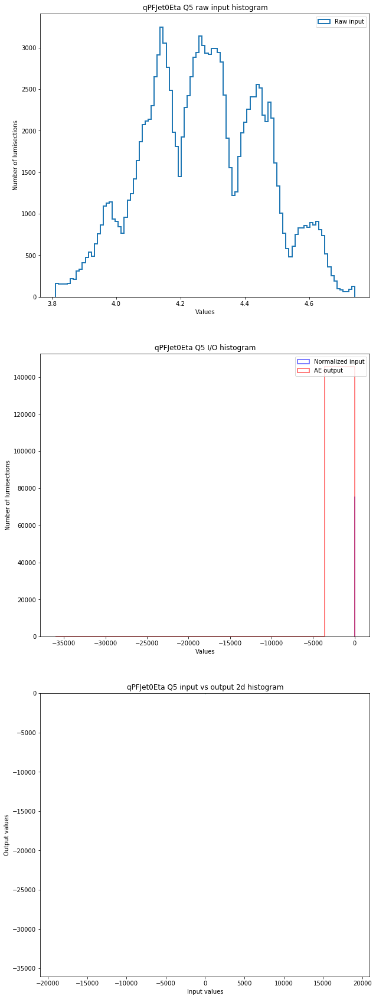

  2%|▏         | 70/2807 [10:04<6:34:00,  8.64s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/70_qPFJet1Eta_mean


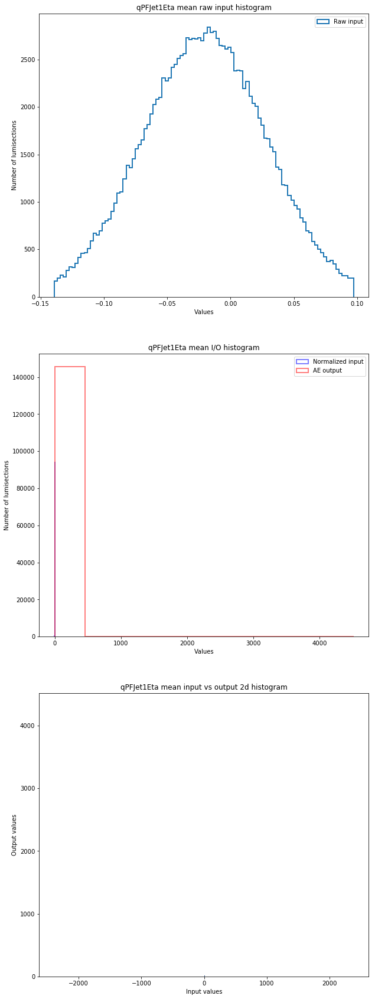

  3%|▎         | 71/2807 [10:12<6:33:20,  8.63s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/71_qPFJet1Eta_RMS


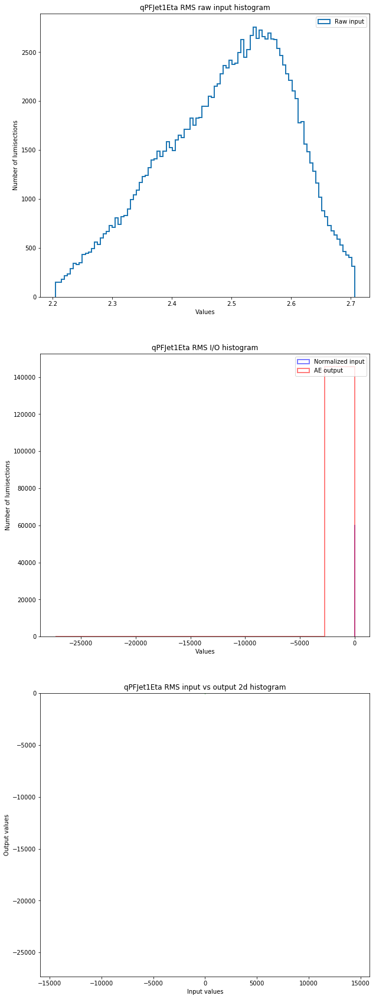

  3%|▎         | 72/2807 [10:20<6:33:05,  8.62s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/72_qPFJet1Eta_Q1


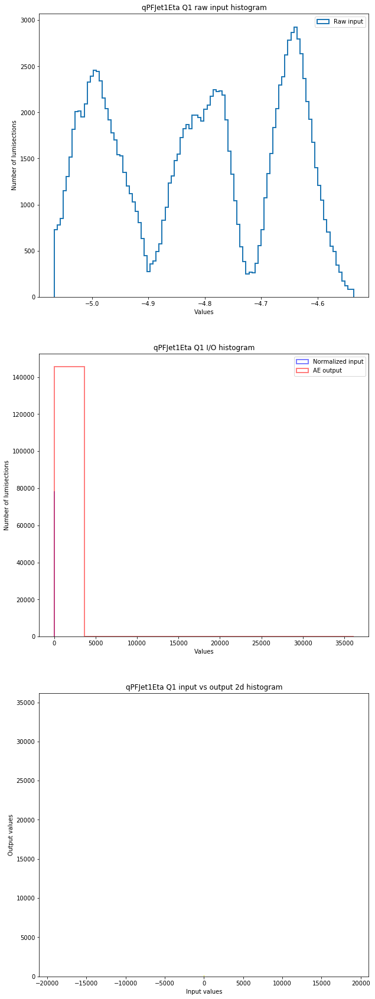

  3%|▎         | 73/2807 [10:29<6:33:02,  8.63s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/73_qPFJet1Eta_Q2


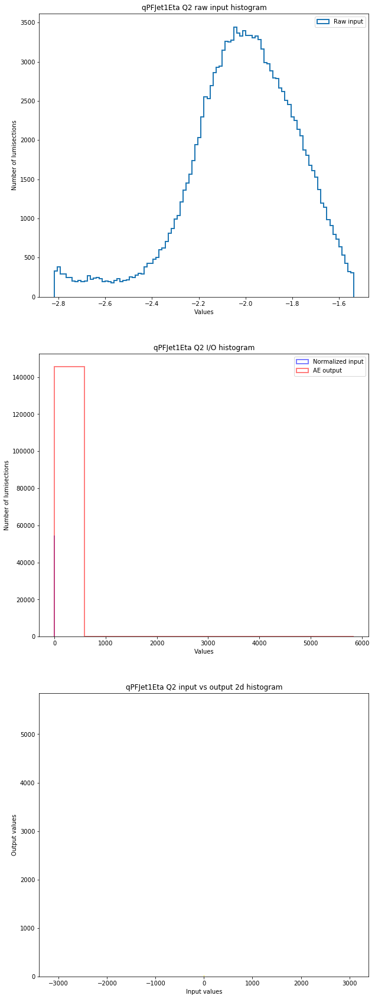

  3%|▎         | 74/2807 [10:40<6:34:01,  8.65s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/74_qPFJet1Eta_Q3


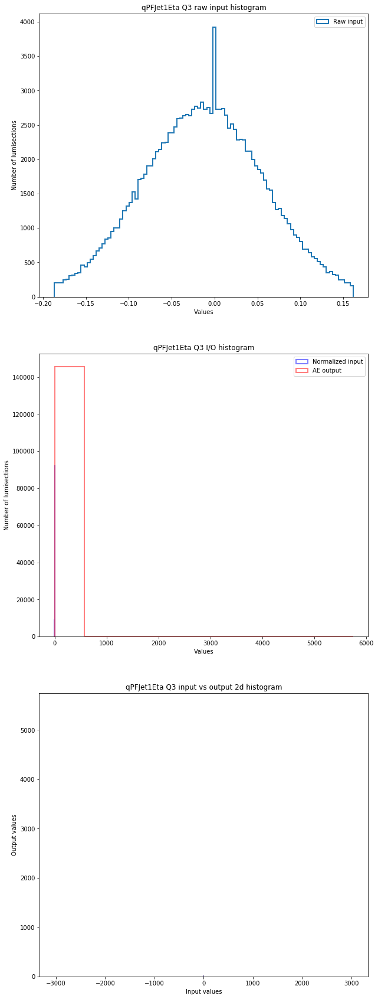

  3%|▎         | 75/2807 [10:48<6:33:38,  8.65s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/75_qPFJet1Eta_Q4


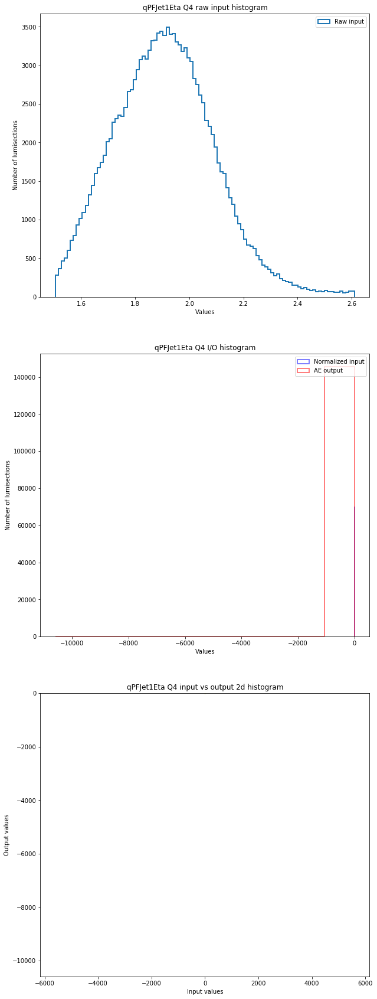

  3%|▎         | 76/2807 [10:57<6:33:35,  8.65s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/76_qPFJet1Eta_Q5


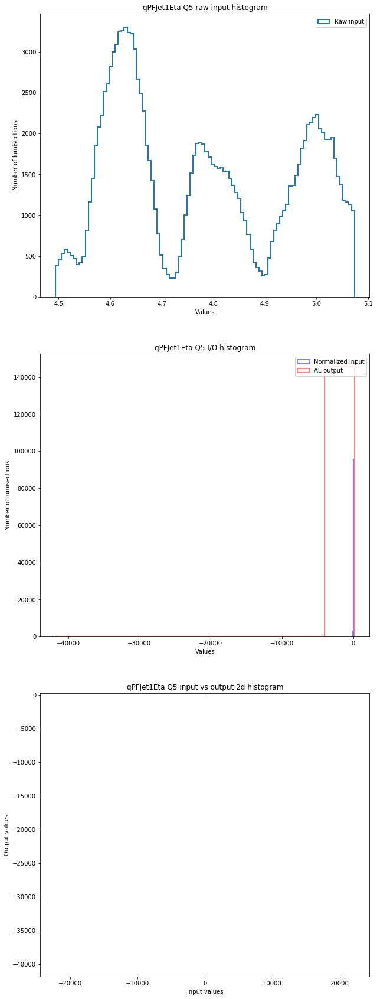

  3%|▎         | 77/2807 [11:05<6:33:01,  8.64s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/77_qPFJet2Eta_mean


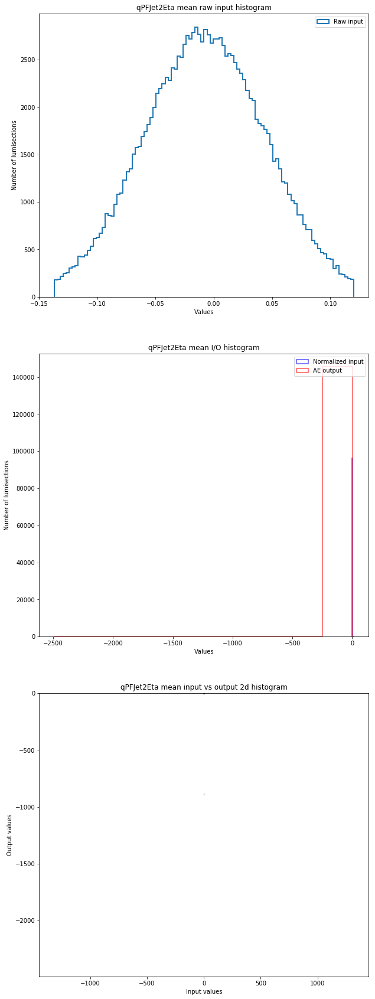

  3%|▎         | 78/2807 [11:15<6:33:51,  8.66s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/78_qPFJet2Eta_RMS


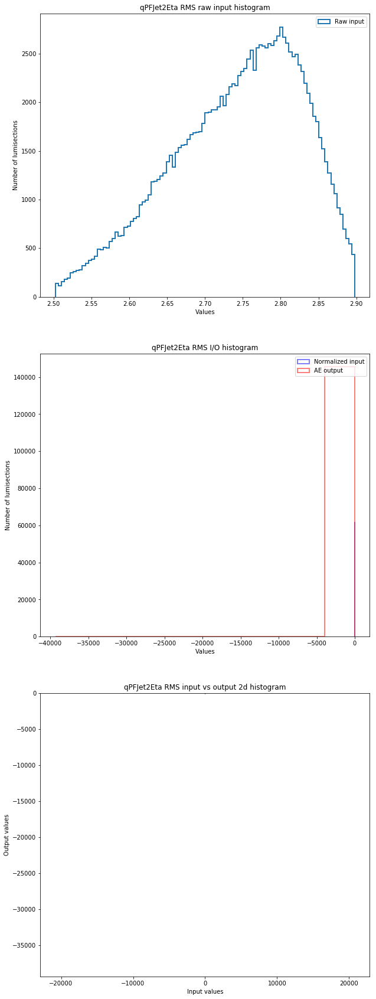

  3%|▎         | 79/2807 [11:23<6:33:12,  8.65s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/79_qPFJet2Eta_Q1


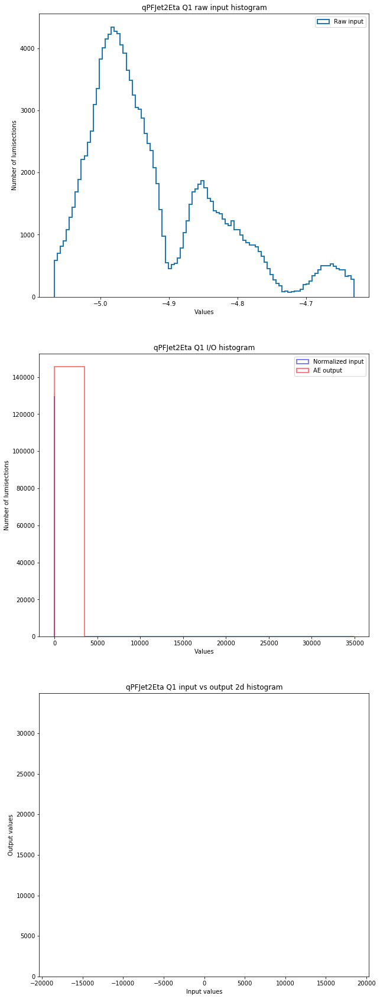

  3%|▎         | 80/2807 [11:33<6:33:43,  8.66s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/80_qPFJet2Eta_Q2


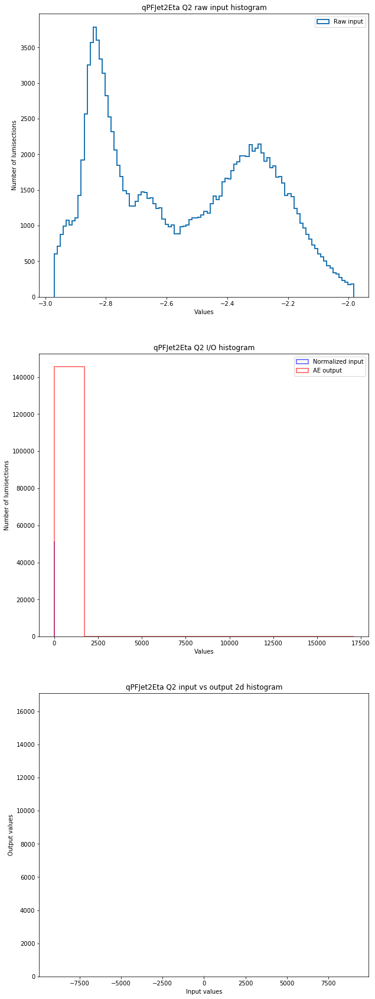

  3%|▎         | 81/2807 [11:43<6:34:21,  8.68s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/81_qPFJet2Eta_Q3


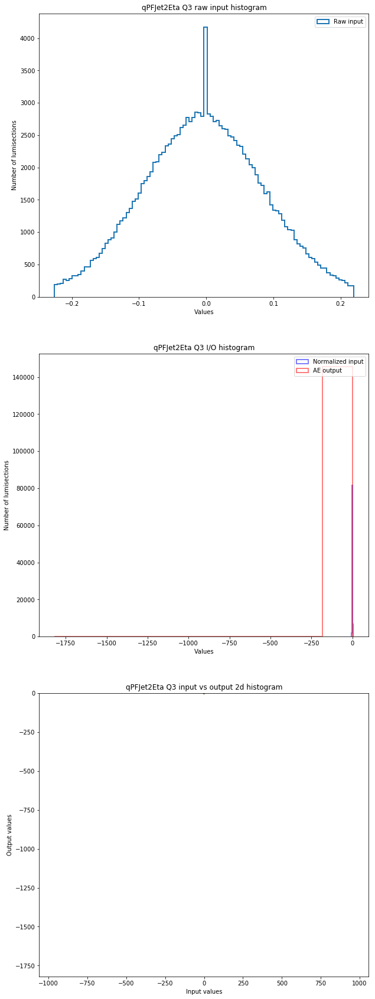

  3%|▎         | 82/2807 [11:51<6:34:12,  8.68s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/82_qPFJet2Eta_Q4


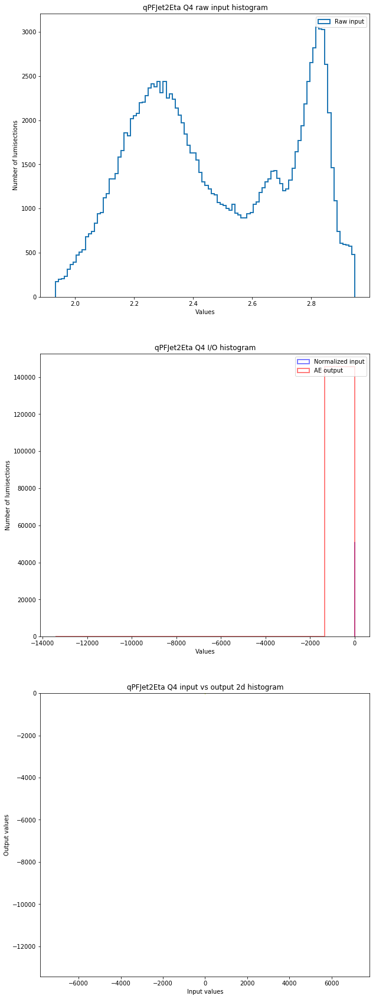

  3%|▎         | 83/2807 [12:00<6:34:17,  8.68s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/83_qPFJet2Eta_Q5


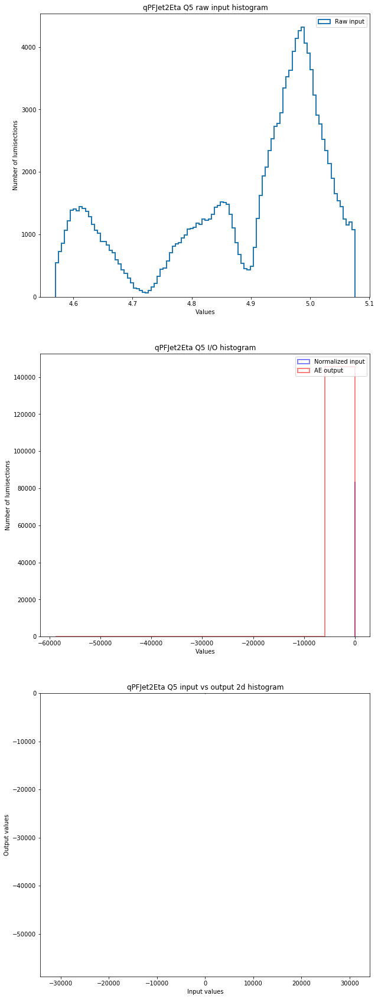

  3%|▎         | 84/2807 [12:09<6:34:01,  8.68s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/84_qPFJet3Eta_mean


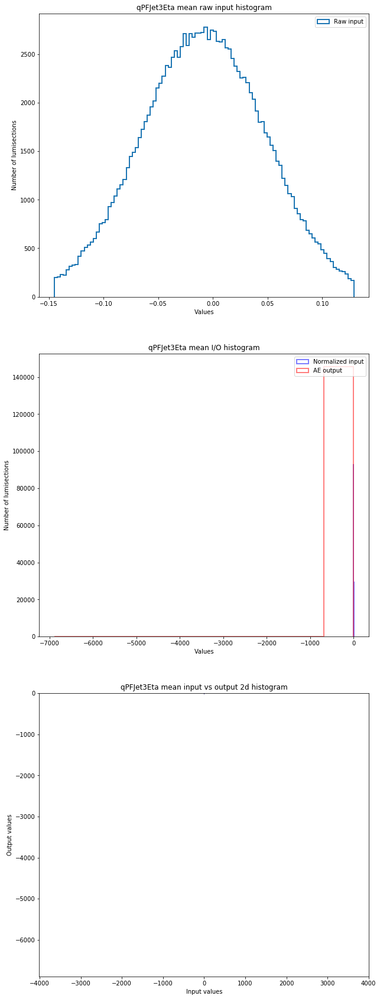

  3%|▎         | 85/2807 [12:18<6:34:13,  8.69s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/85_qPFJet3Eta_RMS


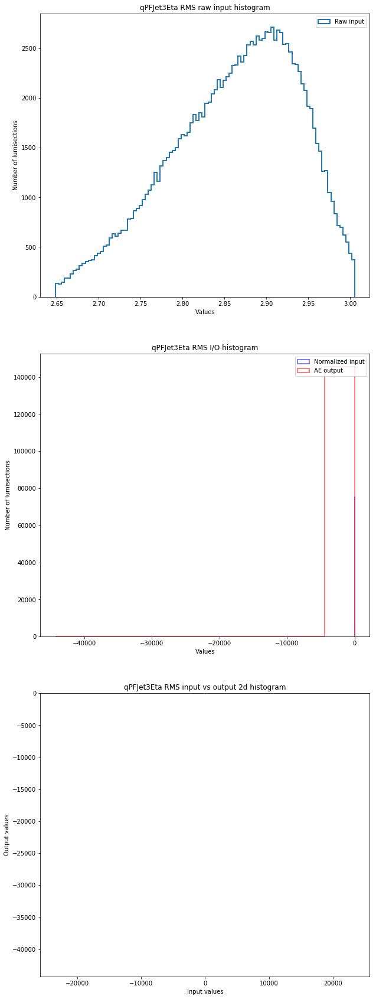

  3%|▎         | 86/2807 [12:29<6:35:06,  8.71s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/86_qPFJet3Eta_Q1


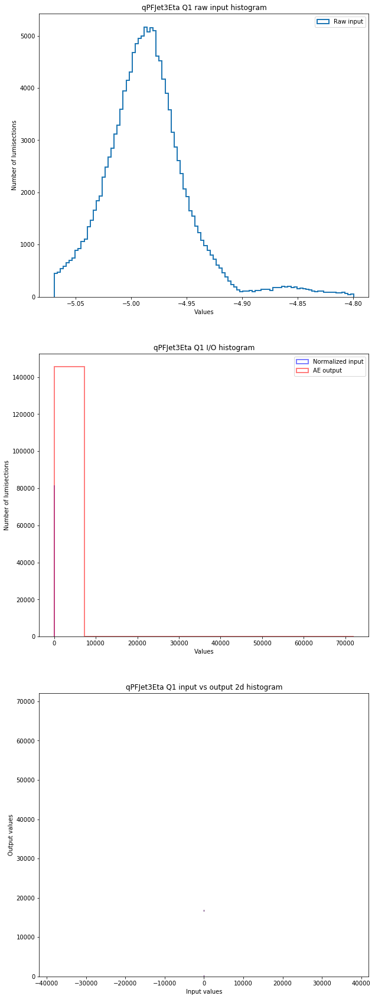

  3%|▎         | 87/2807 [12:38<6:35:13,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/87_qPFJet3Eta_Q2


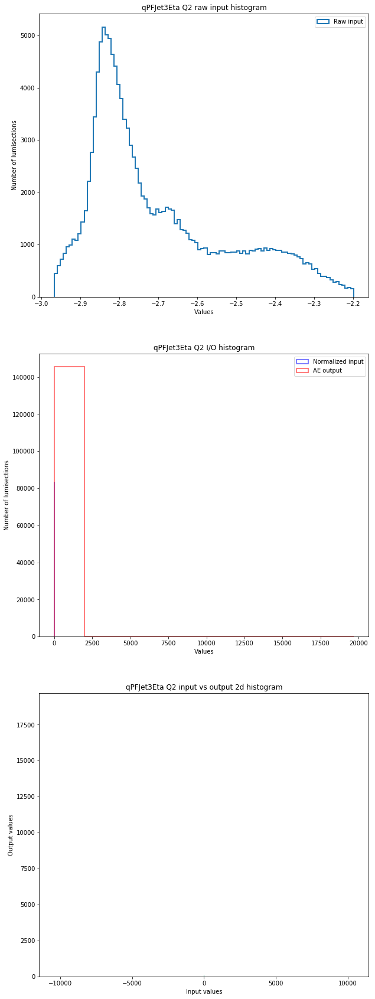

  3%|▎         | 88/2807 [12:47<6:35:10,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/88_qPFJet3Eta_Q3


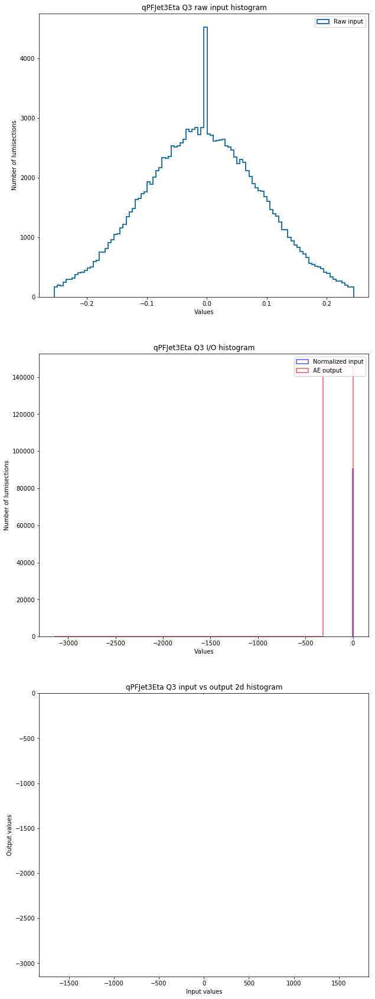

  3%|▎         | 89/2807 [12:55<6:34:28,  8.71s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/89_qPFJet3Eta_Q4


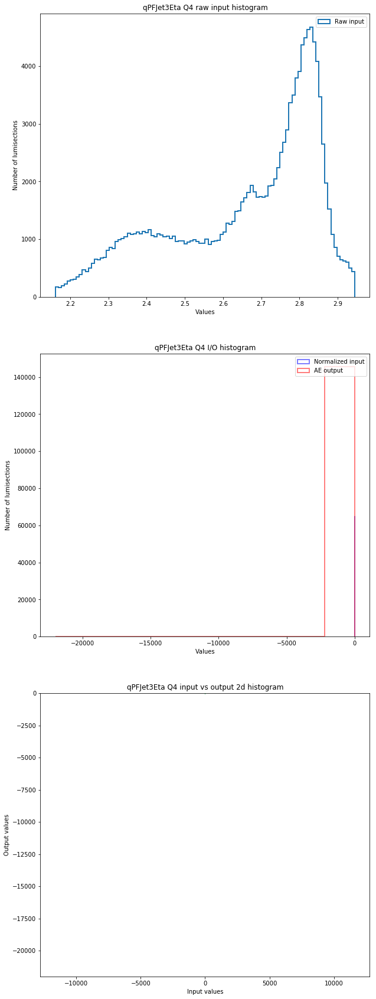

  3%|▎         | 90/2807 [13:03<6:34:19,  8.71s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/90_qPFJet3Eta_Q5


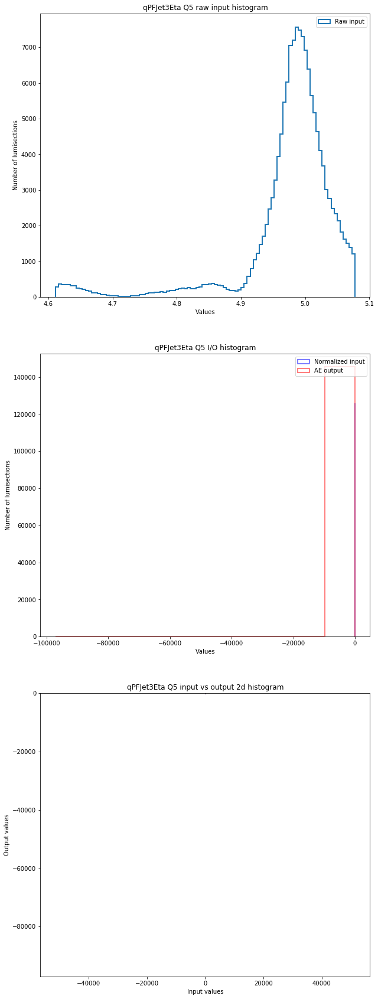

  3%|▎         | 91/2807 [13:13<6:34:35,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/91_qPFJet4Eta_mean


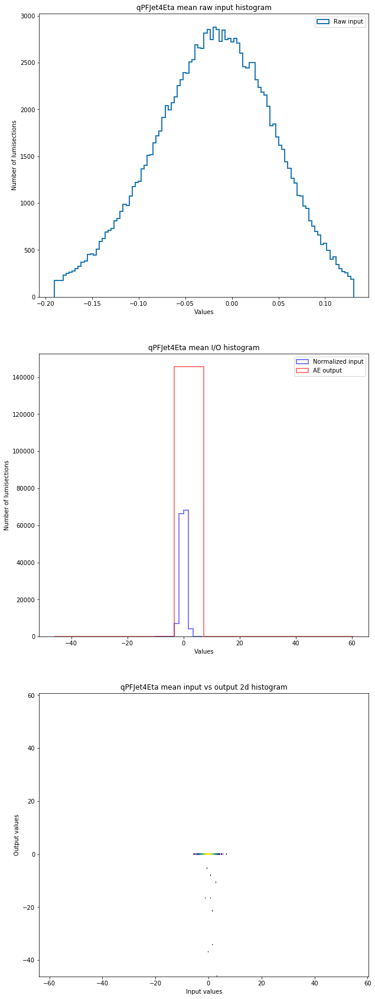

  3%|▎         | 92/2807 [13:23<6:35:05,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/92_qPFJet4Eta_RMS


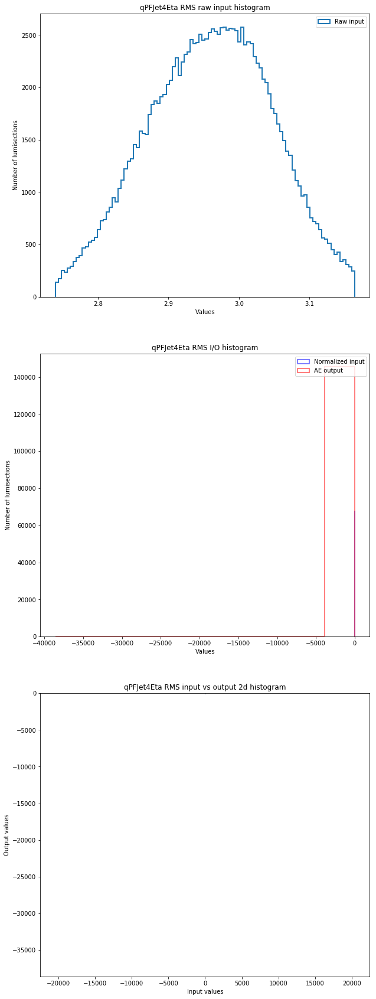

  3%|▎         | 93/2807 [13:31<6:34:53,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/93_qPFJet4Eta_Q1


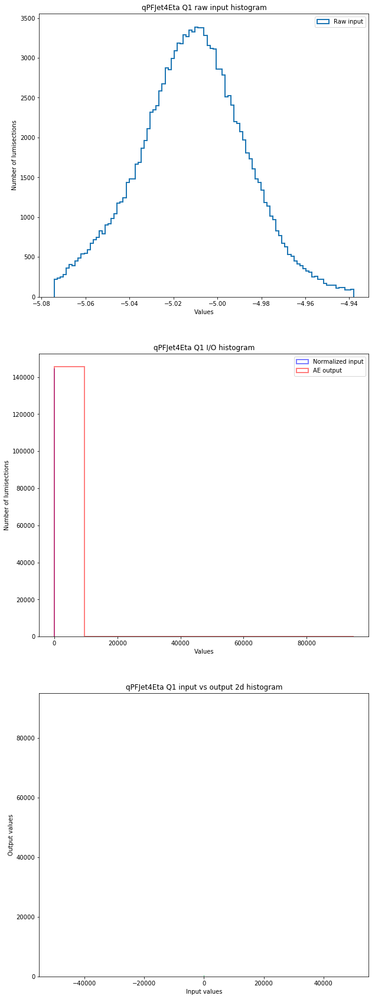

  3%|▎         | 94/2807 [13:40<6:34:43,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/94_qPFJet4Eta_Q2


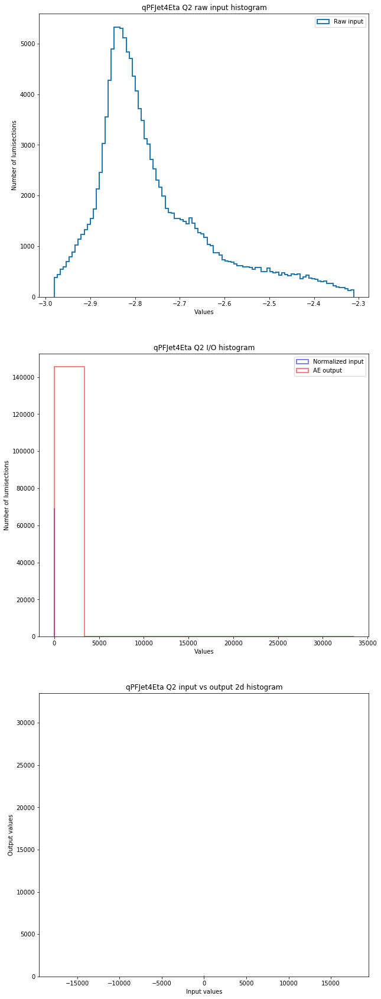

  3%|▎         | 95/2807 [13:49<6:34:45,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/95_qPFJet4Eta_Q3


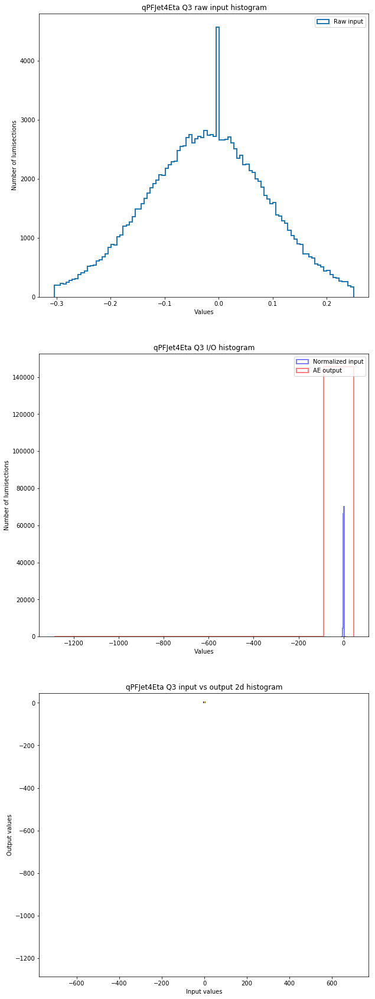

  3%|▎         | 96/2807 [13:57<6:34:24,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/96_qPFJet4Eta_Q4


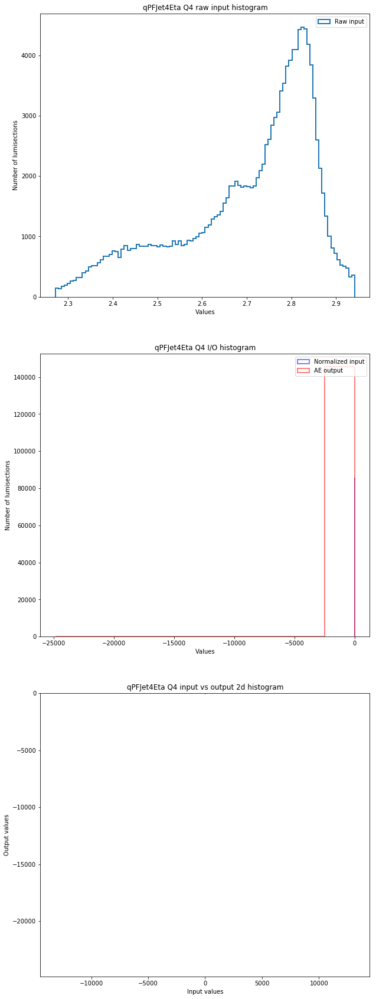

  3%|▎         | 97/2807 [14:06<6:34:21,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/97_qPFJet4Eta_Q5


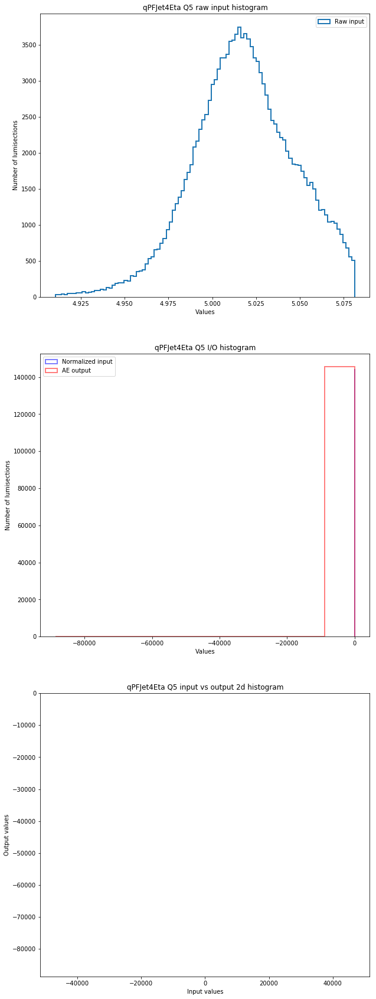

  3%|▎         | 98/2807 [14:14<6:33:41,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/98_qPFJet5Eta_mean


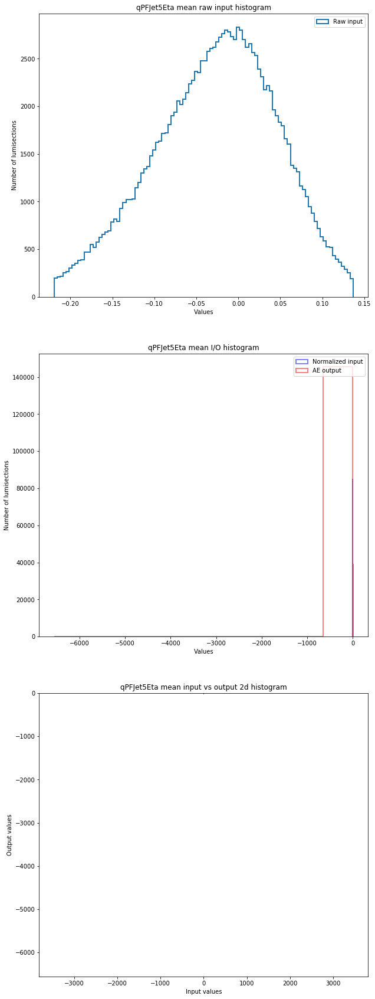

  4%|▎         | 99/2807 [14:24<6:34:04,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/99_qPFJet5Eta_RMS


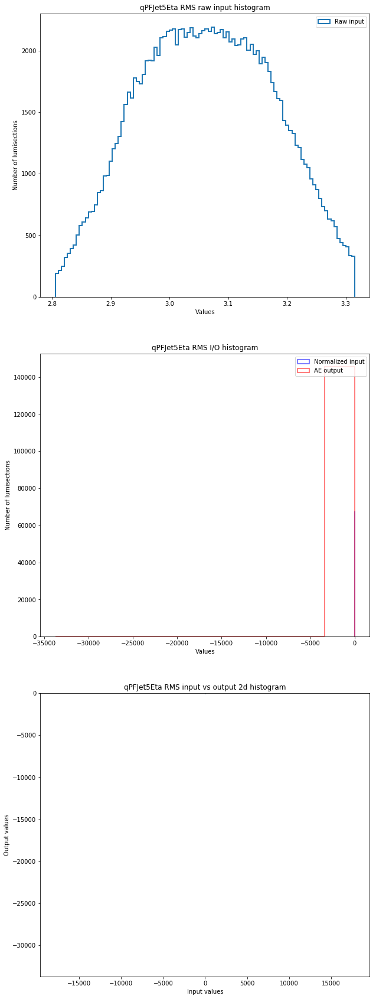

  4%|▎         | 100/2807 [14:32<6:33:30,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/100_qPFJet5Eta_Q1


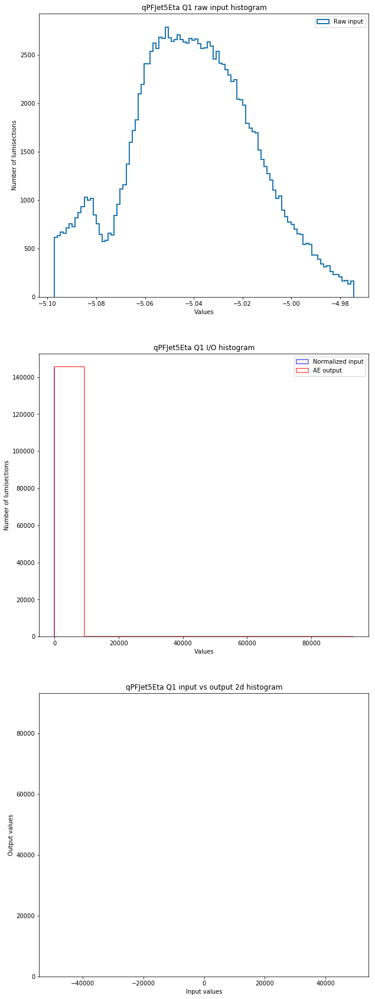

  4%|▎         | 101/2807 [14:42<6:34:01,  8.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/101_qPFJet5Eta_Q2


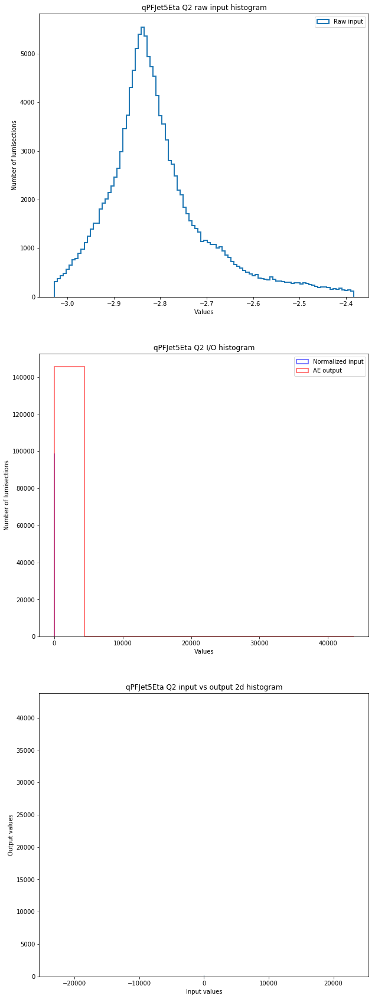

  4%|▎         | 102/2807 [14:51<6:34:00,  8.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/102_qPFJet5Eta_Q3


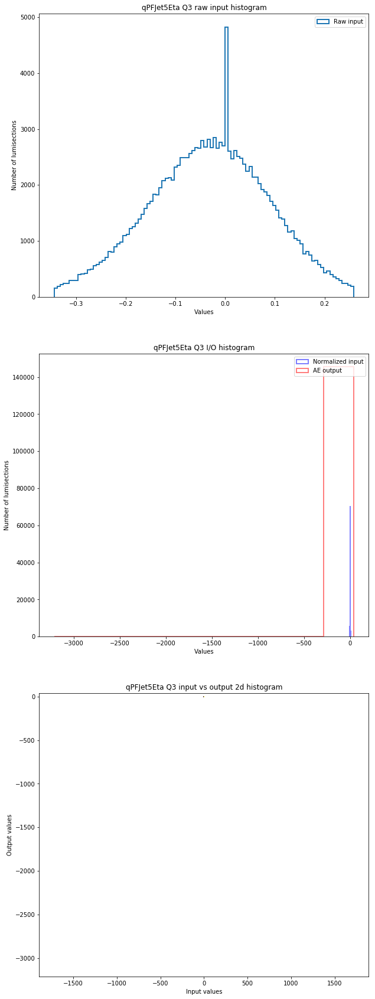

  4%|▎         | 103/2807 [15:00<6:33:55,  8.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/103_qPFJet5Eta_Q4


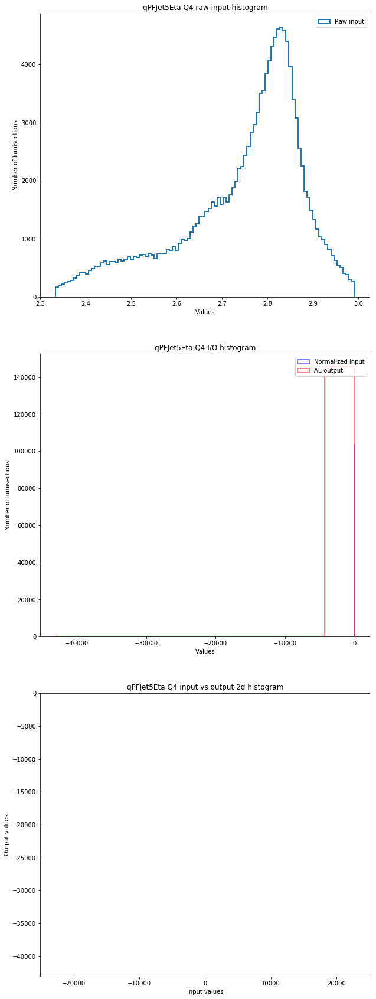

  4%|▎         | 104/2807 [15:09<6:33:46,  8.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/104_qPFJet5Eta_Q5


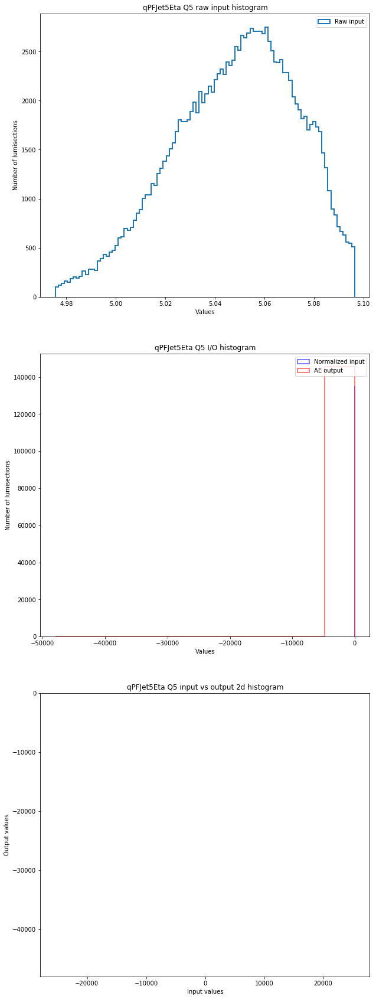

  4%|▎         | 105/2807 [15:16<6:33:16,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/105_qPFJet0Phi_mean


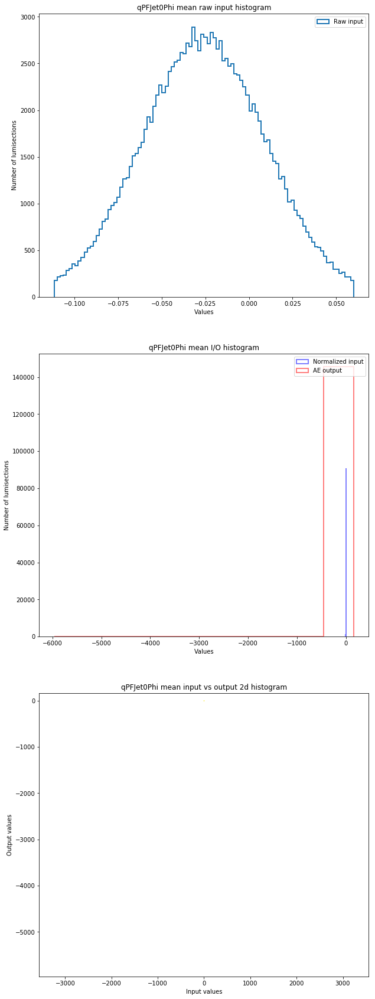

  4%|▍         | 106/2807 [15:25<6:32:51,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/106_qPFJet0Phi_RMS


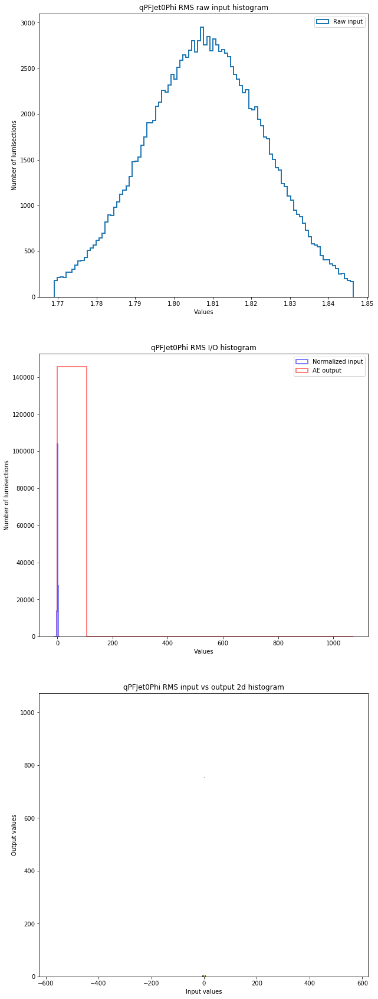

  4%|▍         | 107/2807 [15:33<6:32:43,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/107_qPFJet0Phi_Q1


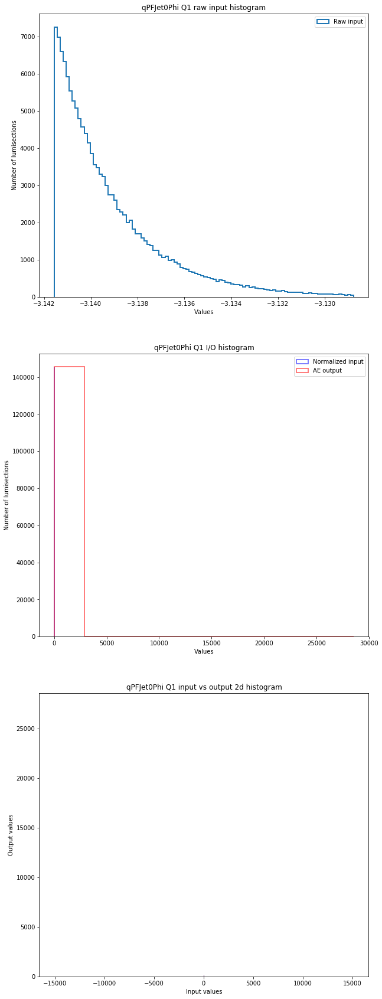

  4%|▍         | 108/2807 [15:42<6:32:23,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/108_qPFJet0Phi_Q2


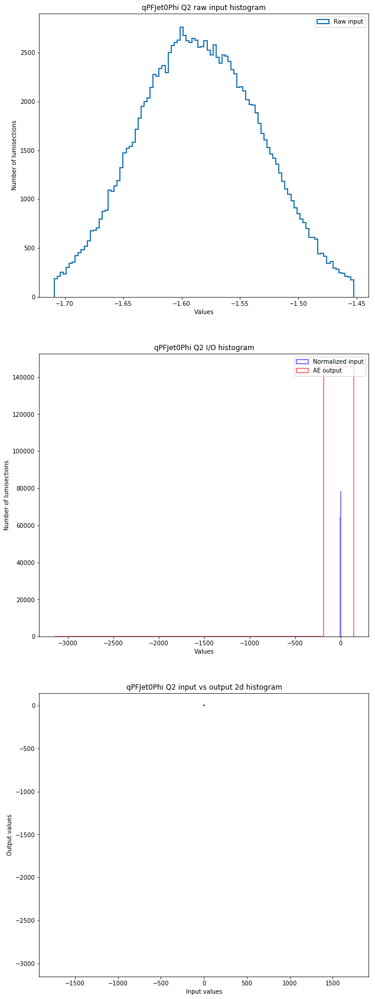

  4%|▍         | 109/2807 [15:50<6:31:58,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/109_qPFJet0Phi_Q3


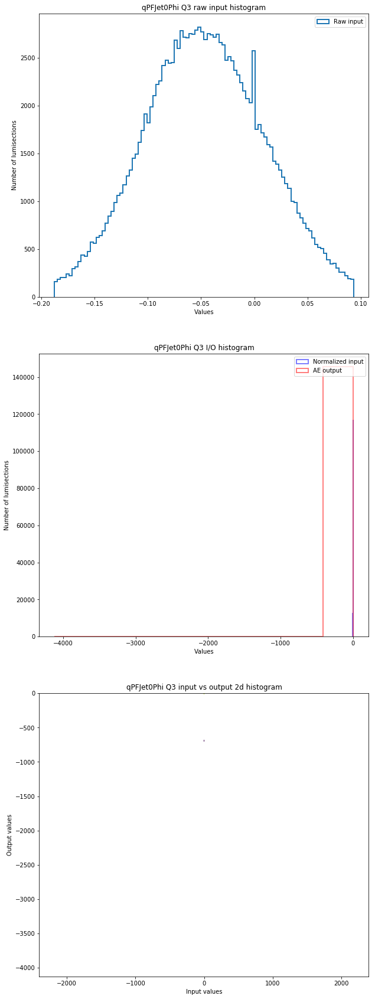

  4%|▍         | 110/2807 [15:59<6:31:54,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/110_qPFJet0Phi_Q4


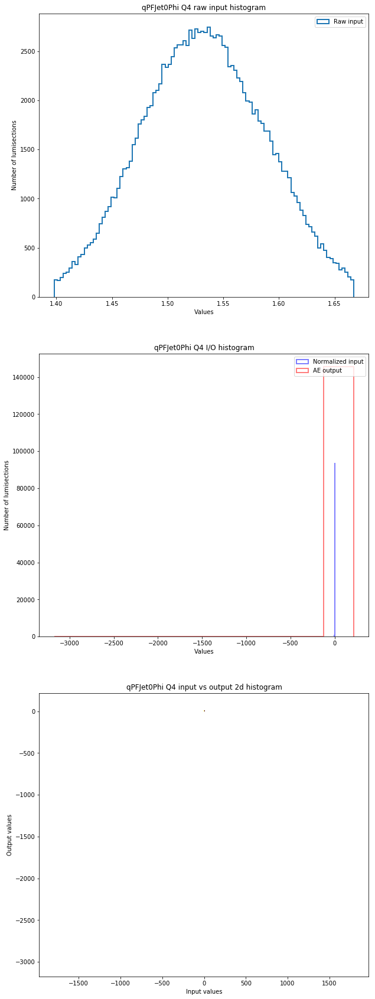

  4%|▍         | 111/2807 [16:07<6:31:29,  8.71s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/111_qPFJet0Phi_Q5


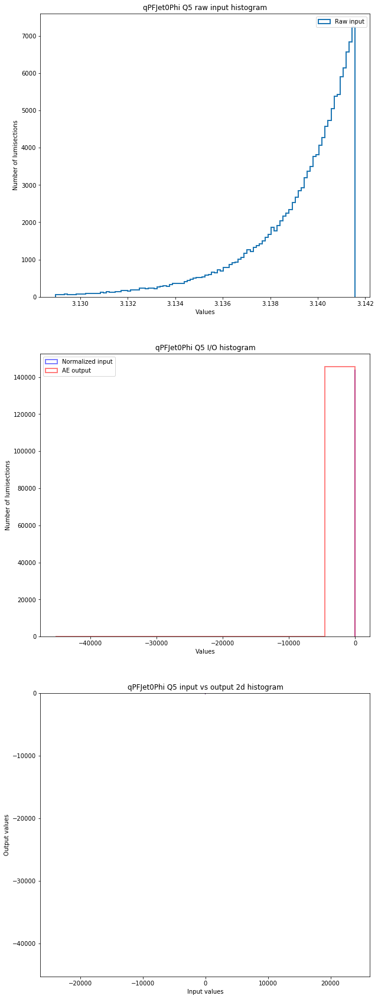

  4%|▍         | 112/2807 [16:16<6:31:47,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/112_qPFJet1Phi_mean


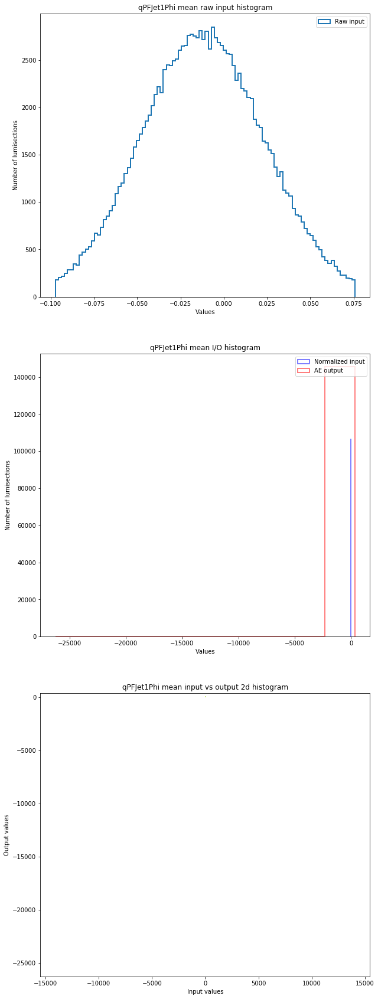

  4%|▍         | 113/2807 [16:25<6:31:36,  8.72s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/113_qPFJet1Phi_RMS


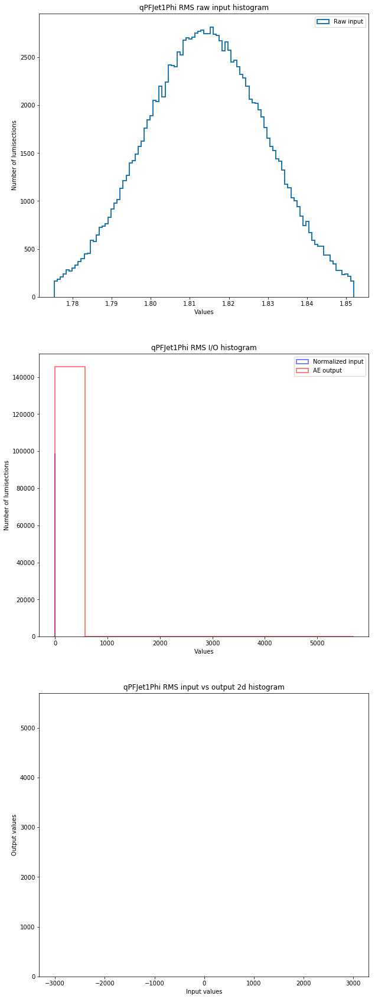

  4%|▍         | 114/2807 [16:34<6:31:37,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/114_qPFJet1Phi_Q1


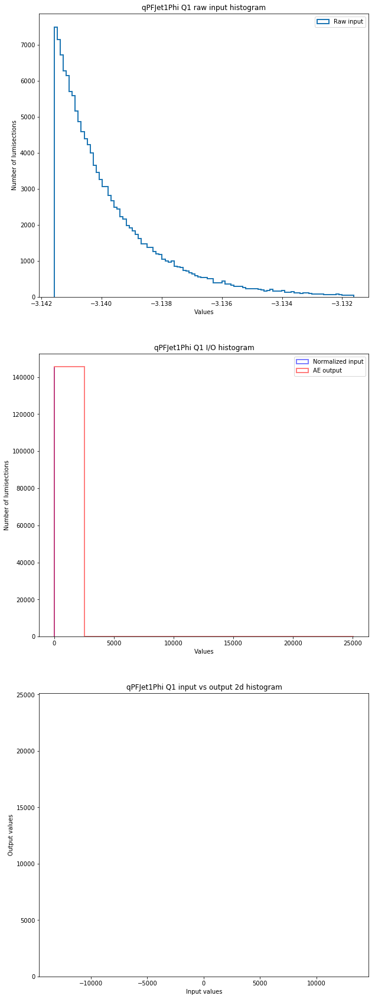

  4%|▍         | 115/2807 [16:44<6:31:53,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/115_qPFJet1Phi_Q2


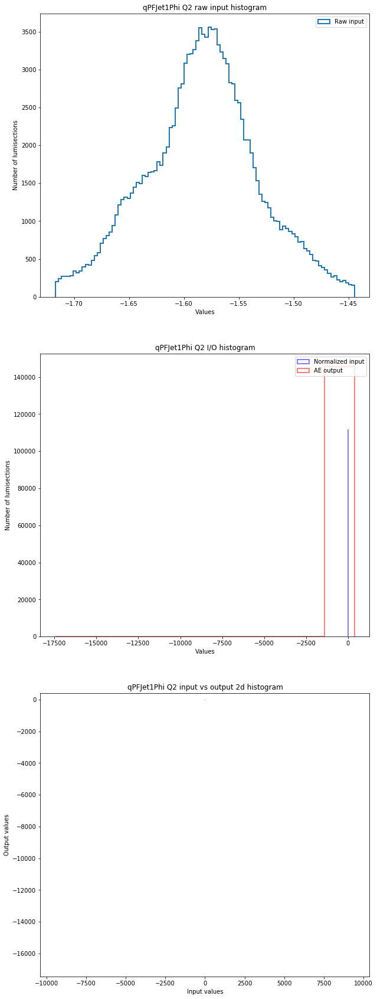

  4%|▍         | 116/2807 [16:53<6:32:01,  8.74s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/116_qPFJet1Phi_Q3


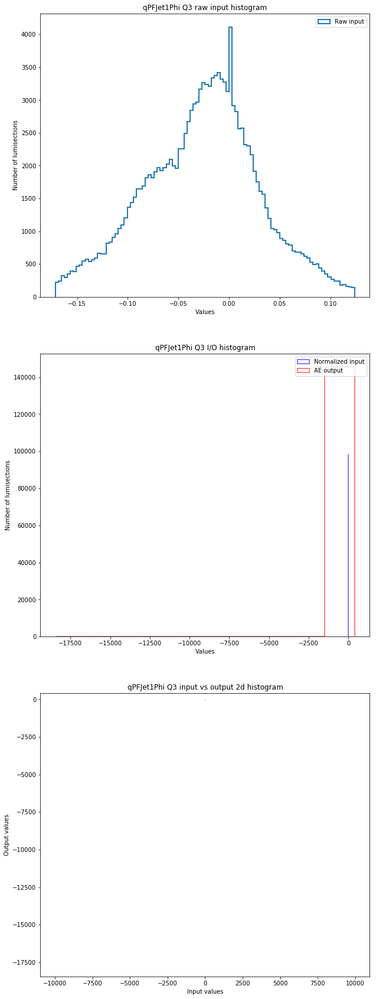

  4%|▍         | 117/2807 [17:01<6:31:29,  8.73s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/117_qPFJet1Phi_Q4


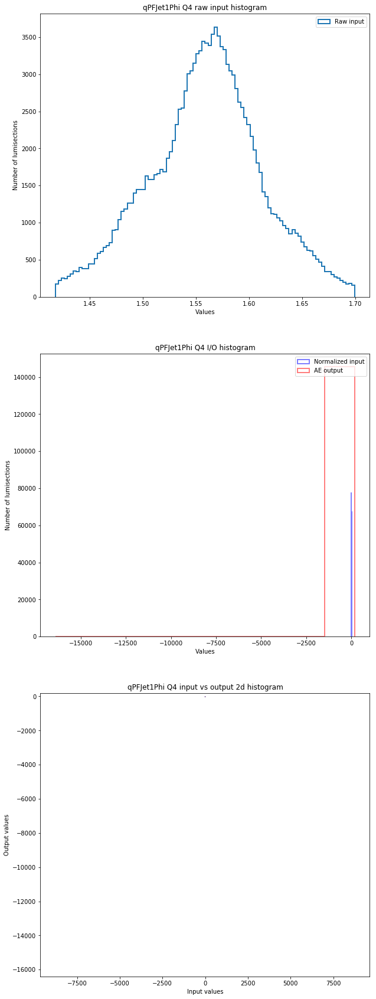

  4%|▍         | 118/2807 [17:12<6:32:08,  8.75s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/118_qPFJet1Phi_Q5


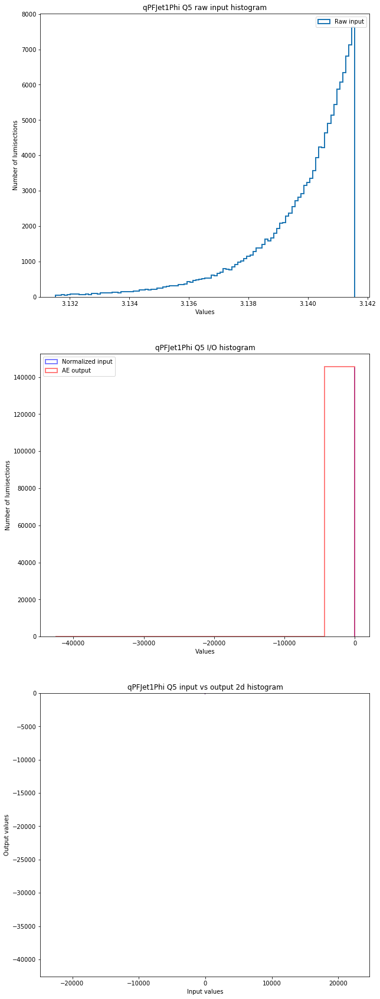

  4%|▍         | 119/2807 [17:21<6:32:07,  8.75s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/119_qPFJet2Phi_mean


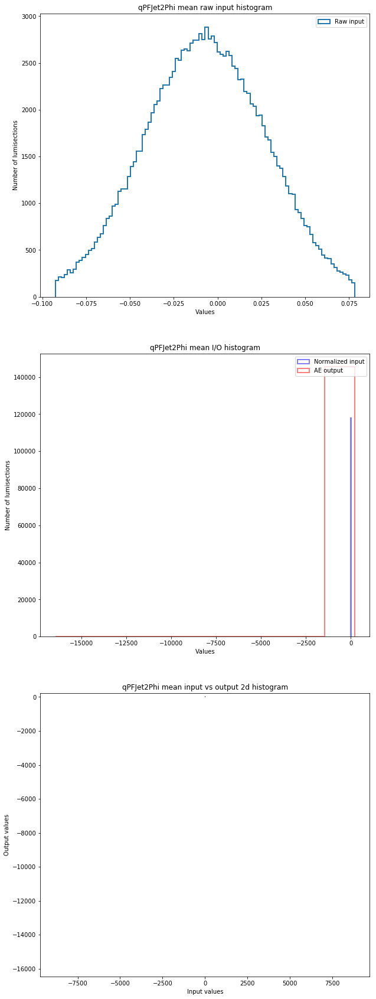

  4%|▍         | 120/2807 [17:30<6:32:00,  8.75s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/120_qPFJet2Phi_RMS


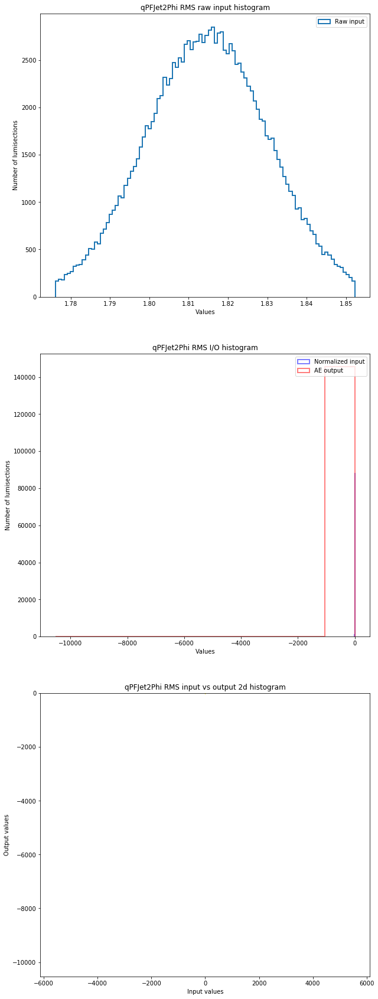

  4%|▍         | 121/2807 [17:40<6:32:14,  8.76s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/121_qPFJet2Phi_Q1


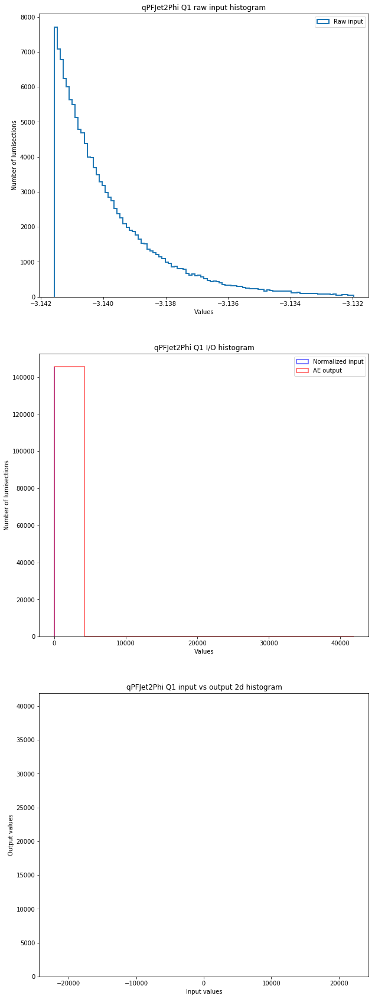

  4%|▍         | 122/2807 [17:49<6:32:28,  8.77s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/122_qPFJet2Phi_Q2


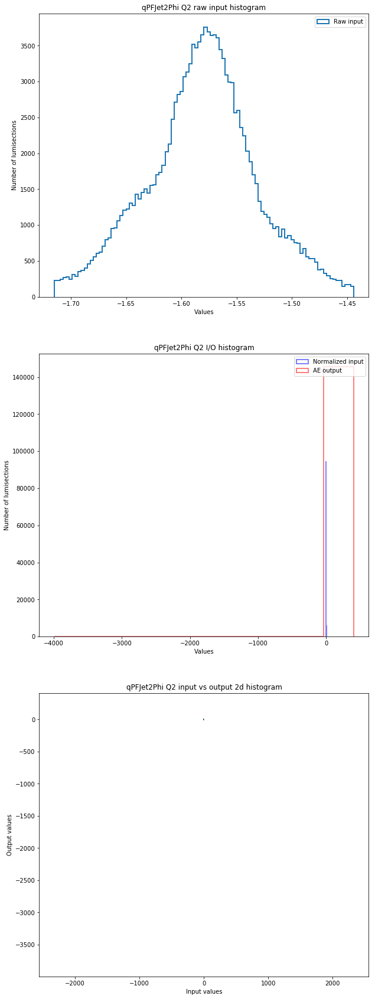

  4%|▍         | 123/2807 [17:59<6:32:35,  8.78s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/123_qPFJet2Phi_Q3


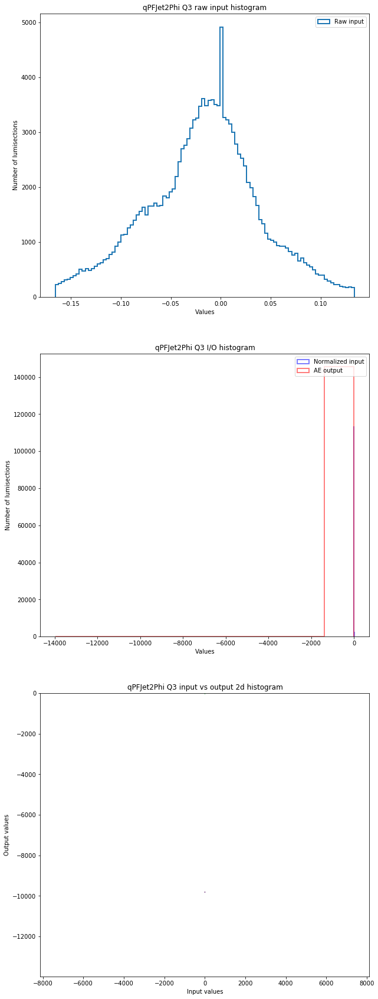

  4%|▍         | 124/2807 [18:09<6:32:44,  8.78s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/124_qPFJet2Phi_Q4


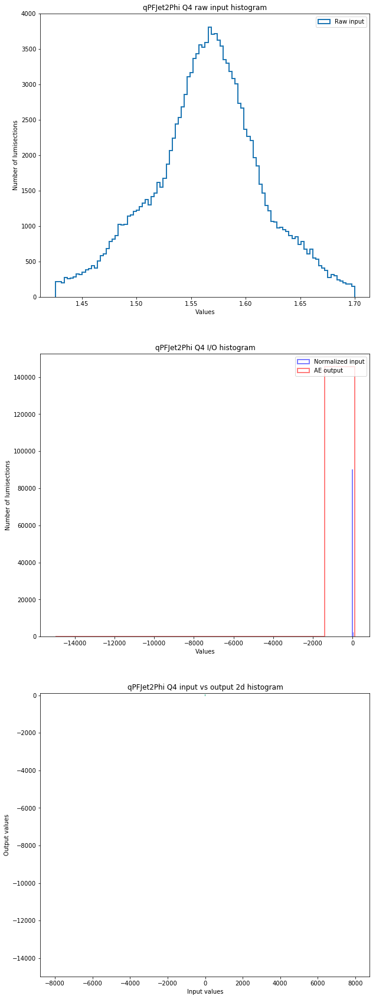

  4%|▍         | 125/2807 [18:18<6:32:59,  8.79s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/125_qPFJet2Phi_Q5


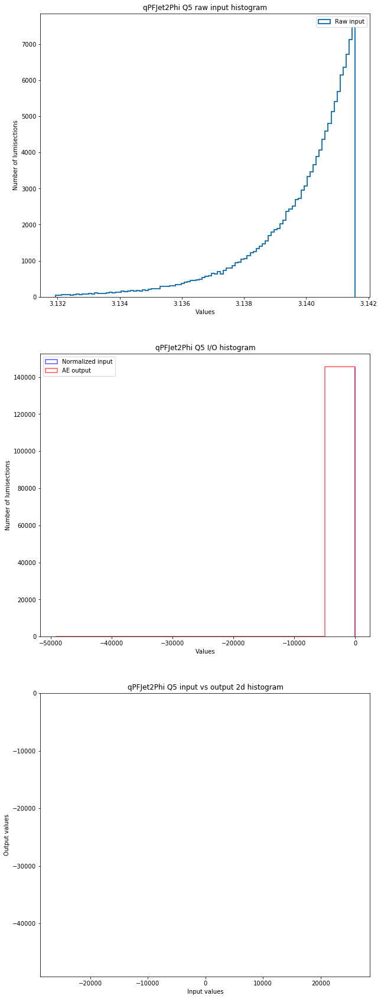

  4%|▍         | 126/2807 [18:29<6:33:17,  8.80s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/126_qPFJet3Phi_mean


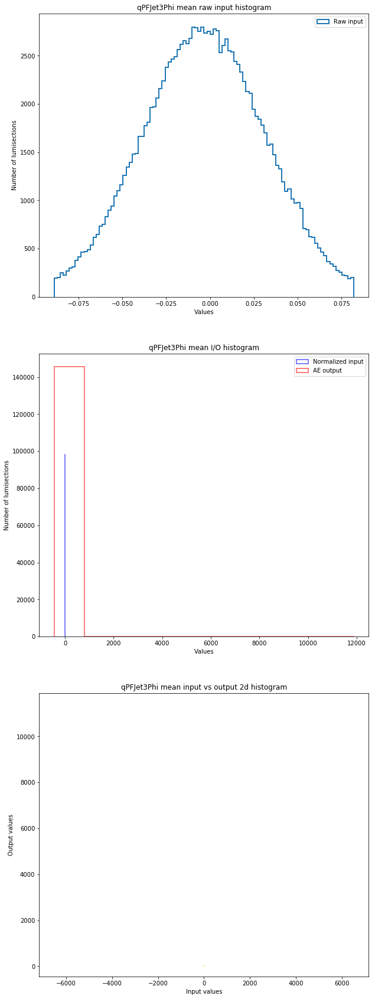

  5%|▍         | 127/2807 [18:37<6:33:06,  8.80s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/127_qPFJet3Phi_RMS


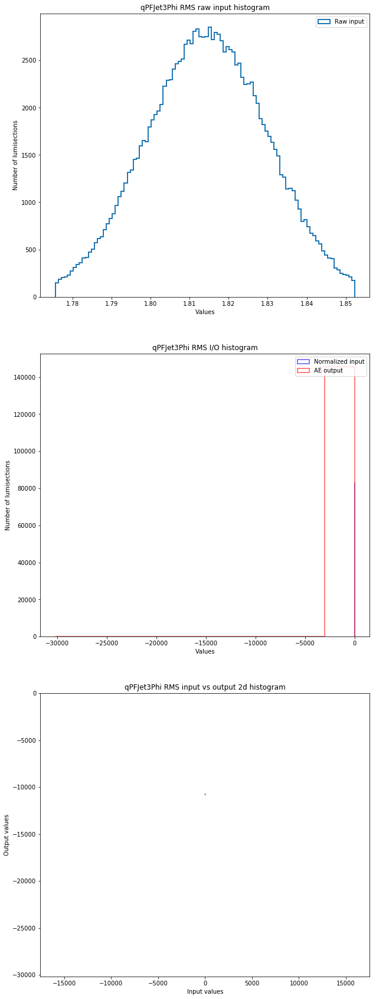

  5%|▍         | 128/2807 [18:47<6:33:10,  8.81s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/128_qPFJet3Phi_Q1


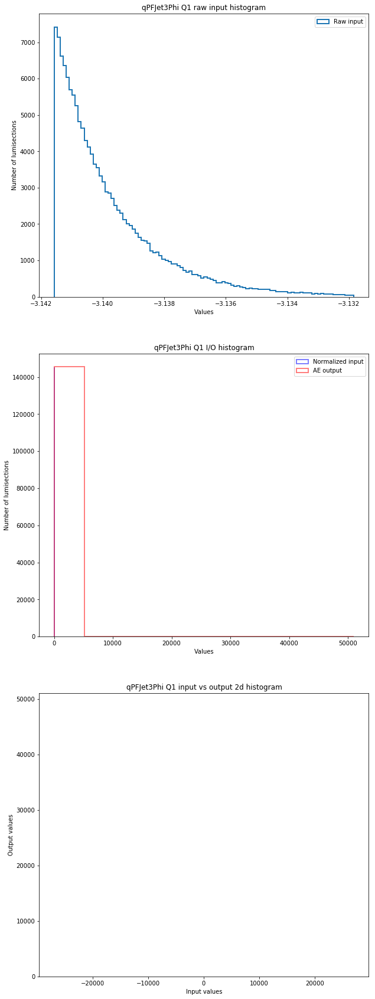

  5%|▍         | 129/2807 [18:56<6:33:13,  8.81s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/129_qPFJet3Phi_Q2


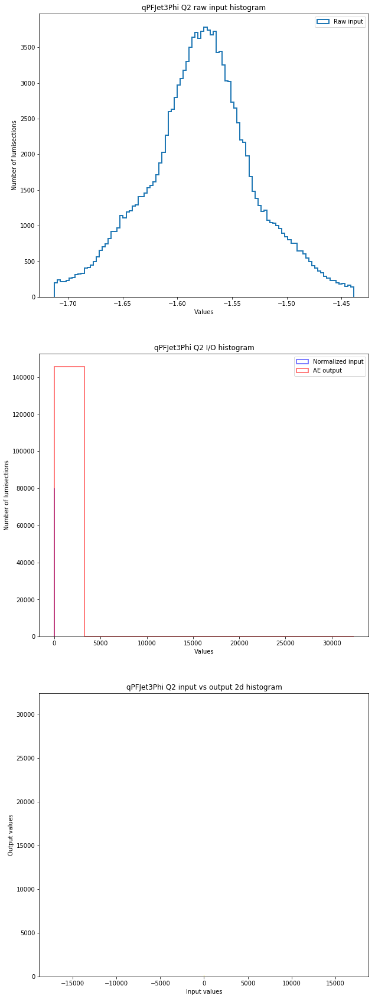

  5%|▍         | 130/2807 [19:04<6:32:57,  8.81s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/130_qPFJet3Phi_Q3


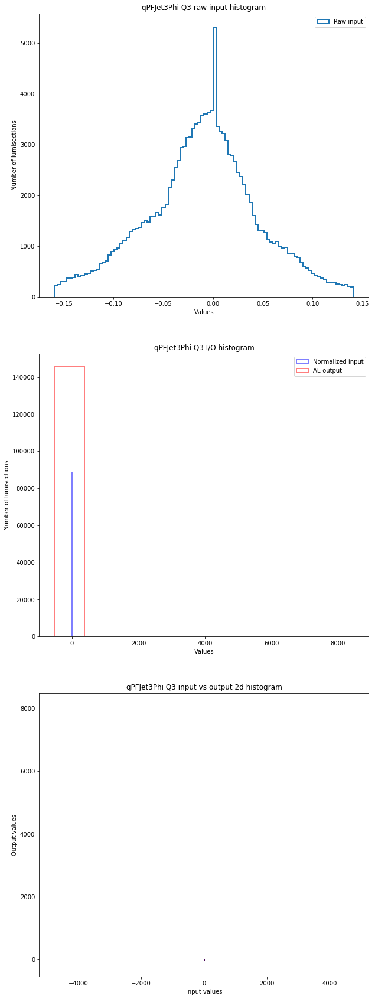

  5%|▍         | 131/2807 [19:15<6:33:22,  8.82s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/131_qPFJet3Phi_Q4


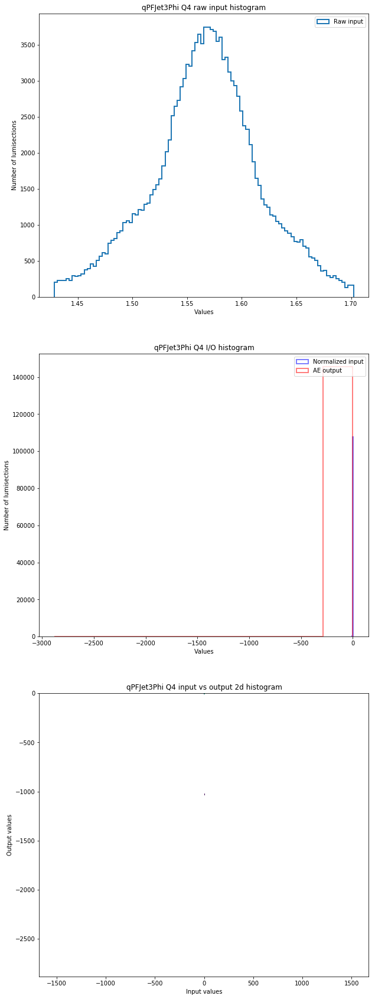

  5%|▍         | 132/2807 [19:25<6:33:43,  8.83s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/132_qPFJet3Phi_Q5


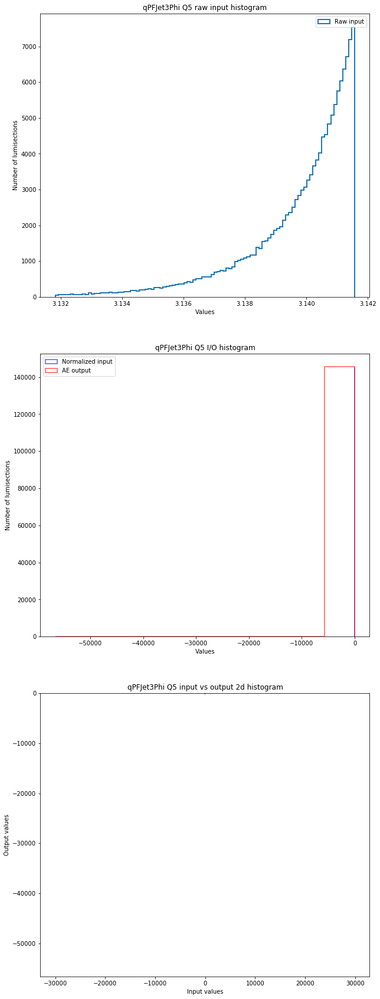

  5%|▍         | 133/2807 [19:34<6:33:41,  8.83s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/133_qPFJet4Phi_mean


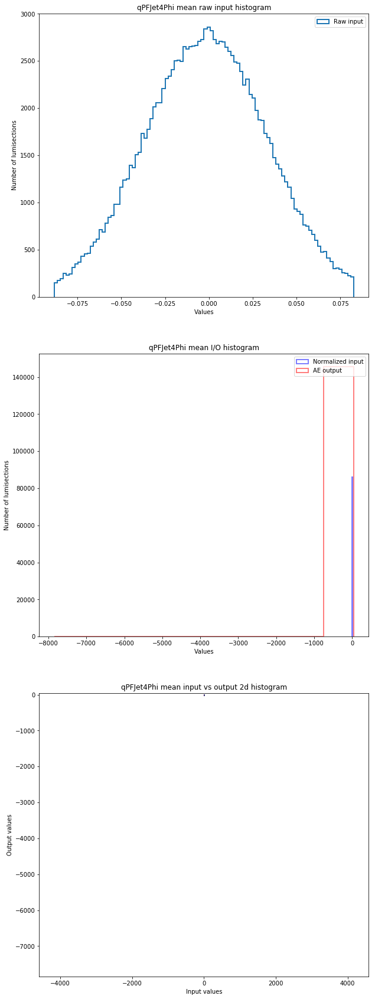

  5%|▍         | 134/2807 [19:46<6:34:26,  8.85s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/134_qPFJet4Phi_RMS


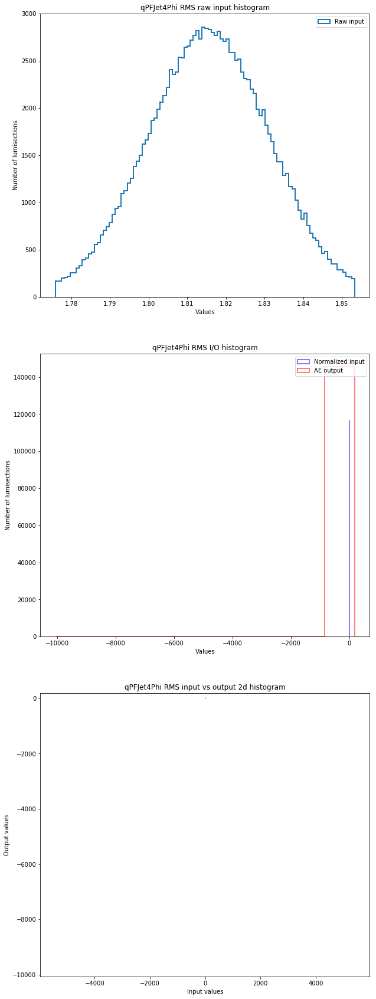

  5%|▍         | 135/2807 [19:55<6:34:31,  8.86s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/135_qPFJet4Phi_Q1


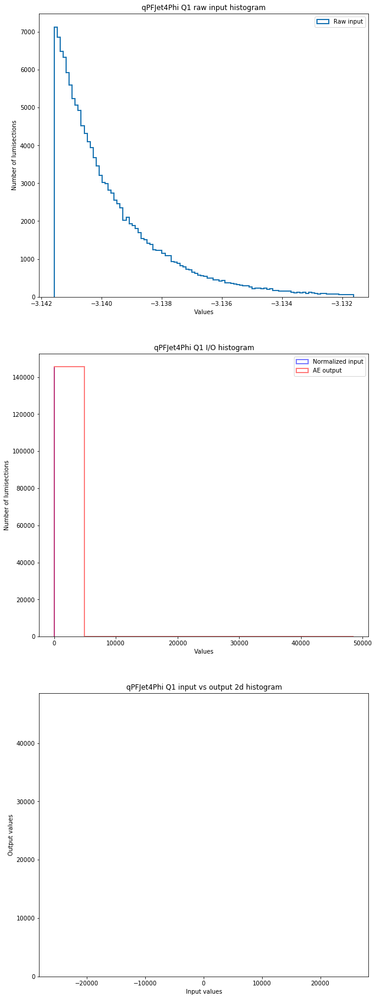

  5%|▍         | 136/2807 [20:04<6:34:18,  8.86s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/136_qPFJet4Phi_Q2


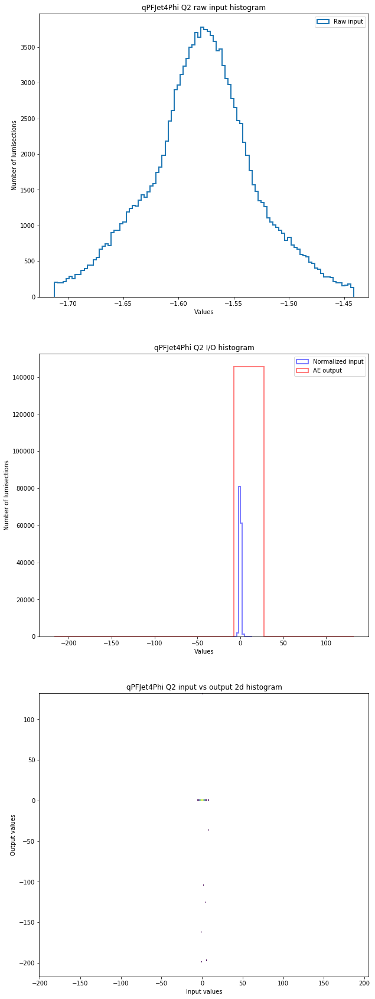

  5%|▍         | 137/2807 [20:16<6:34:59,  8.88s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/137_qPFJet4Phi_Q3


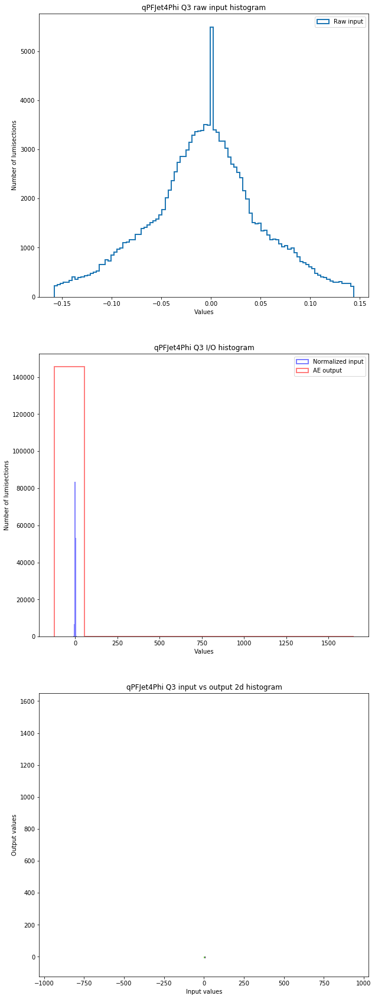

  5%|▍         | 138/2807 [20:25<6:35:09,  8.88s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/138_qPFJet4Phi_Q4


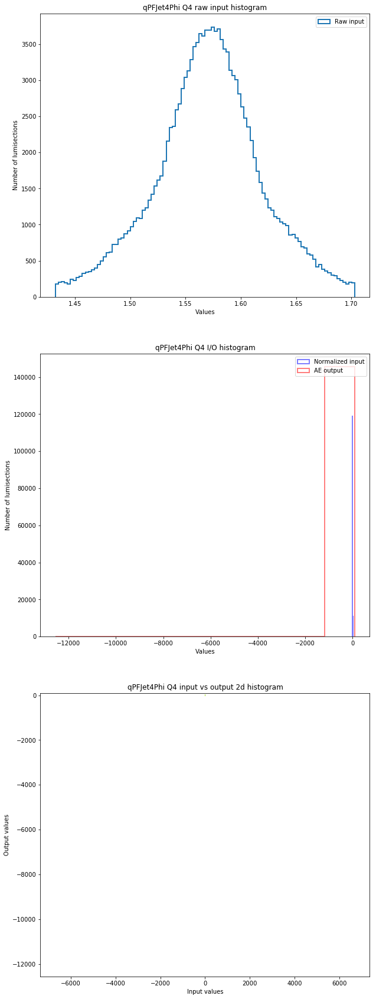

  5%|▍         | 139/2807 [20:35<6:35:20,  8.89s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/139_qPFJet4Phi_Q5


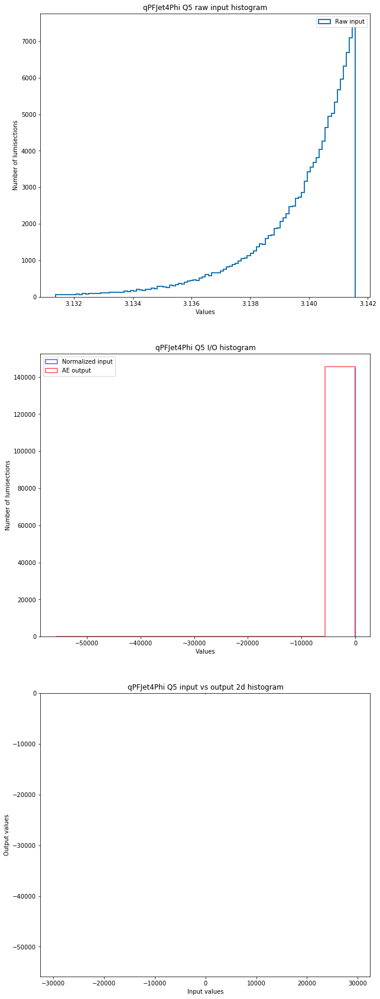

  5%|▍         | 140/2807 [20:47<6:36:07,  8.91s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/140_qPFJet5Phi_mean


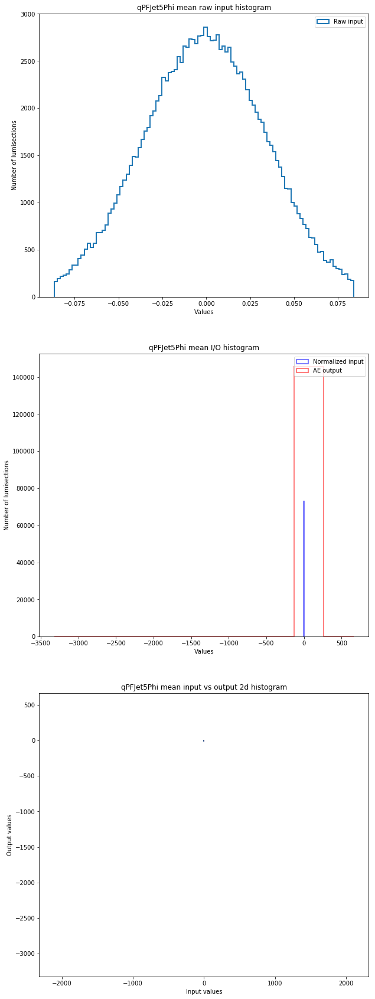

  5%|▌         | 141/2807 [20:58<6:36:30,  8.92s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/141_qPFJet5Phi_RMS


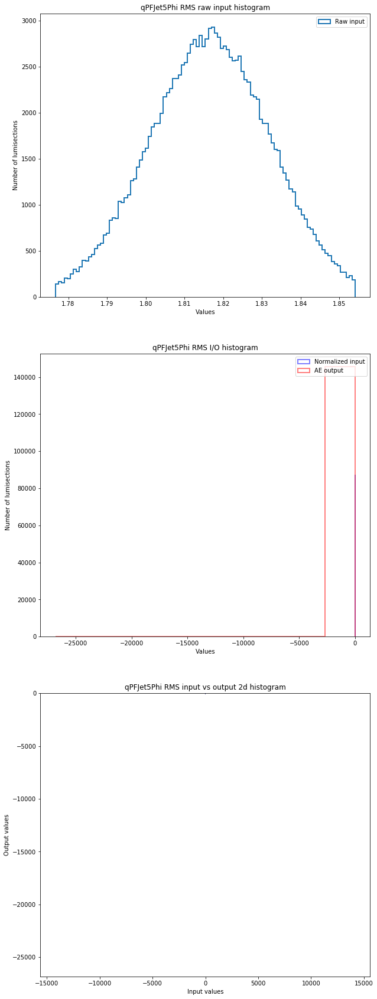

  5%|▌         | 142/2807 [21:07<6:36:25,  8.93s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/142_qPFJet5Phi_Q1


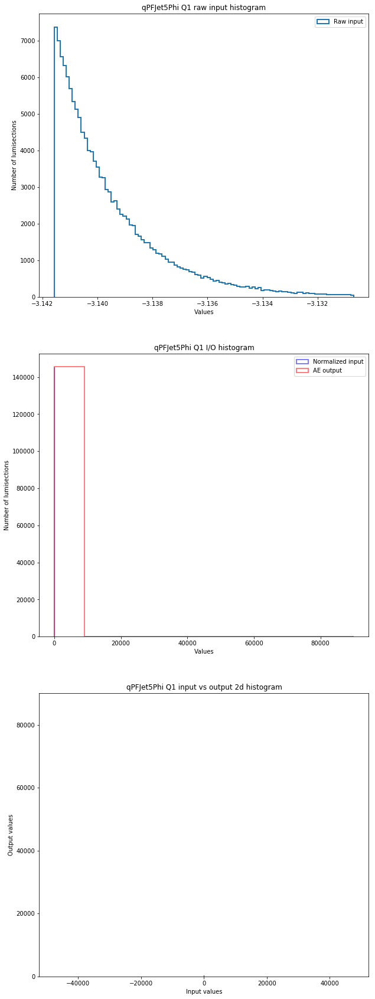

  5%|▌         | 143/2807 [21:18<6:37:04,  8.94s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/143_qPFJet5Phi_Q2


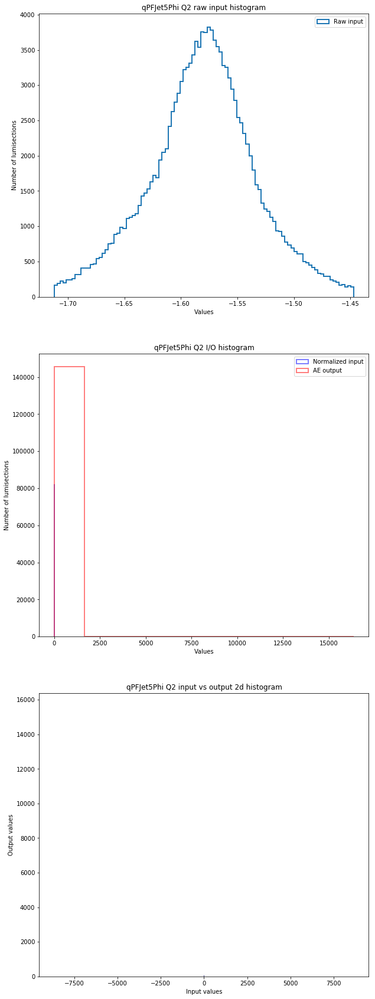

  5%|▌         | 144/2807 [21:26<6:36:40,  8.94s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/144_qPFJet5Phi_Q3


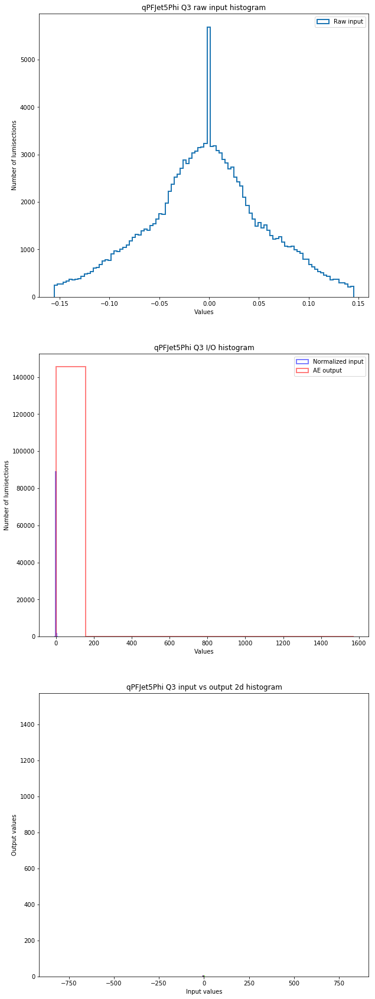

  5%|▌         | 145/2807 [21:37<6:36:51,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/145_qPFJet5Phi_Q4


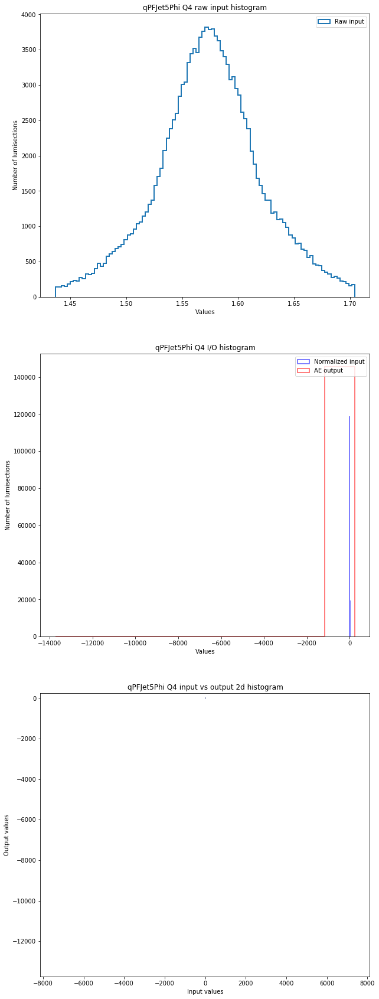

  5%|▌         | 146/2807 [21:45<6:36:39,  8.94s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/146_qPFJet5Phi_Q5


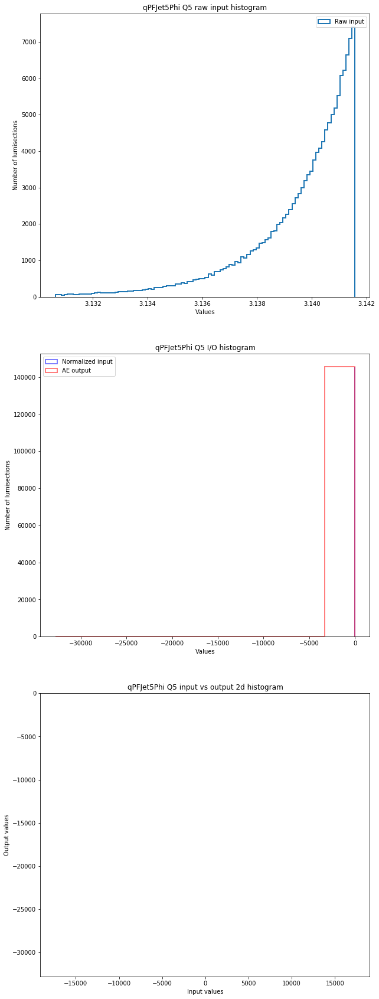

  5%|▌         | 147/2807 [21:55<6:36:43,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/147_qPFJet4CHS0Pt_mean


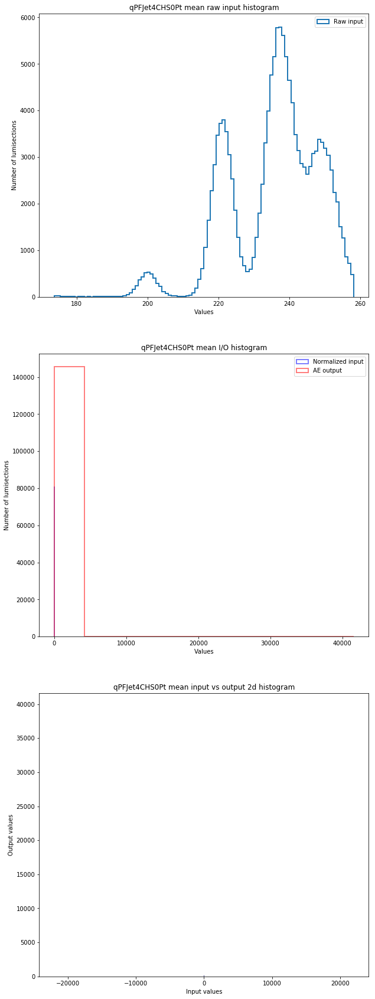

  5%|▌         | 148/2807 [22:03<6:36:17,  8.94s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/148_qPFJet4CHS0Pt_RMS


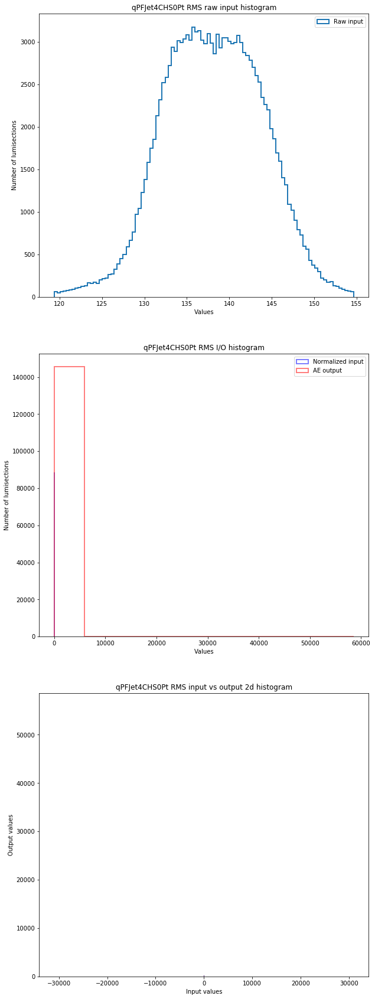

  5%|▌         | 149/2807 [22:12<6:36:17,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/149_qPFJet4CHS0Pt_Q1


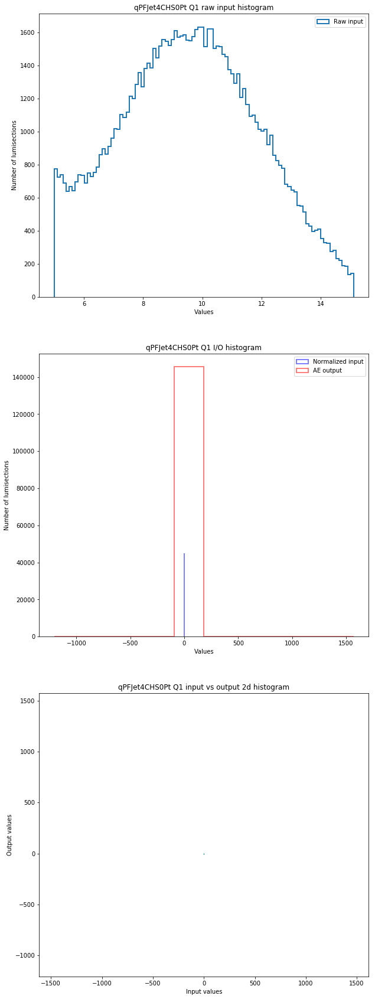

  5%|▌         | 150/2807 [22:21<6:36:06,  8.94s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/150_qPFJet4CHS0Pt_Q2


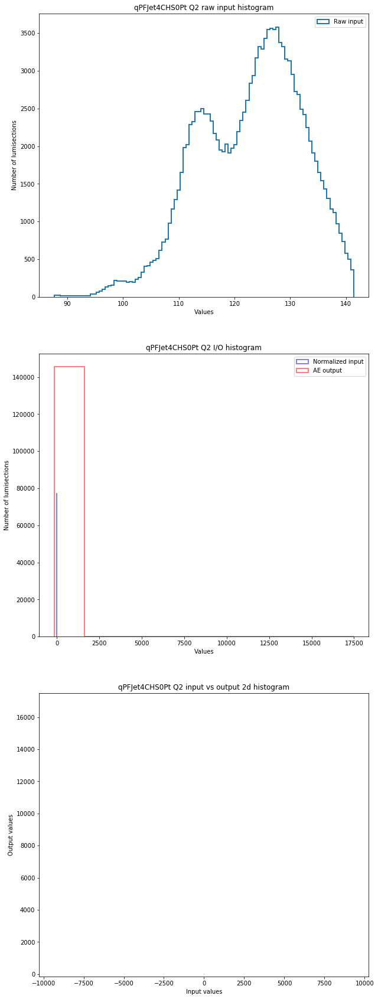

  5%|▌         | 151/2807 [22:31<6:36:16,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/151_qPFJet4CHS0Pt_Q3


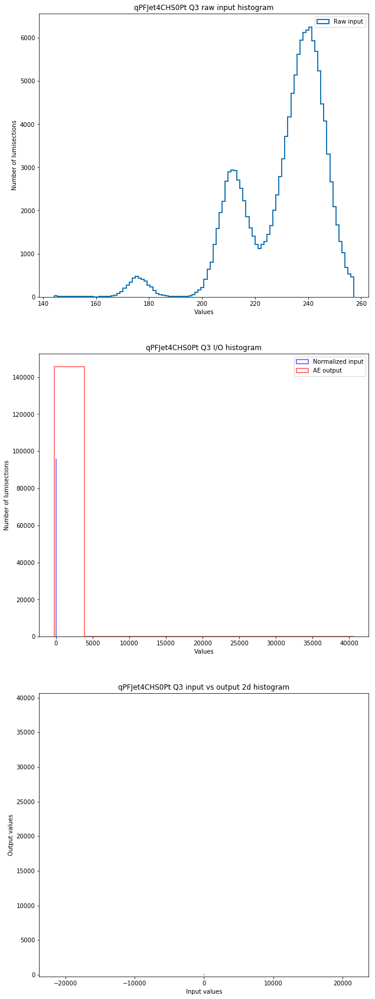

  5%|▌         | 152/2807 [22:41<6:36:15,  8.96s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/152_qPFJet4CHS0Pt_Q4


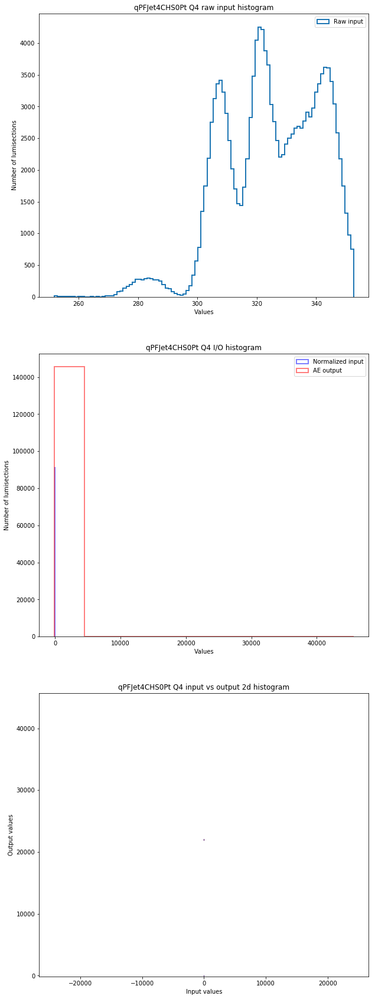

  5%|▌         | 153/2807 [22:49<6:35:57,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/153_qPFJet4CHS0Pt_Q5


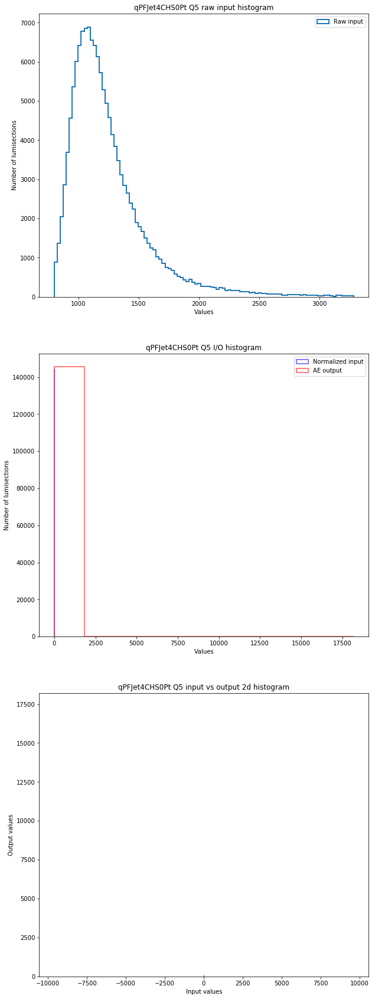

  5%|▌         | 154/2807 [22:58<6:35:51,  8.95s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/154_qPFJet4CHS1Pt_mean


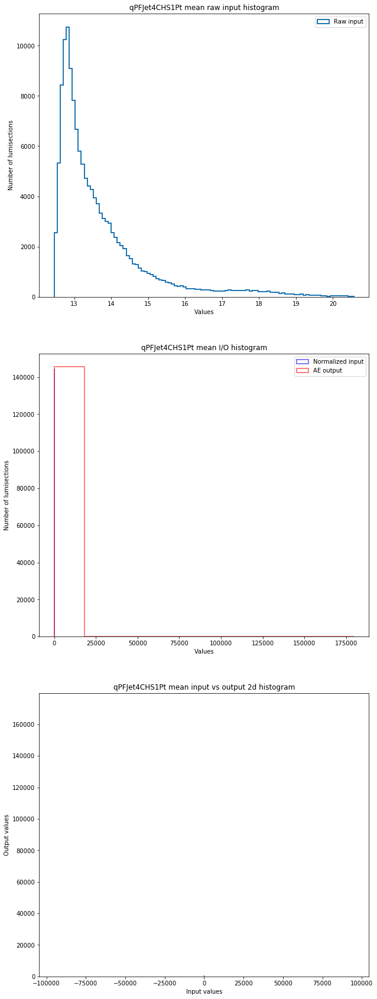

  6%|▌         | 155/2807 [23:08<6:36:04,  8.96s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/155_qPFJet4CHS1Pt_RMS


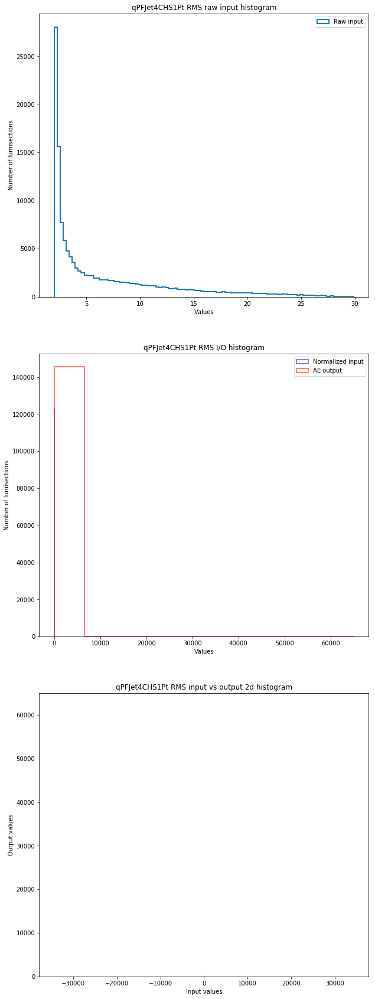

  6%|▌         | 156/2807 [23:17<6:35:43,  8.96s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/156_qPFJet4CHS1Pt_Q1


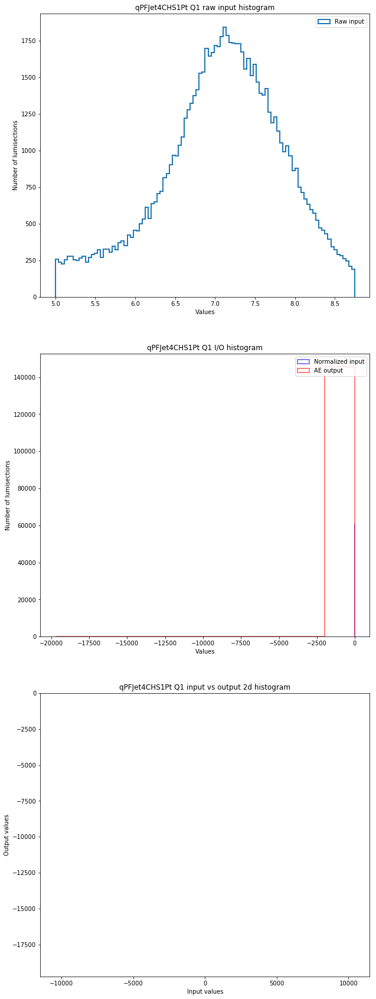

  6%|▌         | 157/2807 [23:26<6:35:44,  8.96s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/157_qPFJet4CHS1Pt_Q2


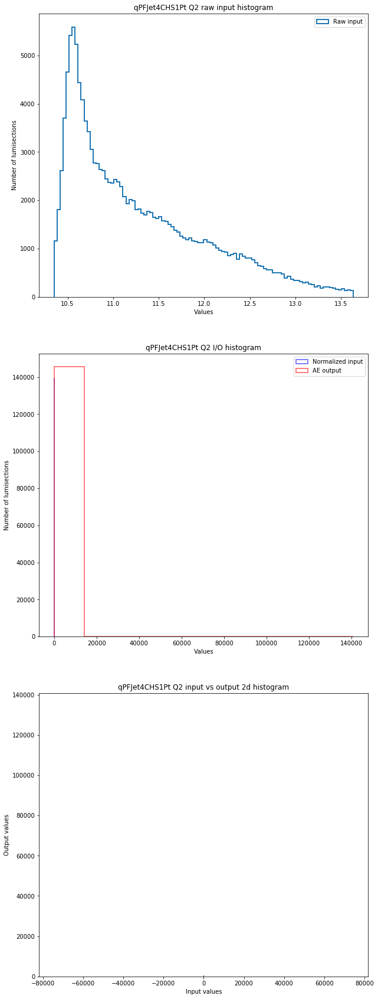

  6%|▌         | 158/2807 [23:36<6:35:48,  8.96s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/158_qPFJet4CHS1Pt_Q3


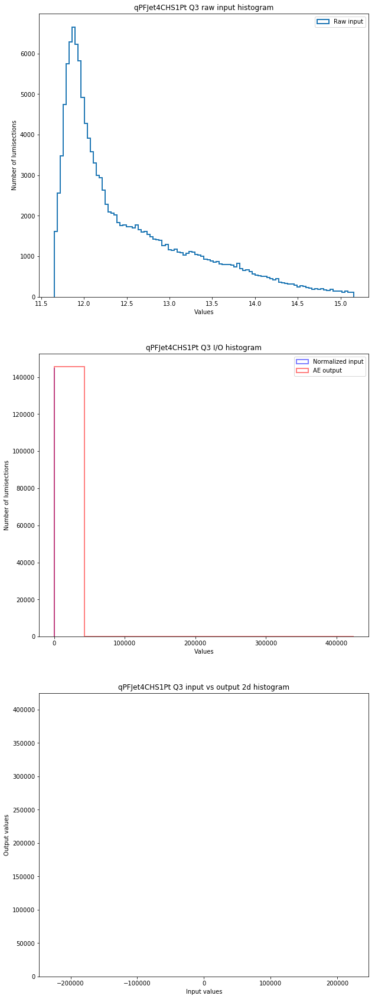

  6%|▌         | 159/2807 [23:45<6:35:44,  8.97s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/159_qPFJet4CHS1Pt_Q4


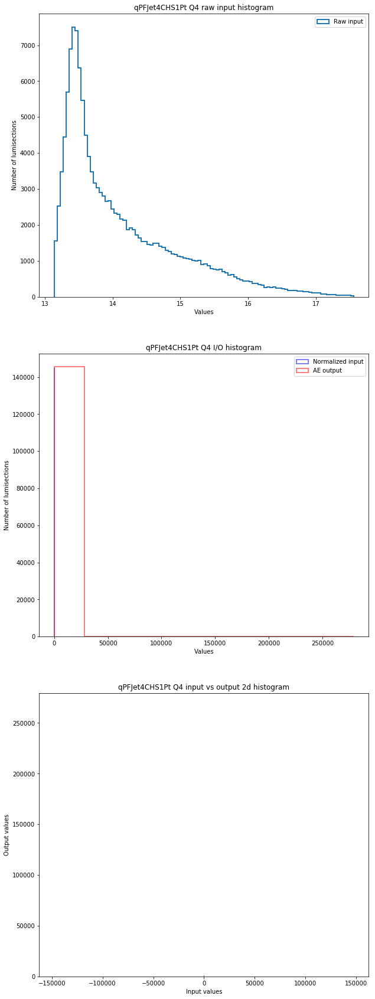

  6%|▌         | 160/2807 [23:55<6:35:41,  8.97s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/160_qPFJet4CHS1Pt_Q5


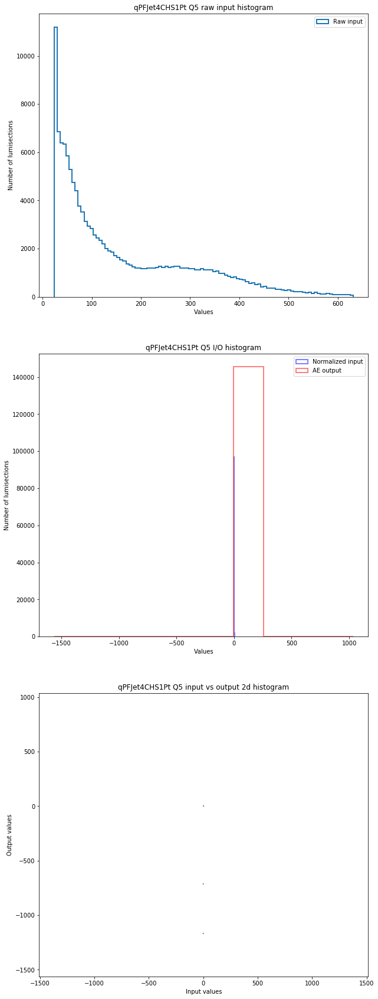

  6%|▌         | 161/2807 [24:03<6:35:28,  8.97s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/161_qPFJet4CHS2Pt_mean


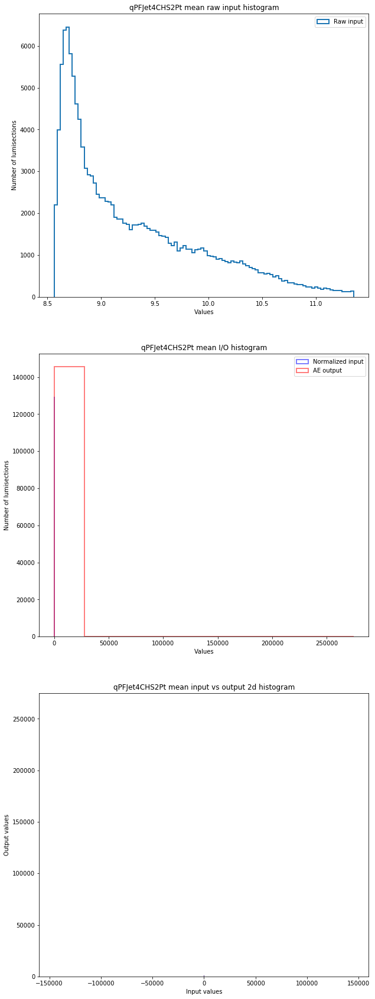

  6%|▌         | 162/2807 [24:13<6:35:28,  8.97s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/162_qPFJet4CHS2Pt_RMS


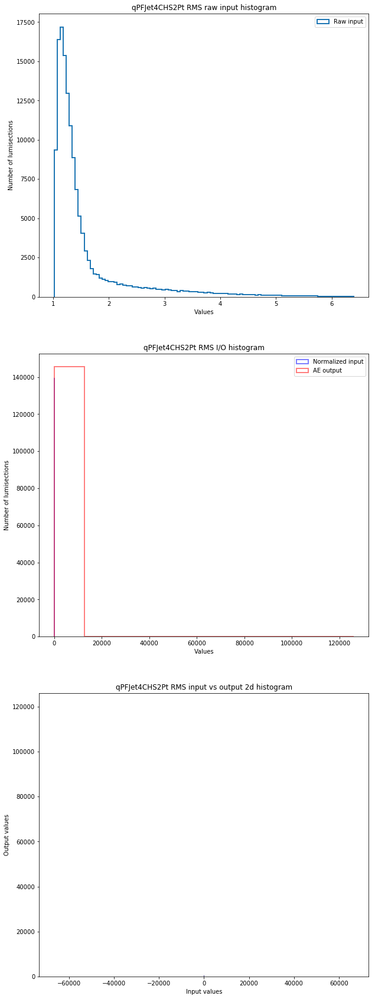

  6%|▌         | 163/2807 [24:23<6:35:44,  8.98s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/163_qPFJet4CHS2Pt_Q1


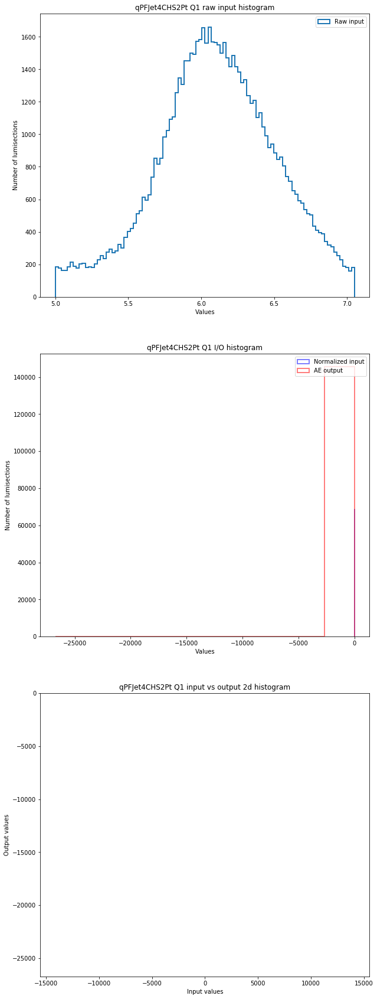

  6%|▌         | 164/2807 [24:32<6:35:37,  8.98s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/164_qPFJet4CHS2Pt_Q2


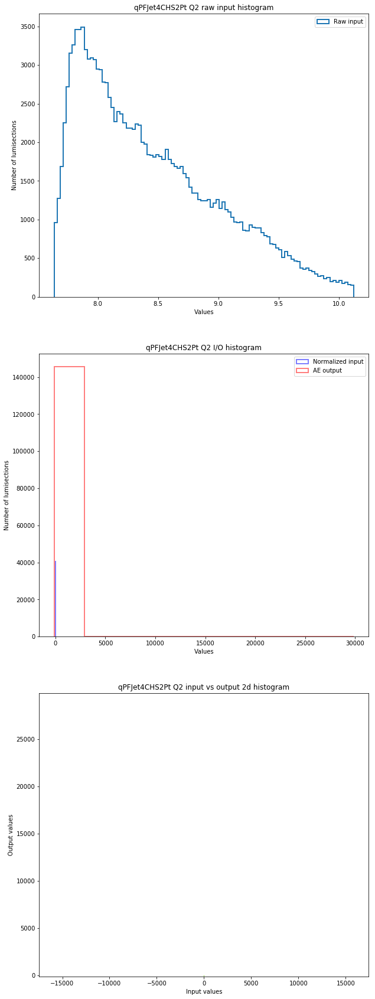

  6%|▌         | 165/2807 [24:42<6:35:42,  8.99s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/165_qPFJet4CHS2Pt_Q3


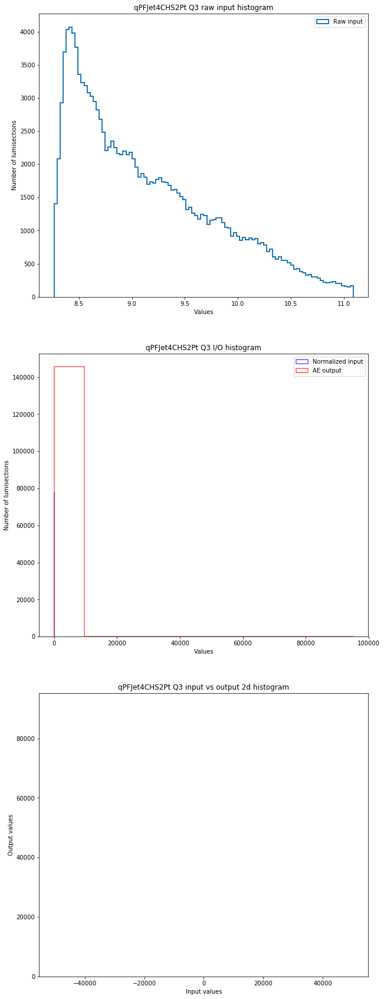

  6%|▌         | 166/2807 [24:52<6:35:46,  8.99s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/166_qPFJet4CHS2Pt_Q4


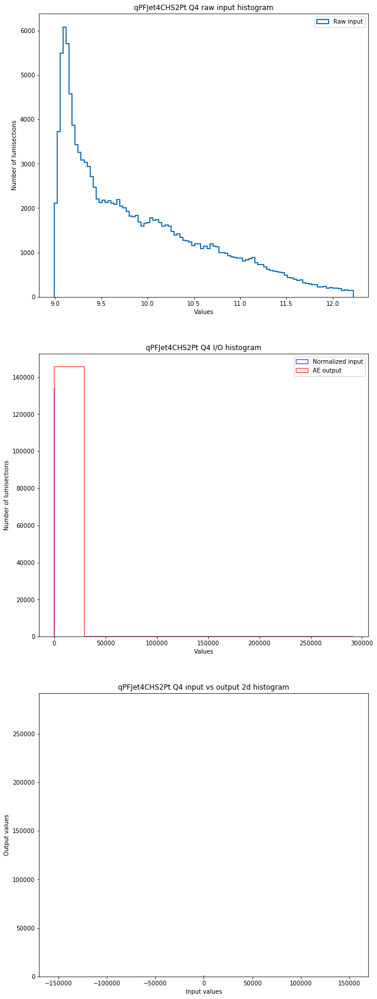

  6%|▌         | 167/2807 [25:02<6:35:45,  8.99s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/167_qPFJet4CHS2Pt_Q5


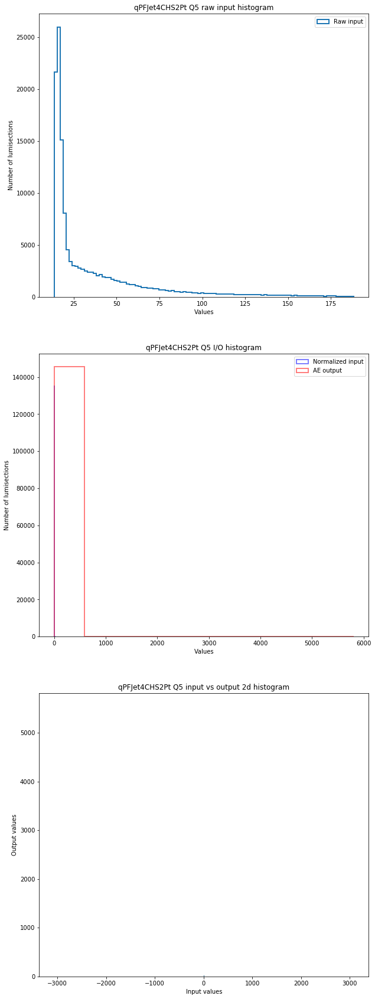

  6%|▌         | 168/2807 [25:12<6:35:58,  9.00s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/168_qPFJet4CHS3Pt_mean


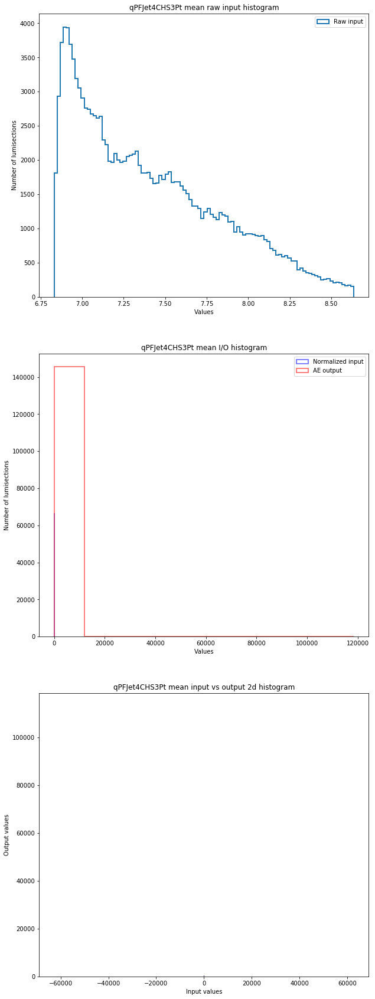

  6%|▌         | 169/2807 [25:21<6:35:49,  9.00s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/169_qPFJet4CHS3Pt_RMS


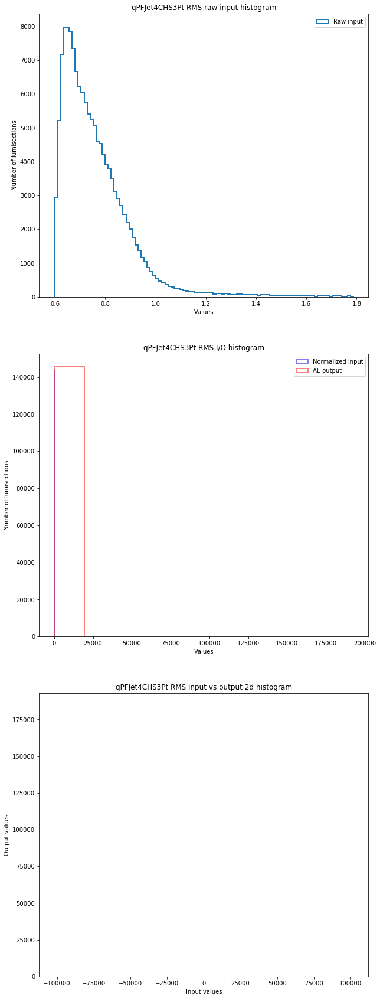

  6%|▌         | 170/2807 [25:31<6:35:57,  9.01s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/170_qPFJet4CHS3Pt_Q1


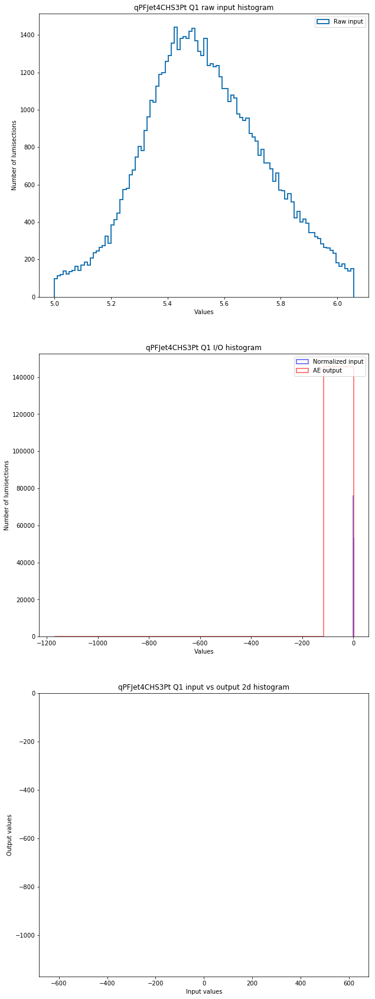

  6%|▌         | 171/2807 [25:40<6:35:50,  9.01s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/171_qPFJet4CHS3Pt_Q2


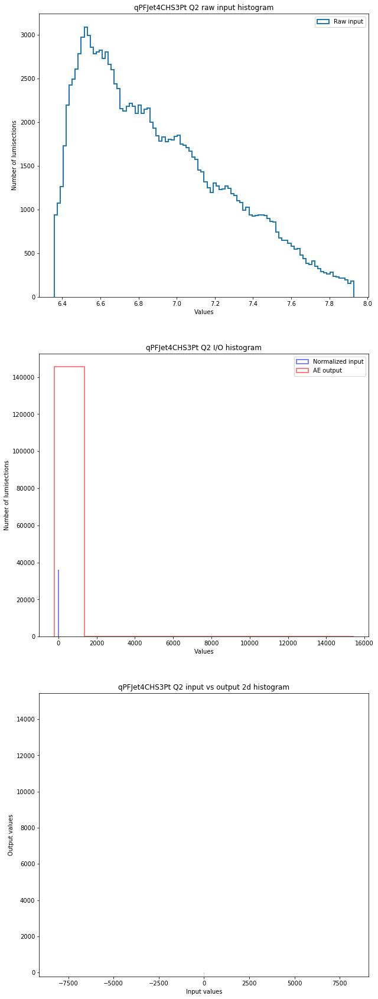

  6%|▌         | 172/2807 [25:51<6:36:04,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/172_qPFJet4CHS3Pt_Q3


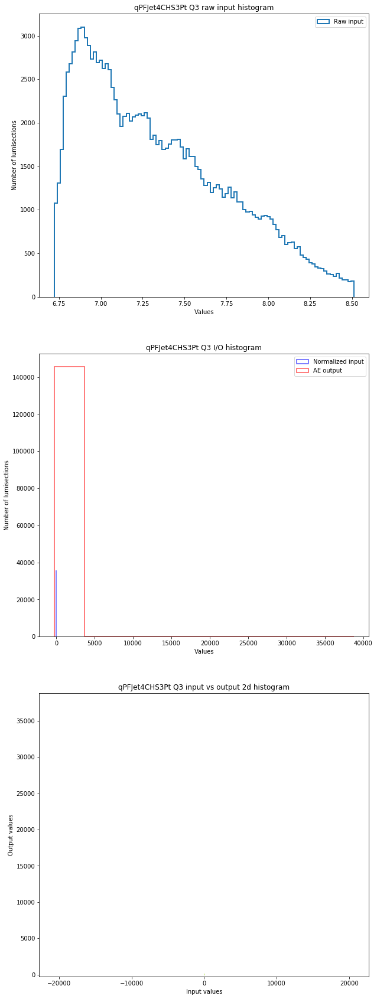

  6%|▌         | 173/2807 [26:00<6:36:04,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/173_qPFJet4CHS3Pt_Q4


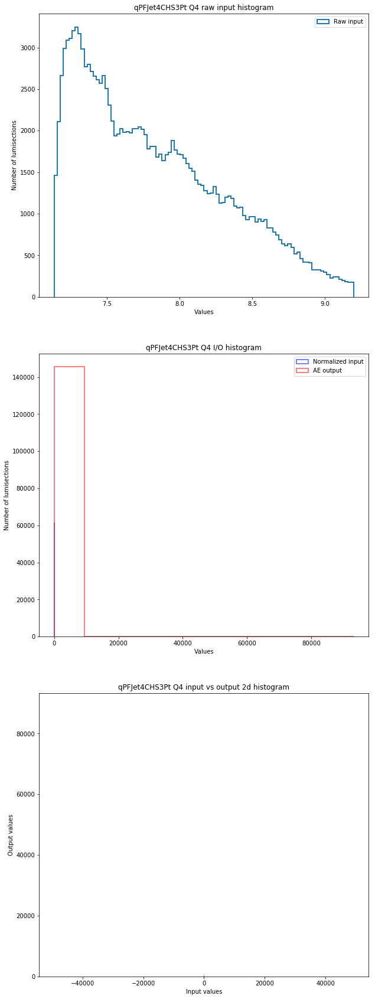

  6%|▌         | 174/2807 [26:09<6:35:54,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/174_qPFJet4CHS3Pt_Q5


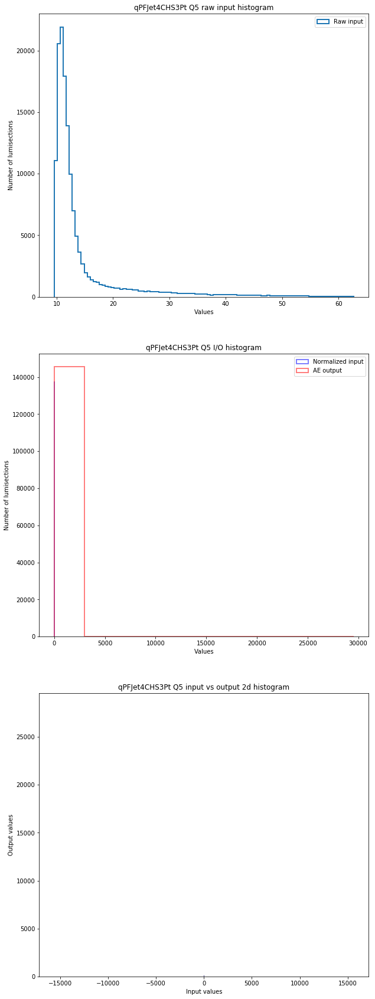

  6%|▌         | 175/2807 [26:19<6:35:51,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/175_qPFJet4CHS4Pt_mean


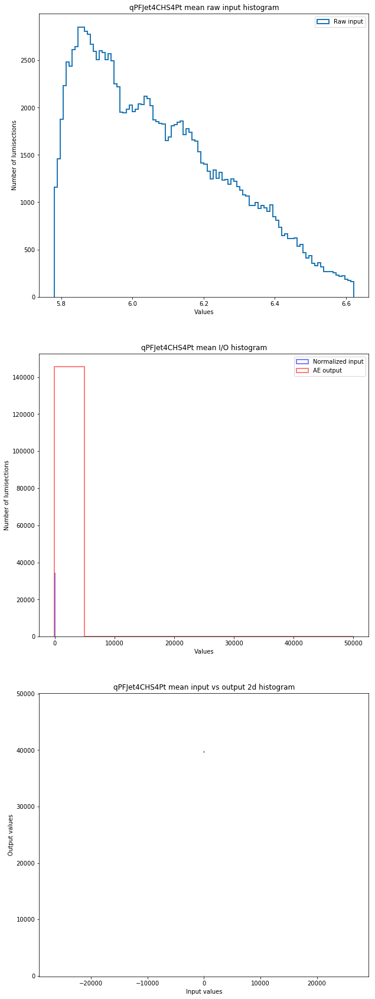

  6%|▋         | 176/2807 [26:29<6:35:59,  9.03s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/176_qPFJet4CHS4Pt_RMS


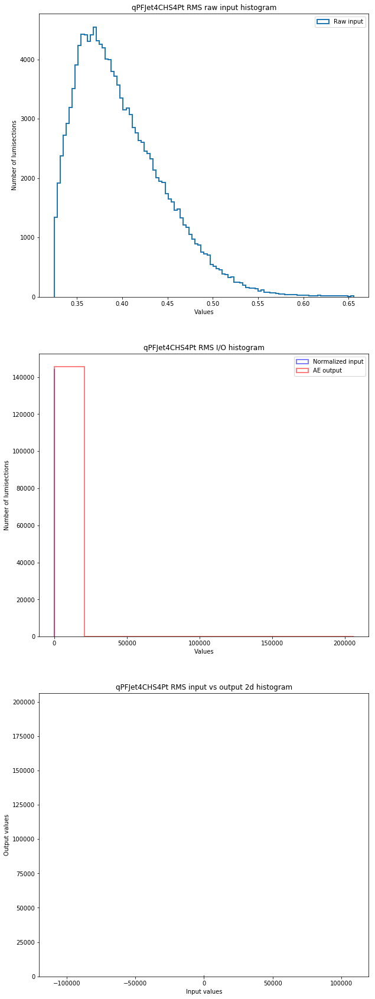

  6%|▋         | 177/2807 [26:37<6:35:38,  9.03s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/177_qPFJet4CHS4Pt_Q1


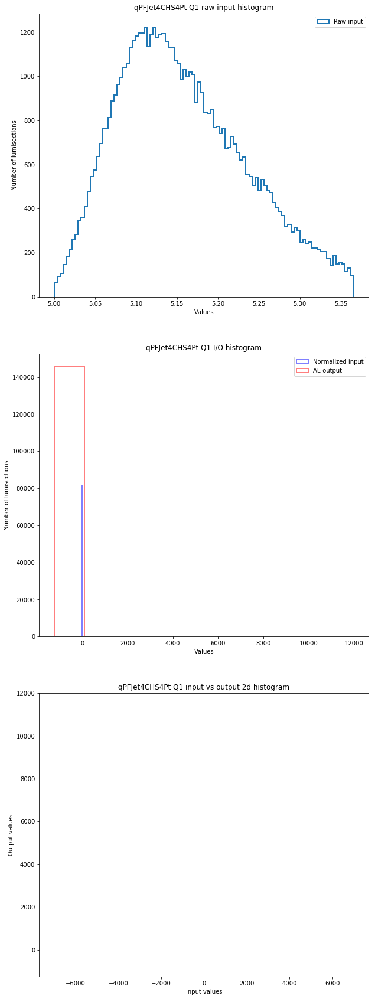

  6%|▋         | 178/2807 [26:47<6:35:41,  9.03s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/178_qPFJet4CHS4Pt_Q2


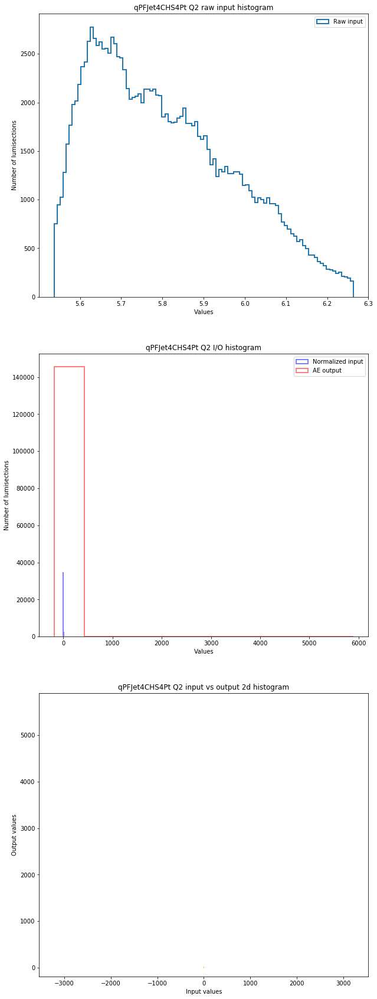

  6%|▋         | 179/2807 [26:54<6:35:09,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/179_qPFJet4CHS4Pt_Q3


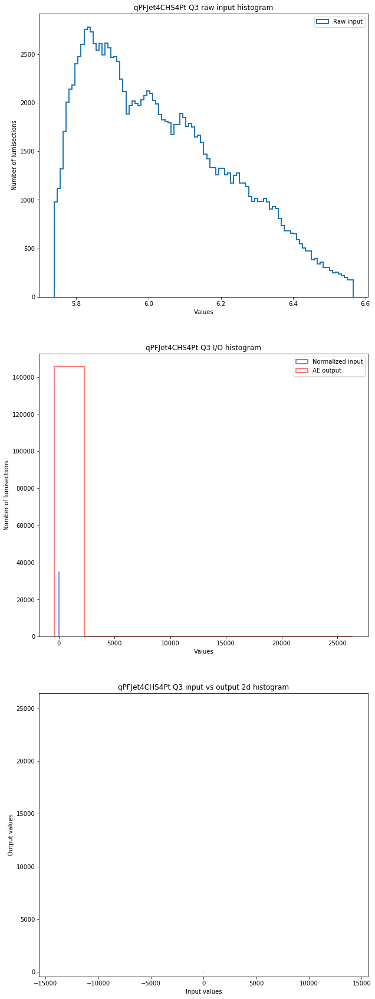

  6%|▋         | 180/2807 [27:03<6:34:48,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/180_qPFJet4CHS4Pt_Q4


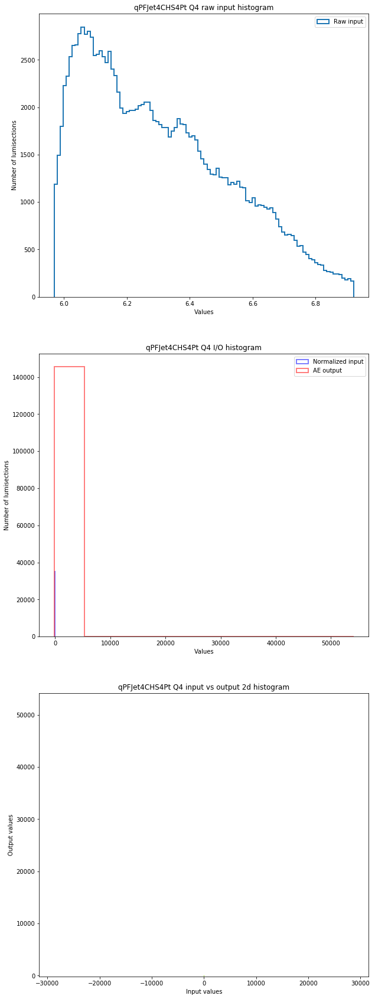

  6%|▋         | 181/2807 [27:12<6:34:49,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/181_qPFJet4CHS4Pt_Q5


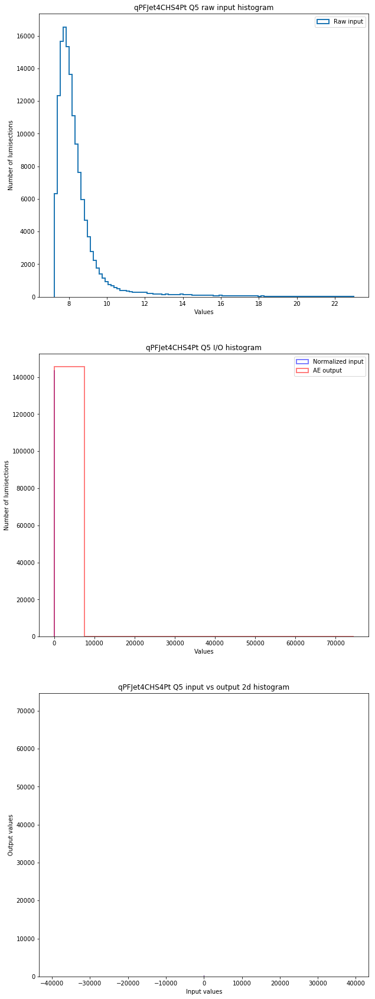

  6%|▋         | 182/2807 [27:21<6:34:39,  9.02s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/182_qPFJet4CHS5Pt_mean


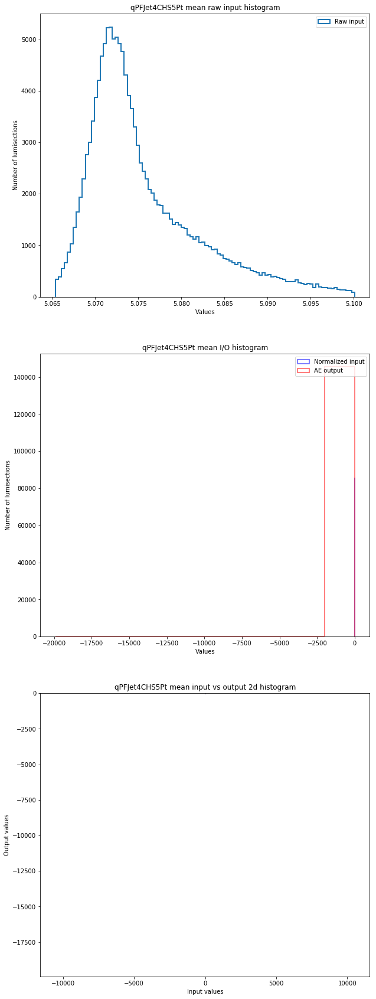

  7%|▋         | 183/2807 [27:31<6:34:42,  9.03s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/183_qPFJet4CHS5Pt_RMS


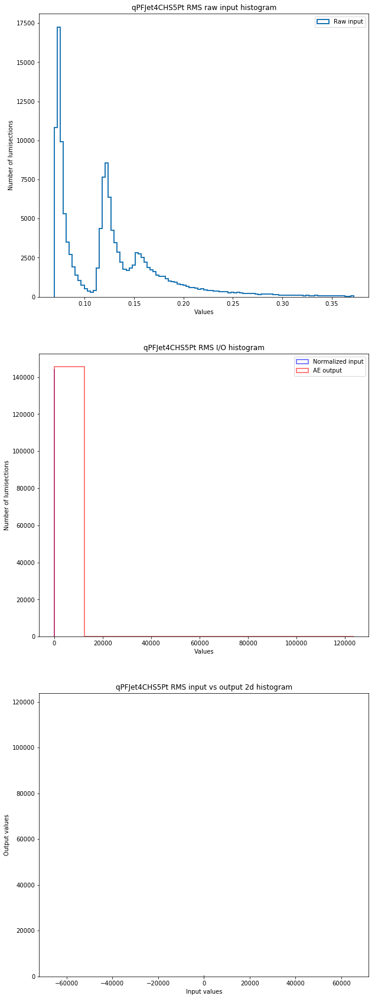

  7%|▋         | 184/2807 [27:40<6:34:33,  9.03s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/184_qPFJet4CHS5Pt_Q1


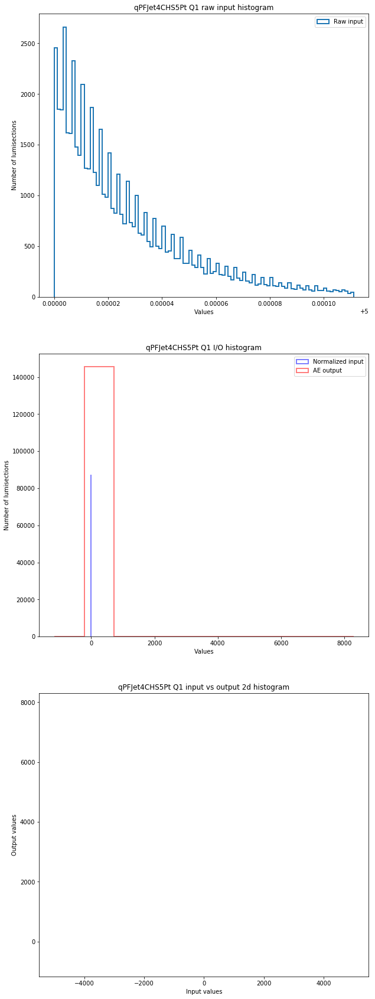

  7%|▋         | 185/2807 [27:51<6:34:50,  9.04s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/185_qPFJet4CHS5Pt_Q2


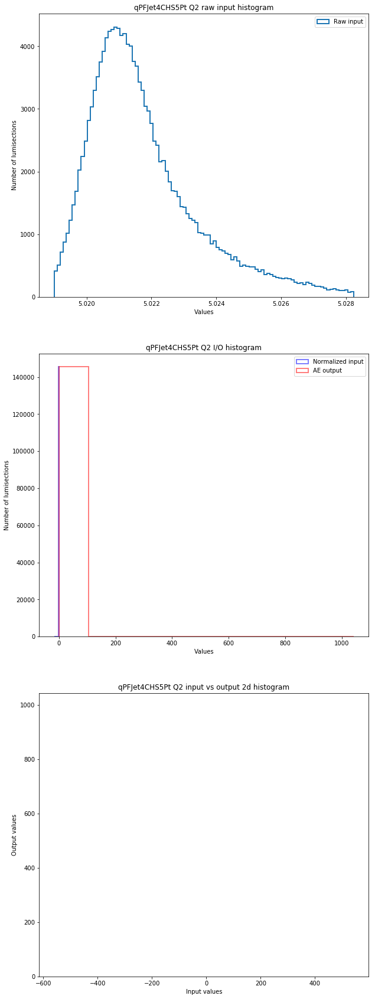

  7%|▋         | 186/2807 [28:00<6:34:44,  9.04s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/186_qPFJet4CHS5Pt_Q3


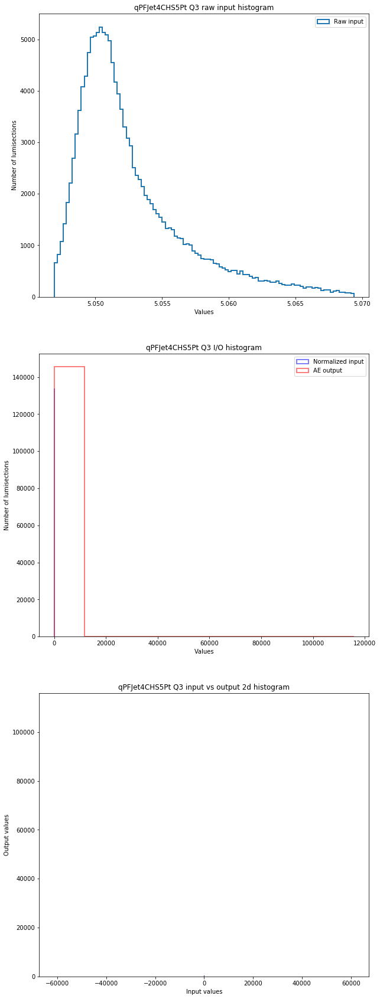

  7%|▋         | 187/2807 [28:09<6:34:30,  9.03s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/187_qPFJet4CHS5Pt_Q4


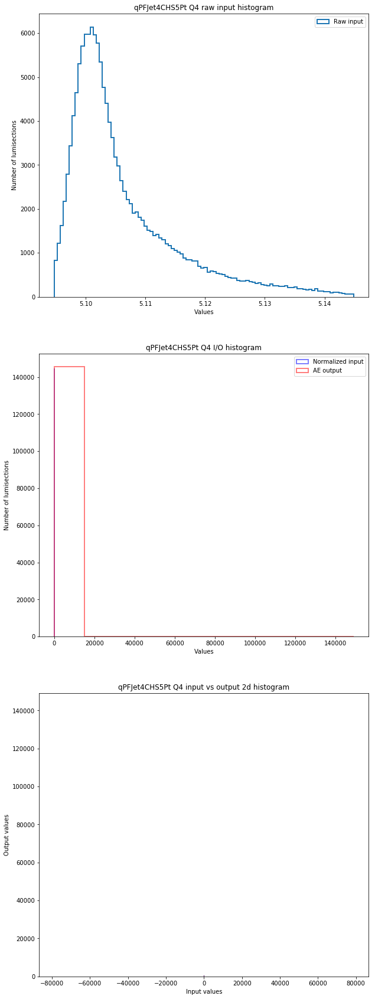

  7%|▋         | 188/2807 [28:19<6:34:42,  9.04s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/188_qPFJet4CHS5Pt_Q5


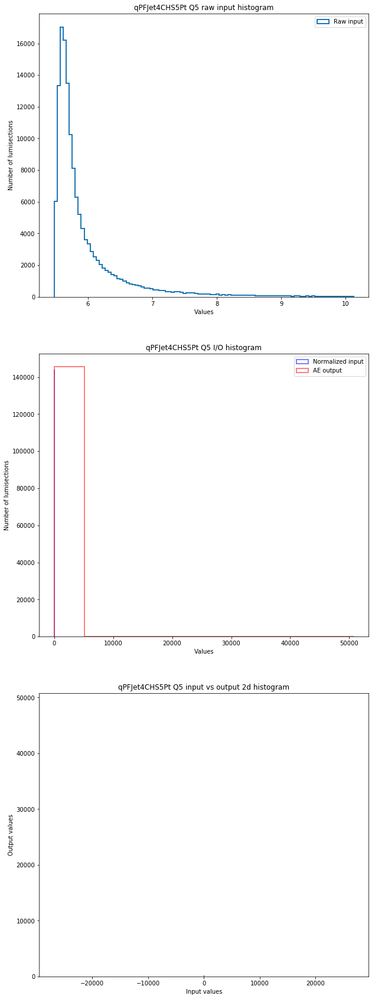

  7%|▋         | 189/2807 [28:29<6:34:39,  9.05s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/189_qPFJet4CHS0Eta_mean


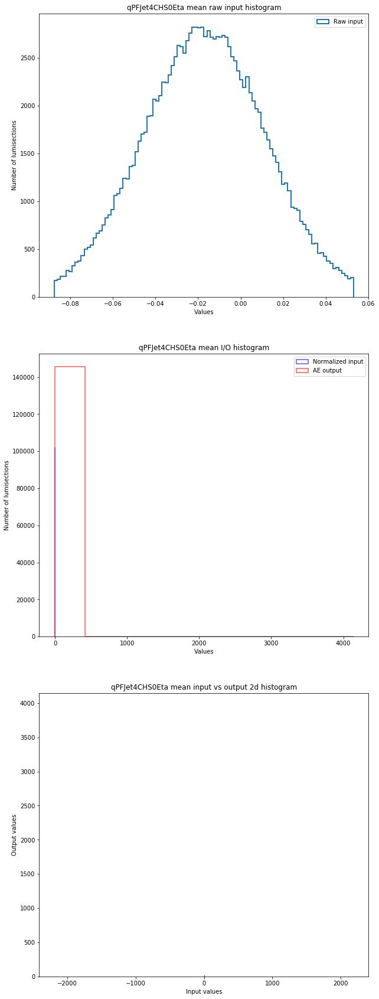

  7%|▋         | 190/2807 [28:38<6:34:30,  9.04s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/190_qPFJet4CHS0Eta_RMS


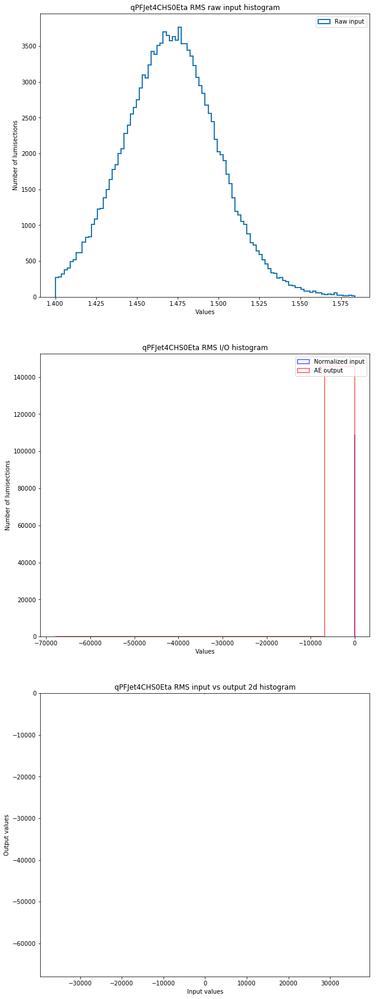

  7%|▋         | 191/2807 [28:49<6:34:42,  9.05s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/191_qPFJet4CHS0Eta_Q1


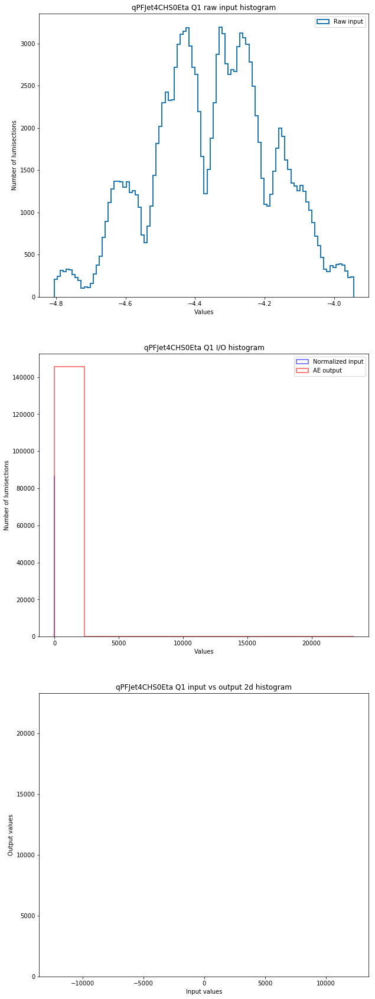

  7%|▋         | 192/2807 [28:58<6:34:41,  9.06s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/192_qPFJet4CHS0Eta_Q2


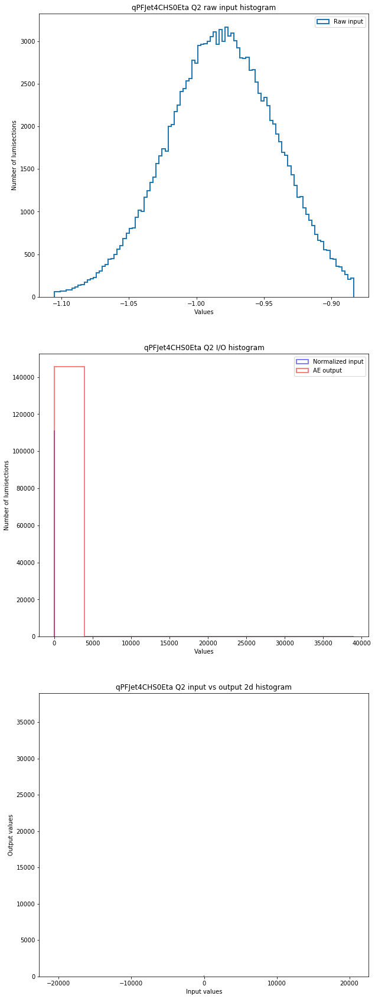

  7%|▋         | 193/2807 [29:07<6:34:31,  9.06s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/193_qPFJet4CHS0Eta_Q3


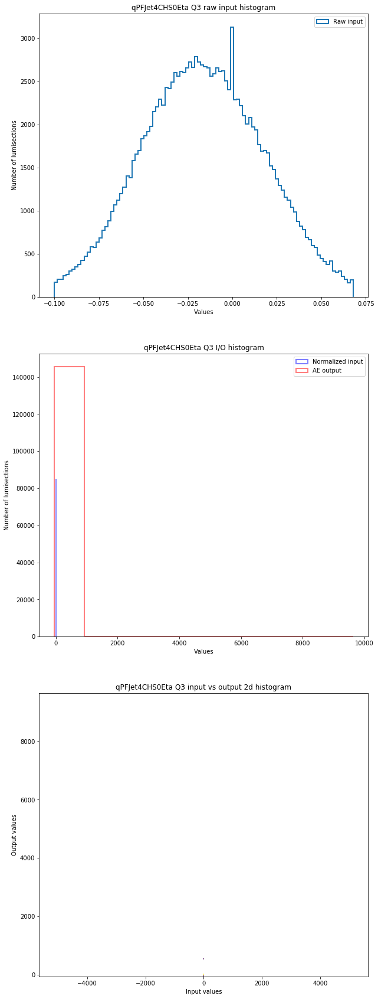

  7%|▋         | 194/2807 [29:17<6:34:32,  9.06s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/194_qPFJet4CHS0Eta_Q4


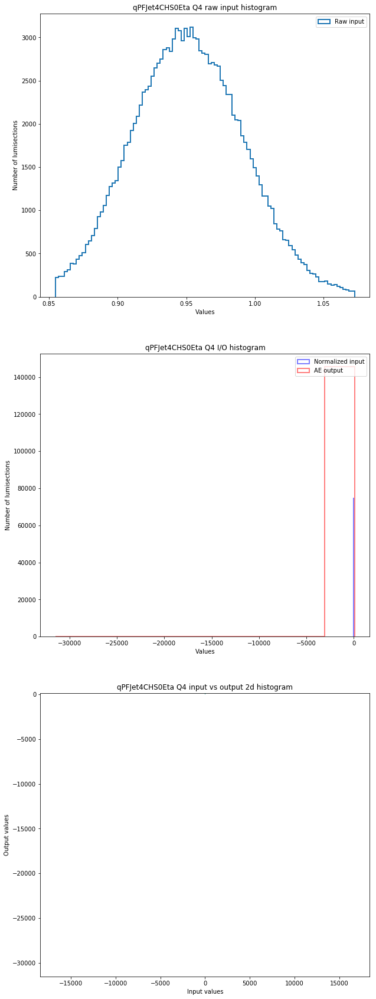

  7%|▋         | 195/2807 [29:27<6:34:37,  9.06s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/195_qPFJet4CHS0Eta_Q5


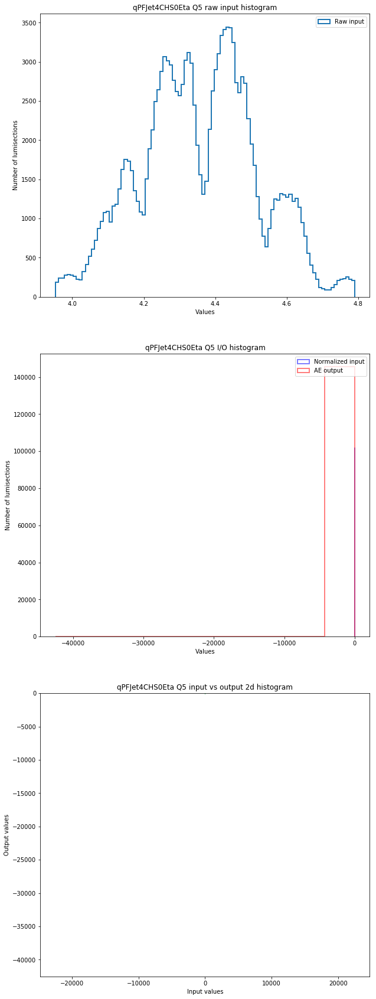

  7%|▋         | 196/2807 [29:37<6:34:38,  9.07s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/196_qPFJet4CHS1Eta_mean


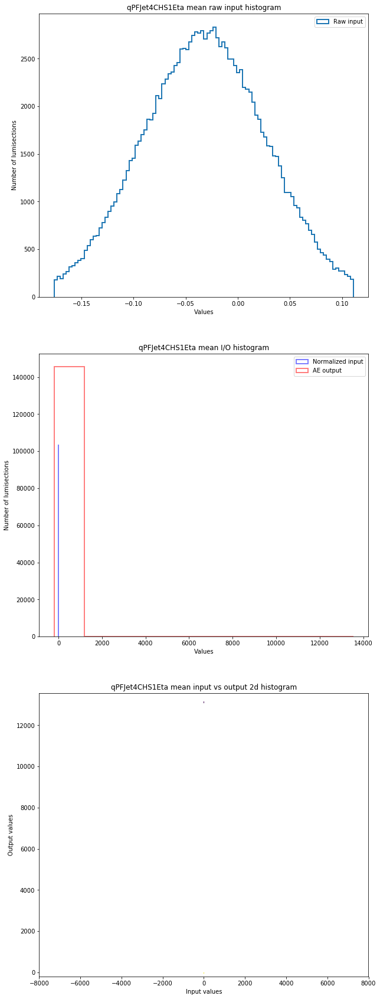

  7%|▋         | 197/2807 [29:46<6:34:34,  9.07s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/197_qPFJet4CHS1Eta_RMS


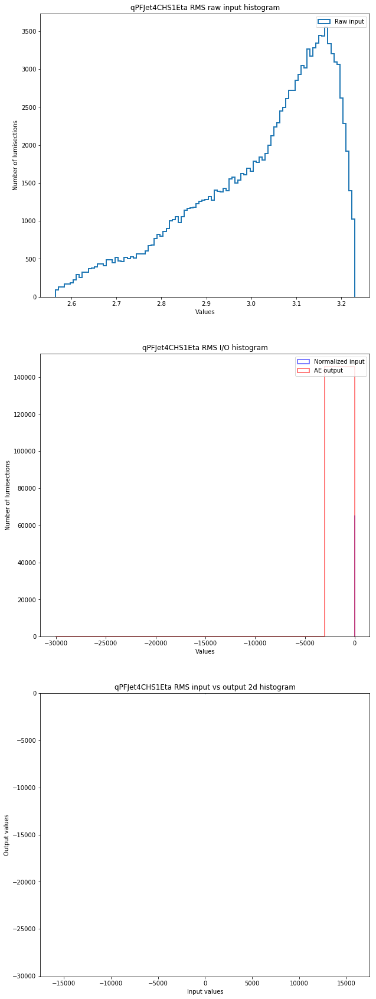

  7%|▋         | 198/2807 [29:56<6:34:26,  9.07s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/198_qPFJet4CHS1Eta_Q1


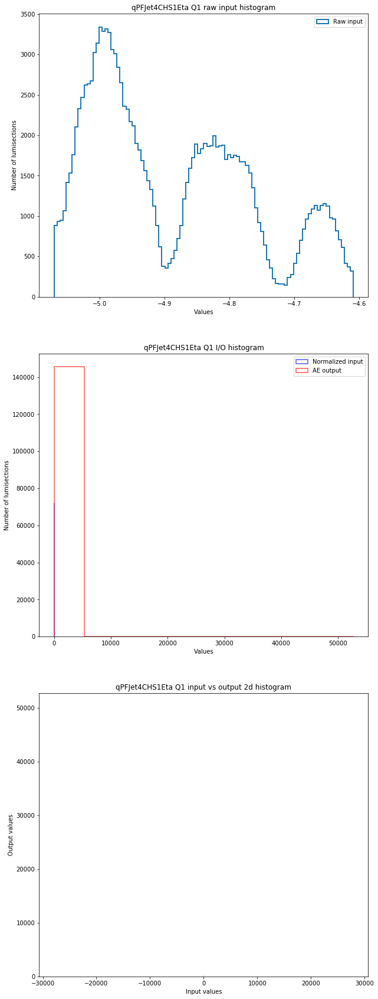

  7%|▋         | 199/2807 [30:06<6:34:32,  9.08s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/199_qPFJet4CHS1Eta_Q2


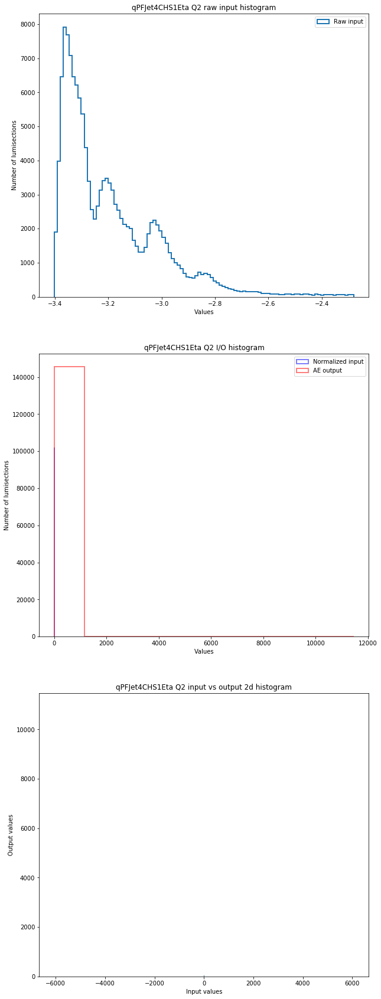

  7%|▋         | 200/2807 [30:15<6:34:28,  9.08s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/200_qPFJet4CHS1Eta_Q3


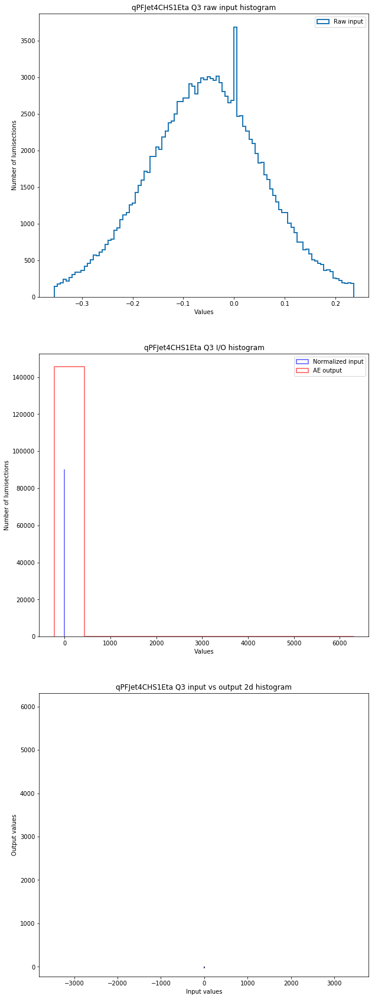

  7%|▋         | 201/2807 [30:24<6:34:18,  9.08s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/201_qPFJet4CHS1Eta_Q4


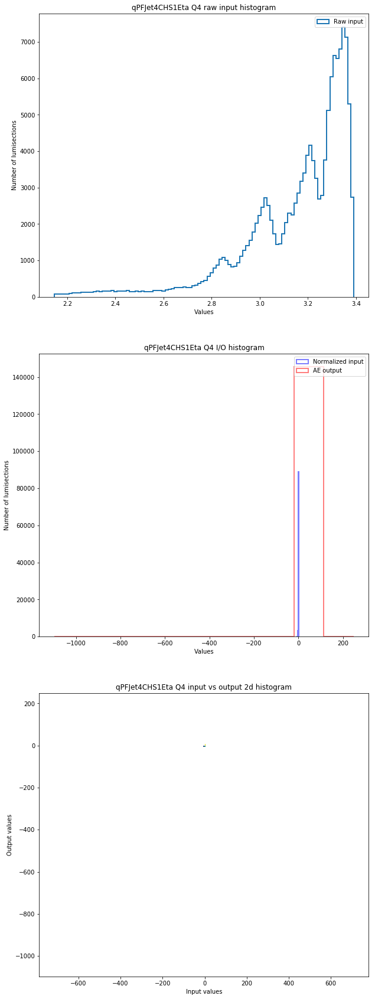

  7%|▋         | 202/2807 [30:35<6:34:26,  9.08s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/202_qPFJet4CHS1Eta_Q5


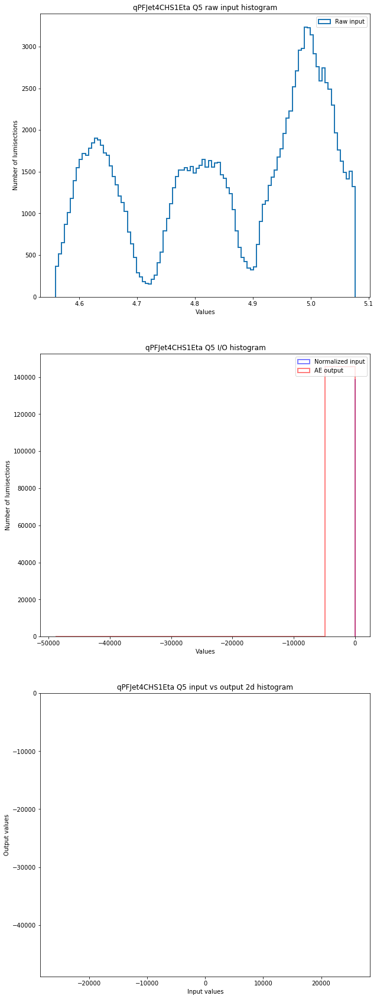

  7%|▋         | 203/2807 [30:45<6:34:31,  9.09s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/203_qPFJet4CHS2Eta_mean


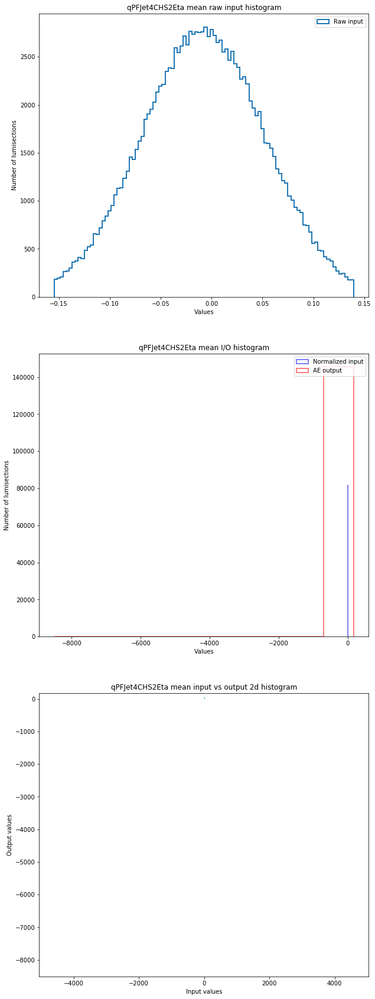

  7%|▋         | 204/2807 [30:54<6:34:20,  9.09s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/204_qPFJet4CHS2Eta_RMS


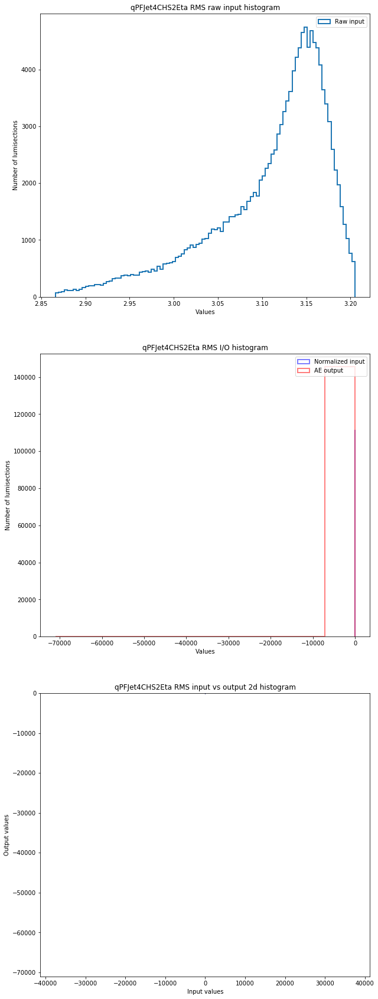

  7%|▋         | 205/2807 [31:04<6:34:19,  9.09s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/205_qPFJet4CHS2Eta_Q1


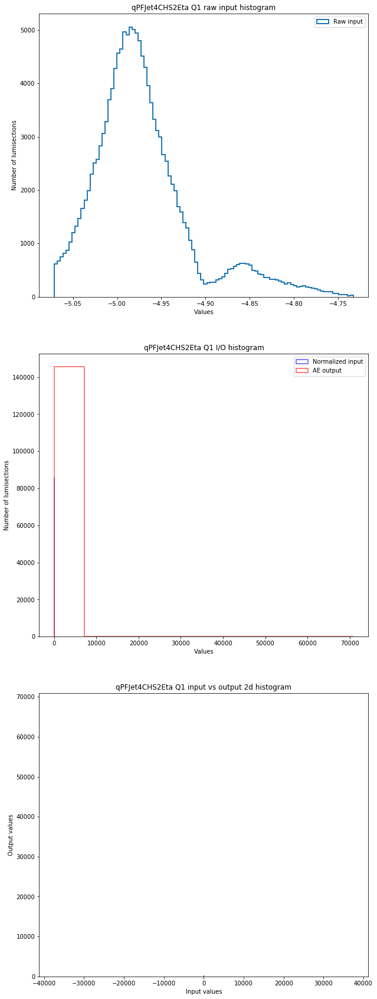

  7%|▋         | 206/2807 [31:14<6:34:31,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/206_qPFJet4CHS2Eta_Q2


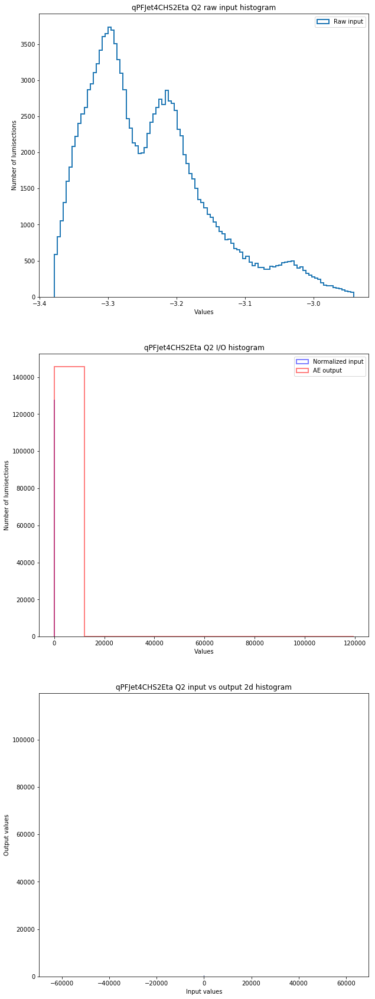

  7%|▋         | 207/2807 [31:23<6:34:17,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/207_qPFJet4CHS2Eta_Q3


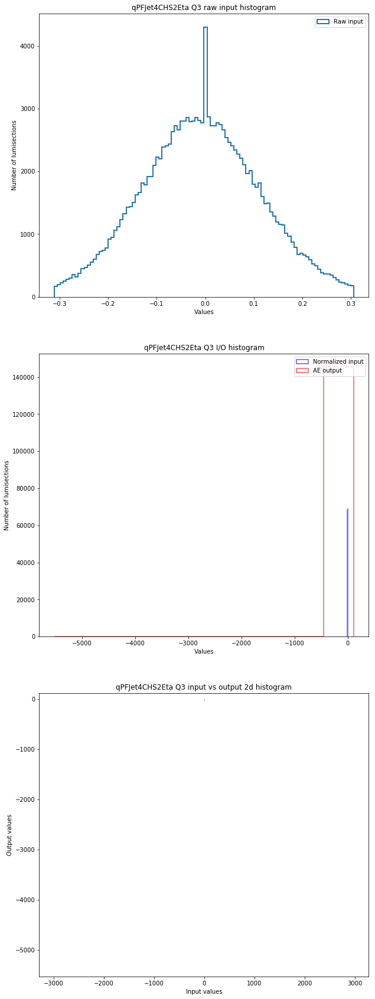

  7%|▋         | 208/2807 [31:32<6:34:05,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/208_qPFJet4CHS2Eta_Q4


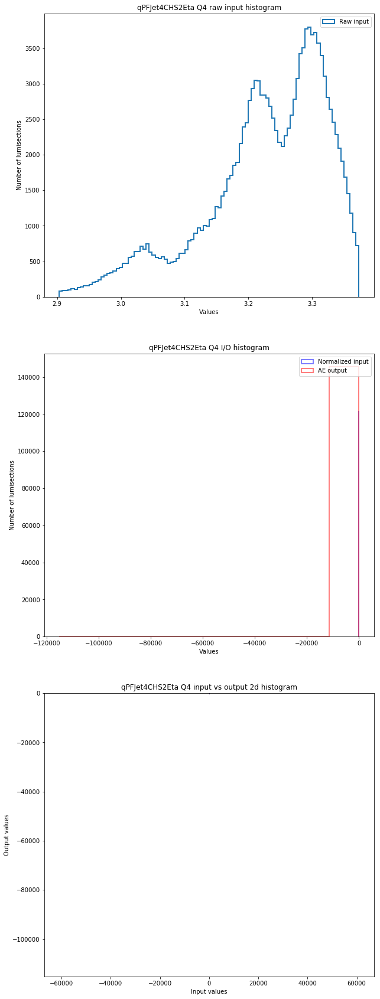

  7%|▋         | 209/2807 [31:41<6:33:53,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/209_qPFJet4CHS2Eta_Q5


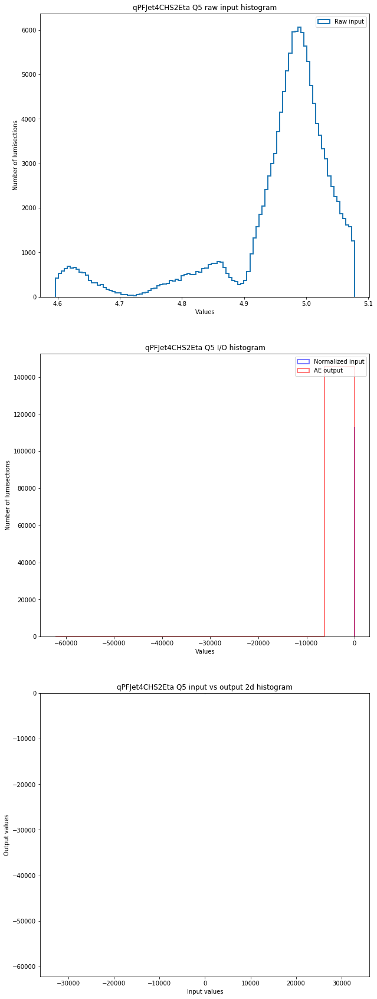

  7%|▋         | 210/2807 [31:52<6:34:07,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/210_qPFJet4CHS3Eta_mean


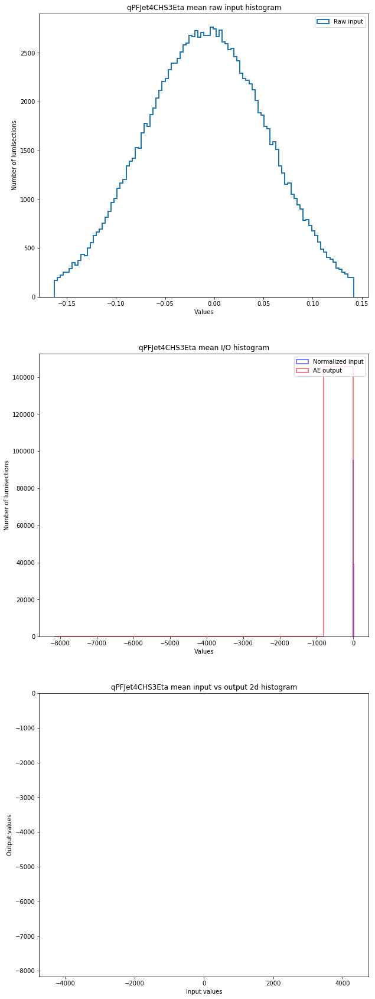

  8%|▊         | 211/2807 [32:00<6:33:45,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/211_qPFJet4CHS3Eta_RMS


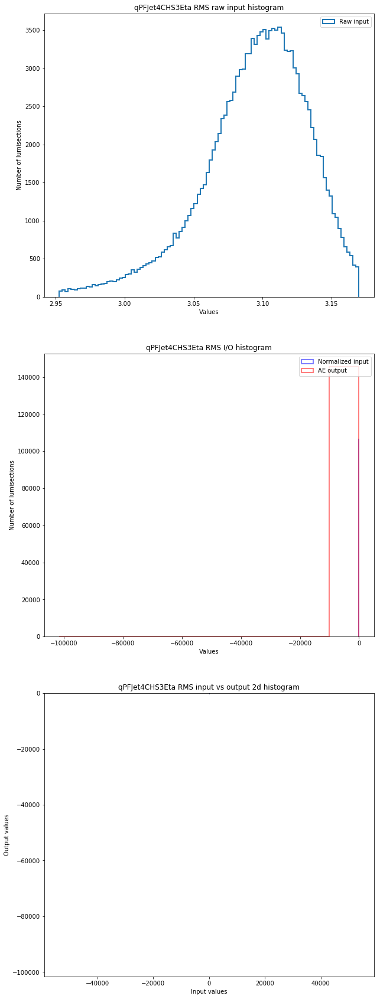

  8%|▊         | 212/2807 [32:09<6:33:32,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/212_qPFJet4CHS3Eta_Q1


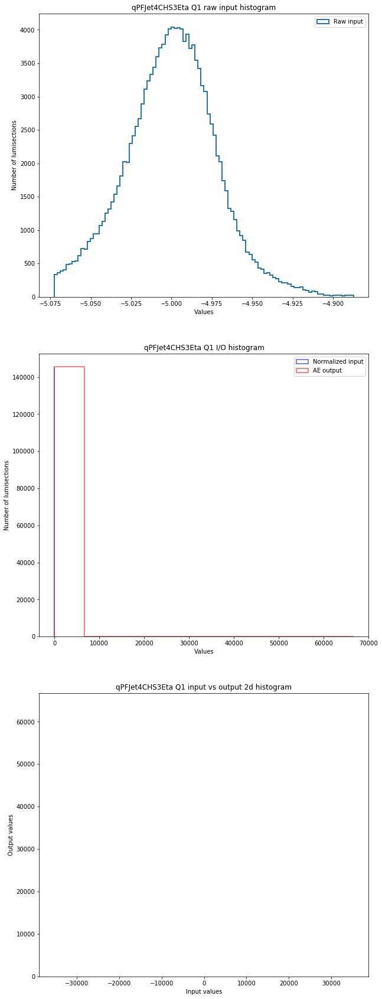

  8%|▊         | 213/2807 [32:19<6:33:37,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/213_qPFJet4CHS3Eta_Q2


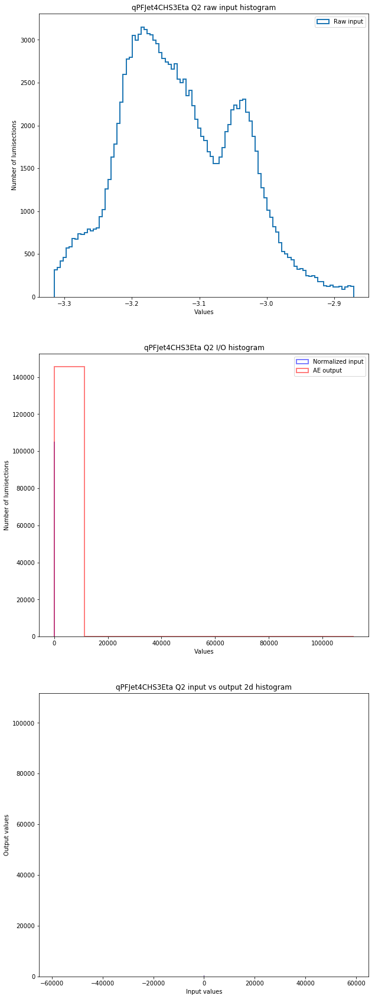

  8%|▊         | 214/2807 [32:28<6:33:26,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/214_qPFJet4CHS3Eta_Q3


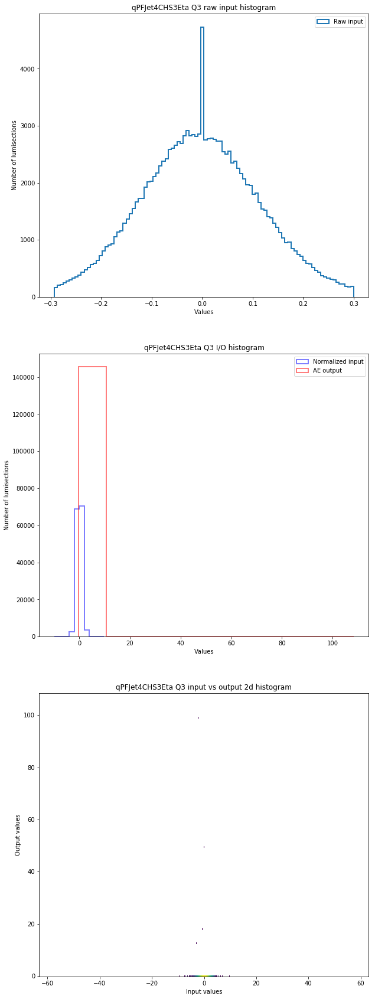

  8%|▊         | 215/2807 [32:37<6:33:15,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/215_qPFJet4CHS3Eta_Q4


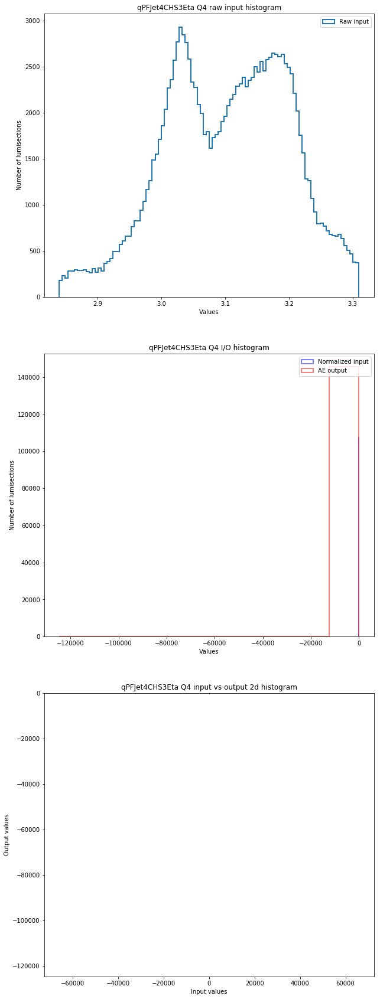

  8%|▊         | 216/2807 [32:46<6:33:10,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/216_qPFJet4CHS3Eta_Q5


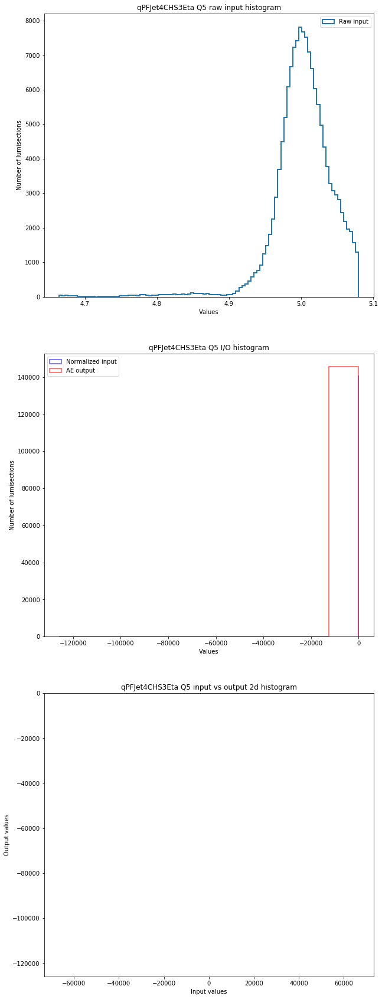

  8%|▊         | 217/2807 [32:57<6:33:17,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/217_qPFJet4CHS4Eta_mean


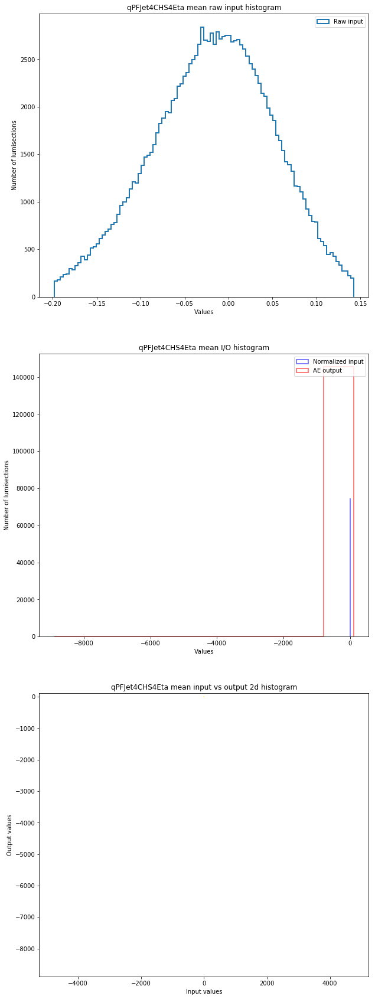

  8%|▊         | 218/2807 [33:06<6:33:11,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/218_qPFJet4CHS4Eta_RMS


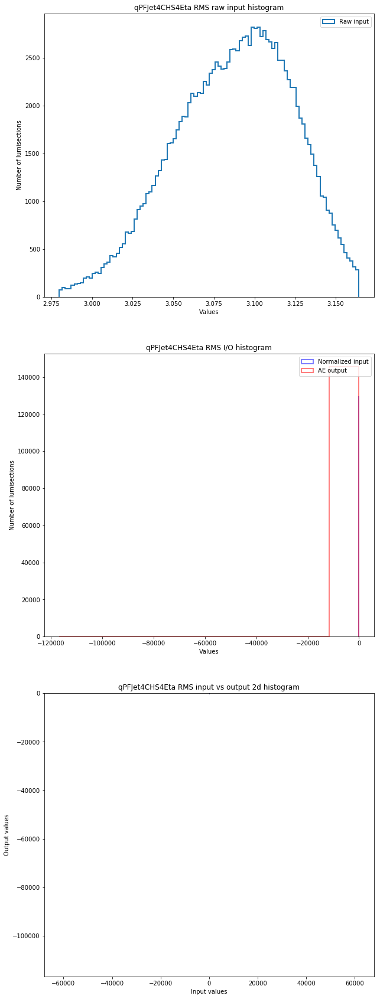

  8%|▊         | 219/2807 [33:15<6:33:03,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/219_qPFJet4CHS4Eta_Q1


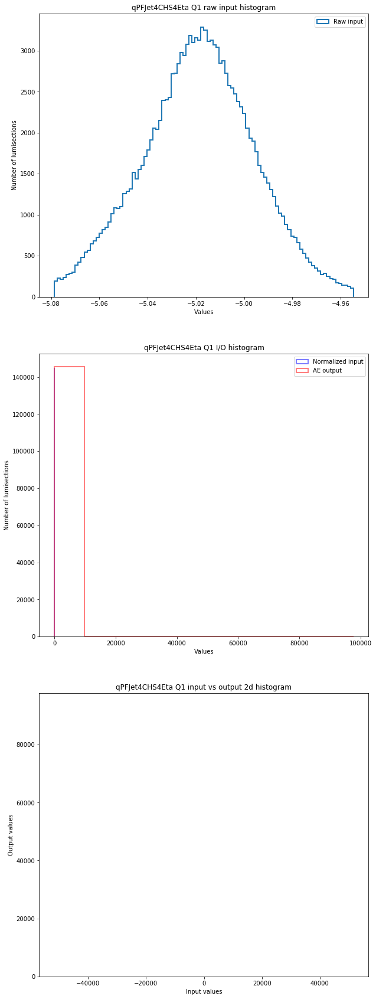

  8%|▊         | 220/2807 [33:26<6:33:10,  9.12s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/220_qPFJet4CHS4Eta_Q2


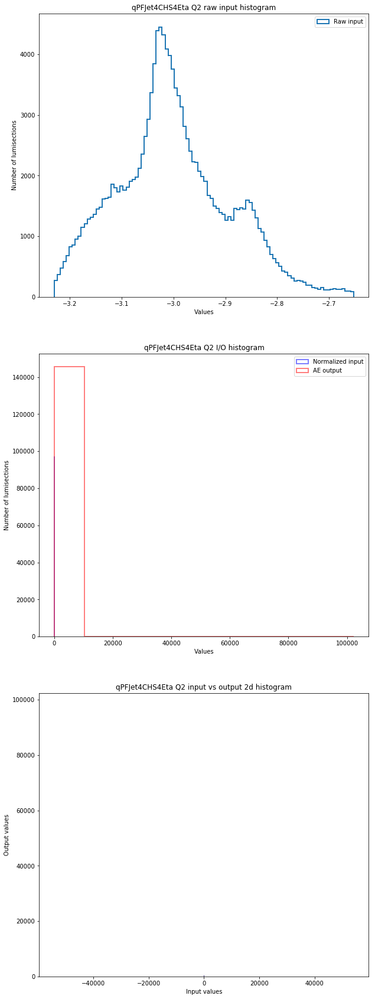

  8%|▊         | 221/2807 [33:35<6:32:59,  9.12s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/221_qPFJet4CHS4Eta_Q3


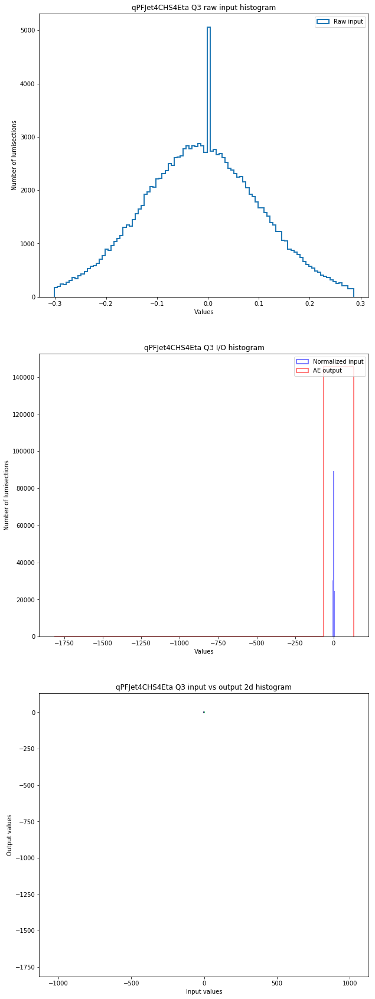

  8%|▊         | 222/2807 [33:43<6:32:40,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/222_qPFJet4CHS4Eta_Q4


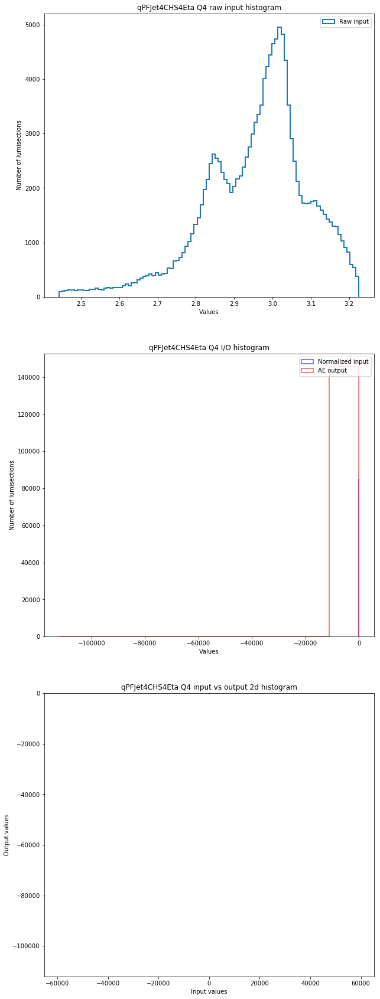

  8%|▊         | 223/2807 [33:53<6:32:38,  9.12s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/223_qPFJet4CHS4Eta_Q5


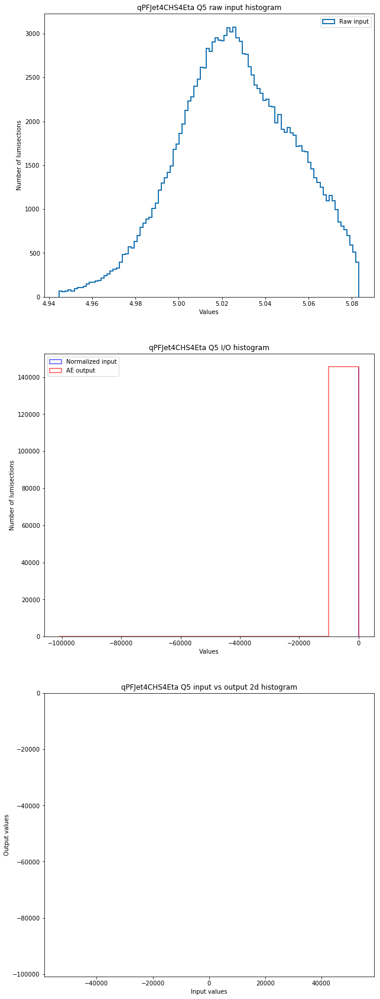

  8%|▊         | 224/2807 [34:02<6:32:33,  9.12s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/224_qPFJet4CHS5Eta_mean


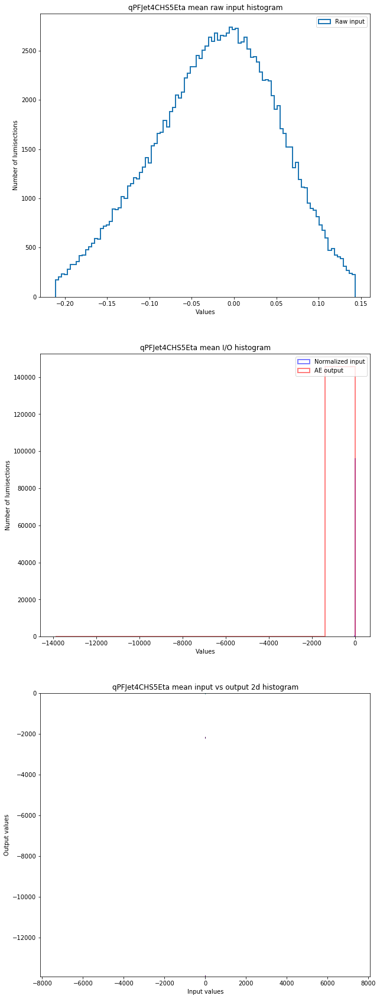

  8%|▊         | 225/2807 [34:10<6:32:12,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/225_qPFJet4CHS5Eta_RMS


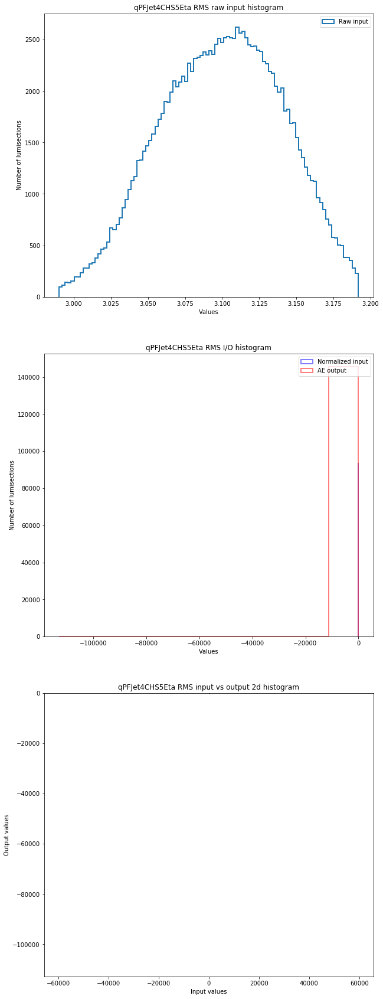

  8%|▊         | 226/2807 [34:19<6:32:05,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/226_qPFJet4CHS5Eta_Q1


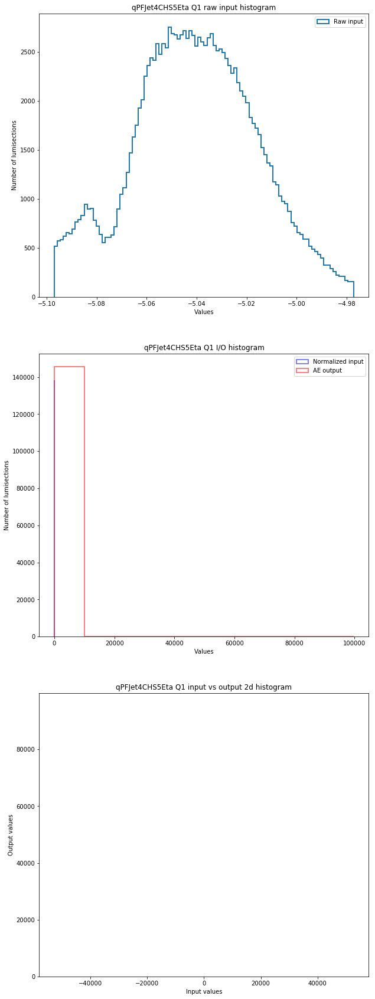

  8%|▊         | 227/2807 [34:28<6:31:47,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/227_qPFJet4CHS5Eta_Q2


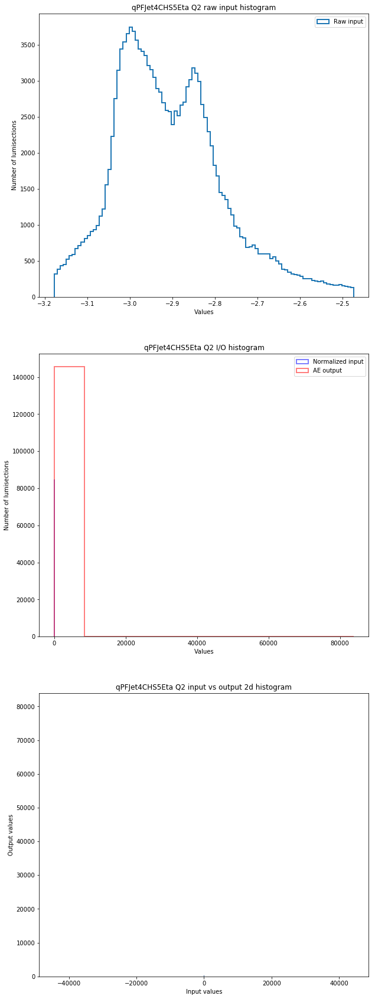

  8%|▊         | 228/2807 [34:37<6:31:34,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/228_qPFJet4CHS5Eta_Q3


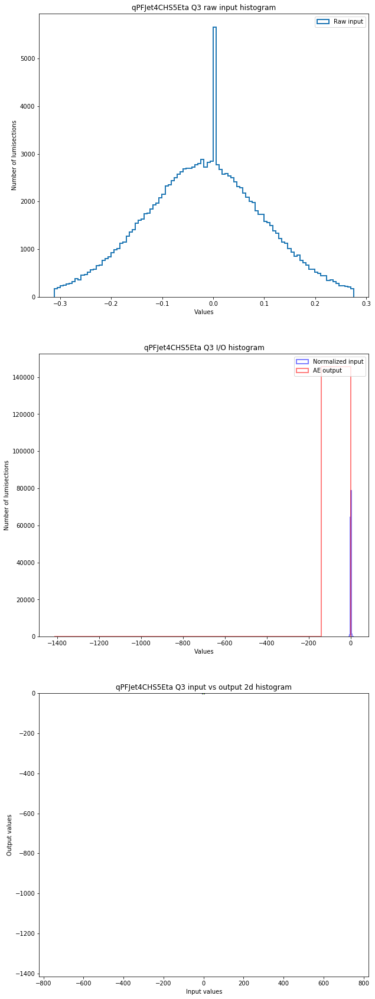

  8%|▊         | 229/2807 [34:45<6:31:19,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/229_qPFJet4CHS5Eta_Q4


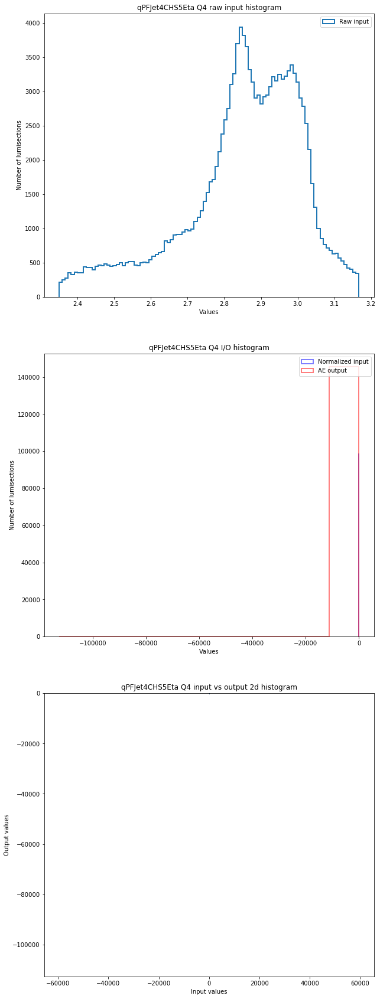

  8%|▊         | 230/2807 [34:53<6:31:00,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/230_qPFJet4CHS5Eta_Q5


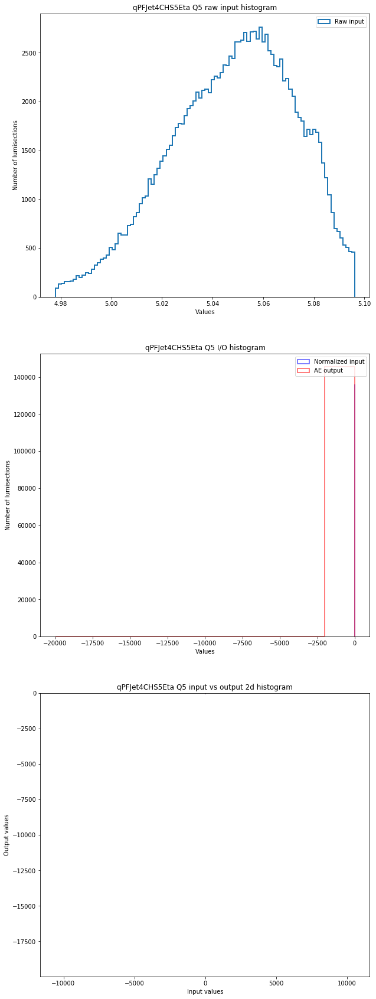

  8%|▊         | 231/2807 [35:02<6:30:47,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/231_qPFJet4CHS0Phi_mean


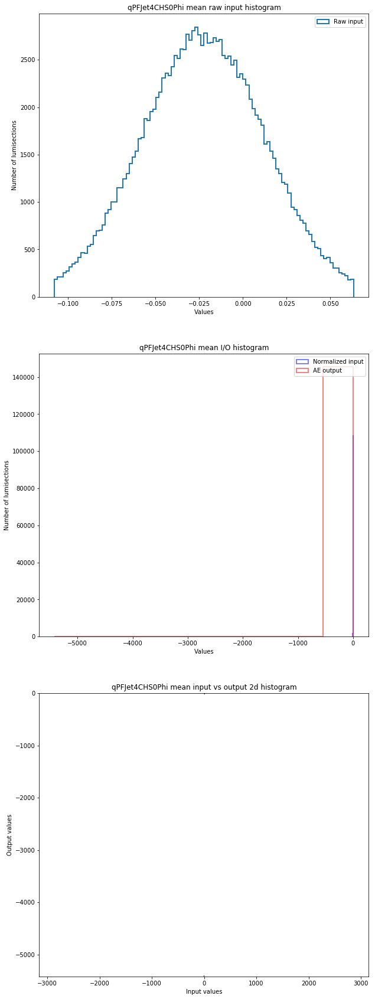

  8%|▊         | 232/2807 [35:11<6:30:36,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/232_qPFJet4CHS0Phi_RMS


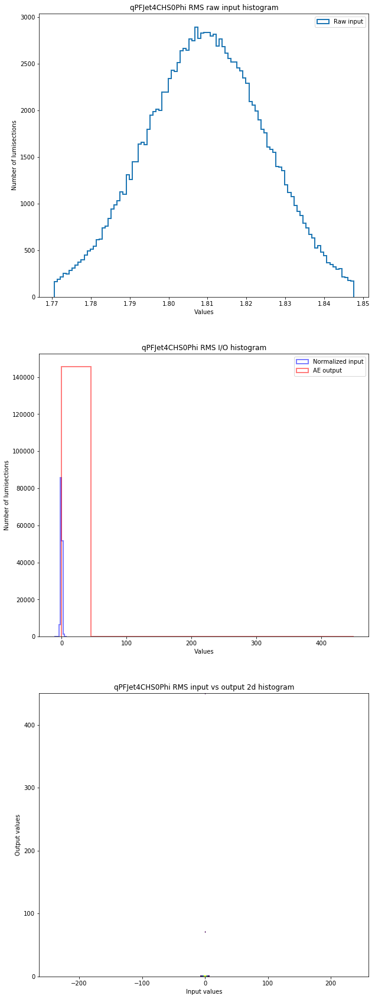

  8%|▊         | 233/2807 [35:21<6:30:39,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/233_qPFJet4CHS0Phi_Q1


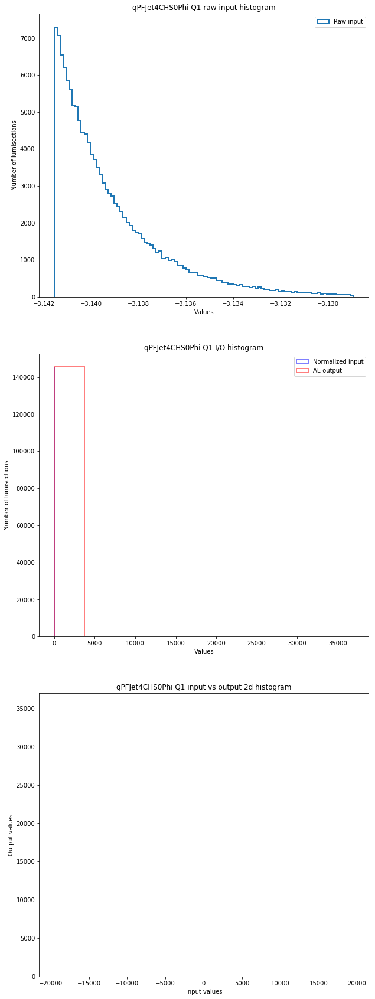

  8%|▊         | 234/2807 [35:30<6:30:26,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/234_qPFJet4CHS0Phi_Q2


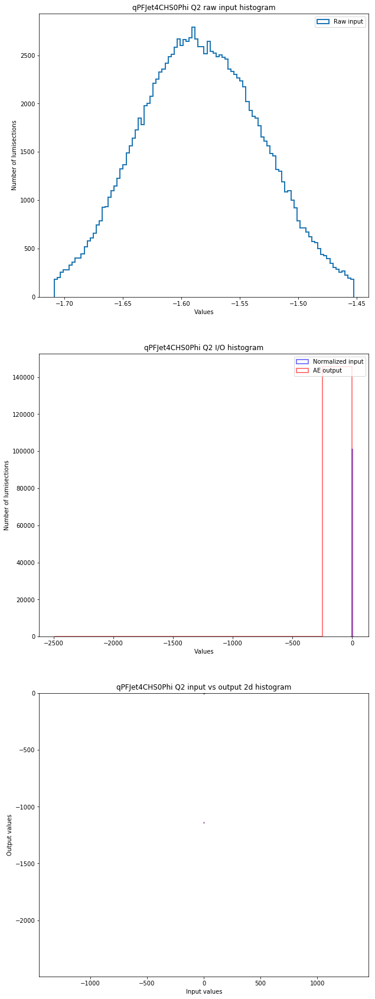

  8%|▊         | 235/2807 [35:40<6:30:21,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/235_qPFJet4CHS0Phi_Q3


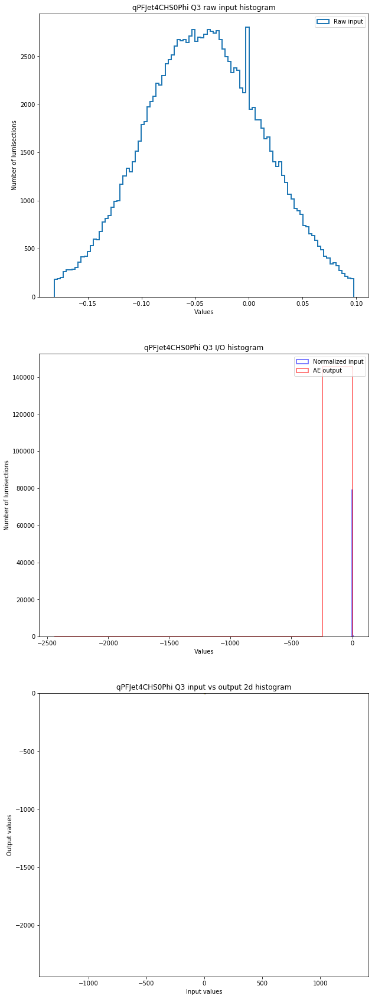

  8%|▊         | 236/2807 [35:47<6:29:55,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/236_qPFJet4CHS0Phi_Q4


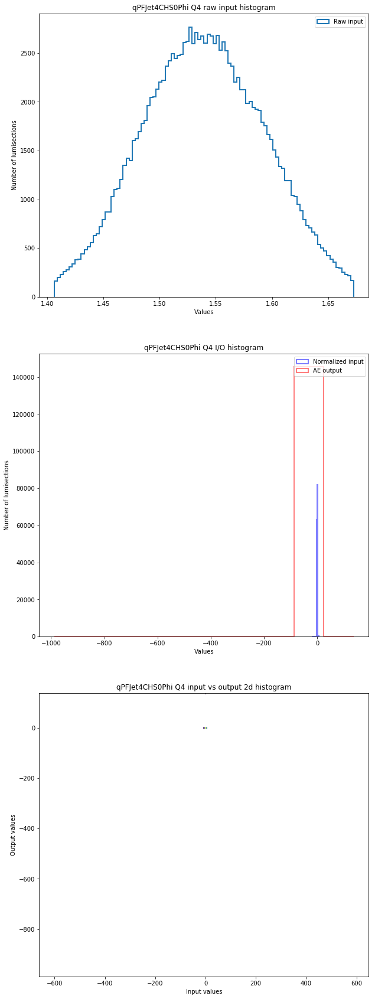

  8%|▊         | 237/2807 [35:57<6:29:58,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/237_qPFJet4CHS0Phi_Q5


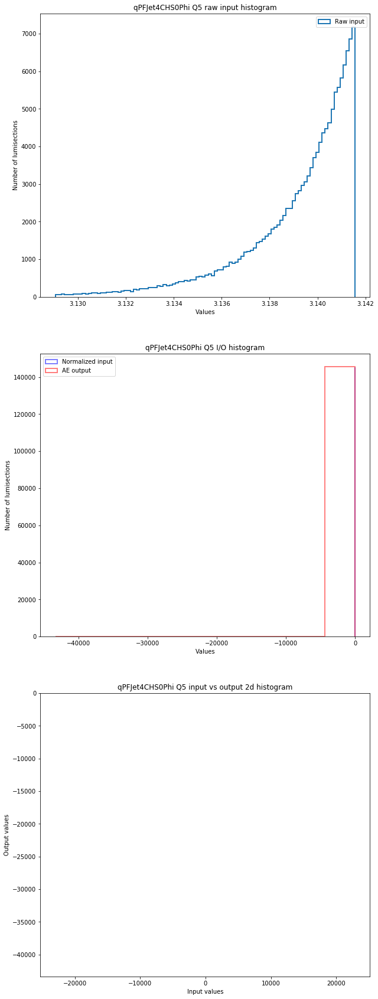

  8%|▊         | 238/2807 [36:05<6:29:36,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/238_qPFJet4CHS1Phi_mean


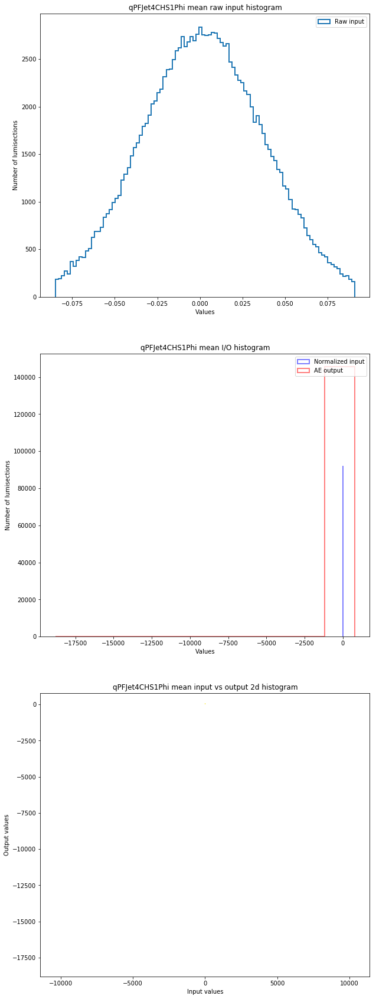

  9%|▊         | 239/2807 [36:14<6:29:19,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/239_qPFJet4CHS1Phi_RMS


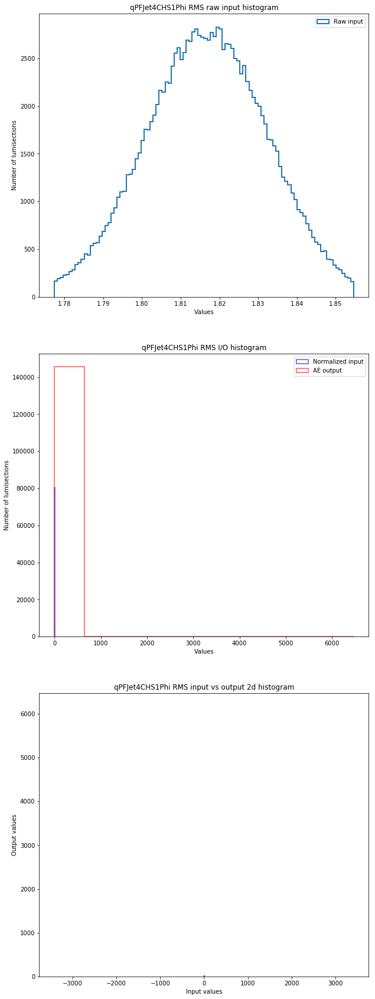

  9%|▊         | 240/2807 [36:24<6:29:20,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/240_qPFJet4CHS1Phi_Q1


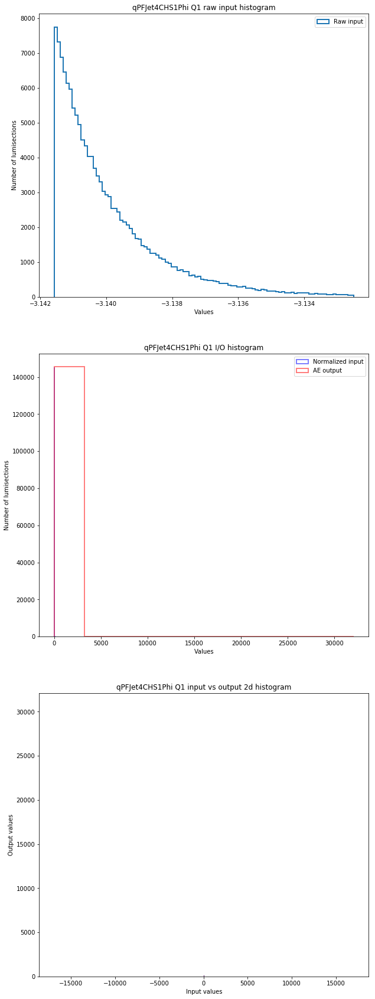

  9%|▊         | 241/2807 [36:32<6:29:07,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/241_qPFJet4CHS1Phi_Q2


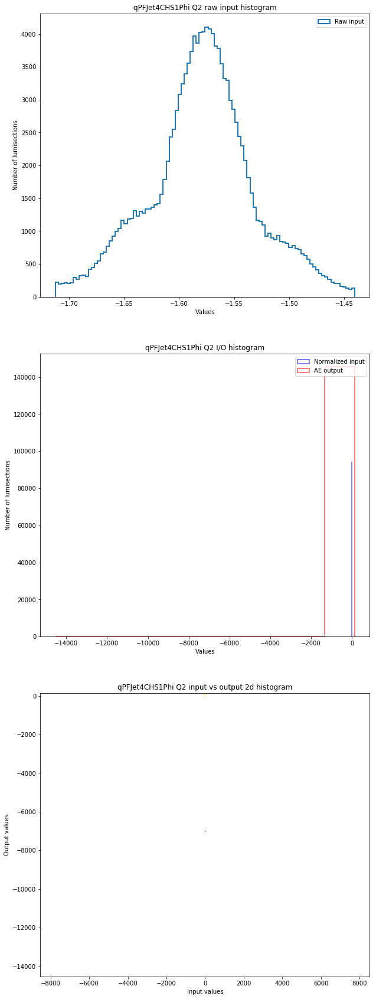

  9%|▊         | 242/2807 [36:42<6:29:03,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/242_qPFJet4CHS1Phi_Q3


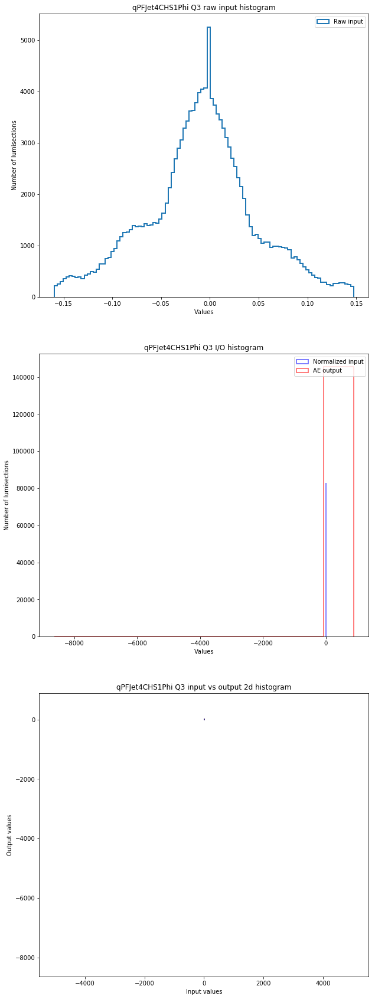

  9%|▊         | 243/2807 [36:50<6:28:45,  9.10s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/243_qPFJet4CHS1Phi_Q4


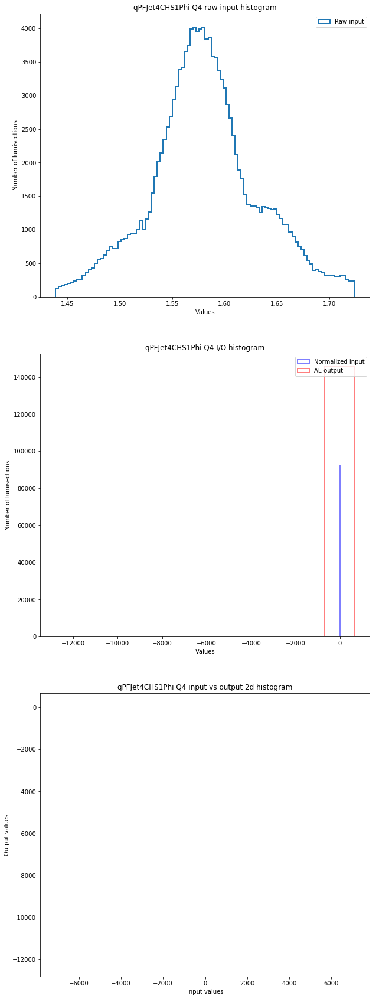

  9%|▊         | 244/2807 [37:01<6:28:58,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/244_qPFJet4CHS1Phi_Q5


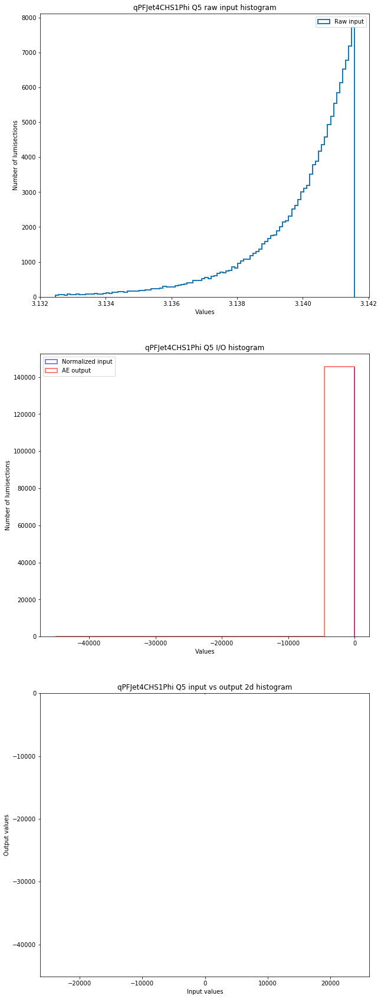

  9%|▊         | 245/2807 [37:11<6:28:53,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/245_qPFJet4CHS2Phi_mean


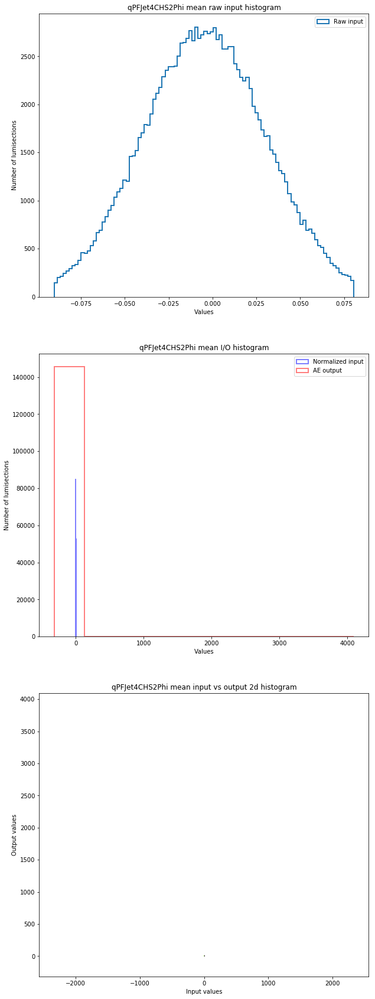

  9%|▉         | 246/2807 [37:19<6:28:38,  9.11s/it]

####################################################################################
/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/246_qPFJet4CHS2Phi_RMS


KeyboardInterrupt: 

In [22]:
plt.rcParams['figure.figsize'] = [10, 30]
plt_dir = '/afs/cern.ch/user/t/tkrzyzek/Documents/Data-Certification/visualization/features/'
bins = np.linspace(-50, 50, 50)
overlap = []
for i in tqdm(range(2807)):
    v, r = divmod(i, 7)
    
    good_input = normalized_data[normalized_data['label'] == 0].iloc[:, i].values.reshape(-1)
    good_output = ae_pred[y == 0][:, i].reshape(-1)
    filter_fraction = 1
    filtered_idx = (good_input < np.percentile(good_input, 100-filter_fraction))
    filtered_idx &= (good_input > np.percentile(good_input, filter_fraction))
    filtered_idx &= (good_output < np.percentile(good_output, 100-filter_fraction))
    filtered_idx &= (good_output > np.percentile(good_output, filter_fraction))
    good_input_filtered = good_input[filtered_idx]
    good_output_filtered = good_output[filtered_idx]
    
#     print(len(good_input_filtered))
#     print(len(good_input))
    cut = 100 * (1 - len(good_input_filtered) / len(good_input))
#     print(cut)
    overlap_frac = 100 * (4-cut)/2
#     print(overlap_frac)
    overlap.append(overlap_frac)
    
    good_input_orig = data[data['label'] == 0].iloc[:, i].values.reshape(-1)
    filtered_orig_idx = (good_input_orig < np.percentile(good_input_orig, 100-filter_fraction))
    filtered_orig_idx &= (good_input_orig > np.percentile(good_input_orig, filter_fraction))
    good_input_orig_filtered = good_input_orig[filtered_orig_idx]
    
    fig, axes = plt.subplots(3, 1)
    
    axes[0].hist(good_input_orig_filtered, 100, histtype='step', linewidth=2, label="Raw input")
    axes[0].set_title(feature_names[v] + ' ' + var_legend[r]['name'] + ' raw input histogram')
    axes[0].set_xlabel('Values')
    axes[0].set_ylabel('Number of lumisections')
    axes[0].legend()
    
    axes[1].hist(good_input_filtered, alpha=0.5, histtype='step', linewidth=2, color='b', 
          label="Normalized input")
    axes[1].hist(good_output_filtered, alpha=0.5, histtype='step', linewidth=2, color='r', 
          label="AE output")
    axes[1].set_xlabel('Values')
    axes[1].set_ylabel('Number of lumisections')
    axes[1].legend()
    axes[1].set_title(feature_names[v] + ' ' + var_legend[r]['name'] + ' I/O histogram')
    
    axes[2].hist2d(good_input_filtered, good_output_filtered, norm=LogNorm(), bins=200)
    axes[2].set_title(feature_names[v] + ' ' + var_legend[r]['name'] 
                      + ' input vs output 2d histogram')
    axes[2].set_xlabel('Input values')
    axes[2].set_ylabel('Output values')
    axes[2].axis('equal')
    
    print(plt_dir + str(i) + '_' + feature_names[v] + '_' + var_legend[r]['name'])
#     plt.savefig(plt_dir + str(i) + '_' + feature_names[v] + '_' + var_legend[r]['name'])
    plt.show()
    plt.close()
    print('####################################################################################')

In [15]:
np.mean(overlap)

NameError: name 'overlap' is not defined

In [53]:
overlap

[31.436347890634696,
 26.659518605578292,
 -65.09684248147703,
 39.51228229342778,
 38.13765516103778,
 35.560229287805825,
 9.923433268725734,
 8.411343423096284,
 41.53985731370362,
 13.77238923941908,
 40.577618321030286,
 9.167388345911288,
 37.14105049005472,
 8.06768663999906,
 7.895858248449894,
 7.55220146535267,
 3.0846632850837663,
 8.273880709857394,
 9.820336233796567,
 14.150411700826027,
 5.937014584794054,
 13.806754917728803,
 13.0507099949138,
 -1437.5589371383014,
 2.603543788747098,
 5.455895088457385,
 7.380373073803503,
 9.923433268725734,
 30.68030296782025,
 29.511869905288023,
 -1958.2333292094518,
 31.436347890634696,
 25.80037664783412,
 18.652315559404652,
 9.785970555486845,
 22.879293991504944,
 24.906869011780785,
 -2196.456211252698,
 35.04474411315943,
 35.76642335766416,
 34.460527581893594,
 11.916642610691852,
 33.18899748443221,
 21.298472789256053,
 -2396.8424814768996,
 36.9004907418861,
 36.62556531540832,
 36.488102602169434,
 18.10246470644854,


In [32]:
idx_1414 = np.where(data[1414+3] == 0)[0]
idx_931 = np.where(data[931+3] == 0)[0]

In [33]:
variance = np.var(normalized_data.iloc[:, :2808], axis=1)

In [34]:
def pred_vs_feature(x_val, y_val, y_class, y_name="", x_name="", selected=[], linear=False,
                    limit=False):
    '''
    Plots two arbitrary values agains each other.
    '''
    df = pd.DataFrame({'y_val': y_val,
                       'x_val': x_val,
                       'y_class': y_class})

    groups = df.groupby('y_class')
    fig, ax = plt.subplots()

    for name, group in groups:
        ax.plot(group.x_val, 
                group.y_val,
                color="r" if name == 1 else "g",
                marker='o',
                ms=2,
                linestyle='',
                alpha=0.5,
                label= "Anomaly" if name == 1 else "Normal")
    
    for s in selected:
        ax.plot(s,
                variance[s],
#                 color="b",
                marker='o',
                ms=2,
                linestyle='',
                alpha=0.5,
                label='Selected')
                 
    ax.legend()
    if not linear:
        ax.set_yscale('log')
    if limit:
        plt.xlim([limit[0], limit[1]])
    plt.grid()
    plt.ylabel(y_name)
    plt.xlabel(x_name)
    plt.show()

/opt/anaconda3/lib/python3.6/site-packages/pandas/core/series.py:841: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


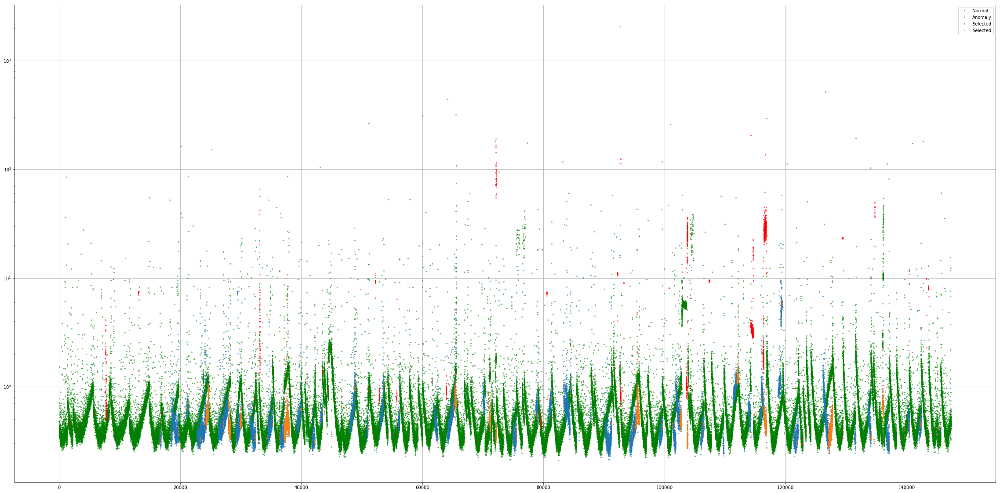

In [35]:
plt.rcParams['figure.figsize'] = [40, 20]
pred_vs_feature(range(len(variance)), variance, data['label'], selected=[idx_1414, idx_931])